# Import libraries 

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
#from transformers import BertModel, BertTokenizer
from scipy.optimize import linear_sum_assignment
from sklearn.metrics import confusion_matrix
from sklearn.metrics import adjusted_rand_score
from torch.utils.data import DataLoader
import gensim
import gensim.downloader as gensim_api
from gensim.models import KeyedVectors
from gensim.test.utils import common_texts
from gensim.models import Word2Vec
from tqdm import tqdm
import requests
import warnings
import torch
import re

import nltk
#nltk.download()
from nltk.corpus import stopwords



from sklearn import preprocessing



!pip install gdown
import gdown

import gzip

In [ ]:
from sklearn.cluster import KMeans
from sklearn.cluster import SpectralClustering
from sklearn.metrics.cluster import normalized_mutual_info_score
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE

# Fonctions utilitaires 

In [ ]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [ ]:

from nltk.stem import WordNetLemmatizer
import string
import re
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords

nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')
stopwords = set(stopwords.words("english"))

wl = WordNetLemmatizer()

def clean_text(text):
  # Remove ponctuation
  text = text.translate(str.maketrans('', '', string.punctuation))
  text = re.sub('[0-9]+', '', text) # remove numbers
  word_tokens = word_tokenize(text)
  filtered_sentence = [wl.lemmatize(w) for w in word_tokens if not w.lower() in stopwords]
  text = " ".join(filtered_sentence)
  return text

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
token_pattern = r"(?u)\b\w\w+\b"
token_pattern = re.compile(token_pattern)

def _make_cost_m(cm):
    s = np.max(cm)
    return (- cm + s)

def accuracy(true_row_labels, predicted_row_labels):
    cm = confusion_matrix(true_row_labels, predicted_row_labels)
    # deprecated: indexes = linear_assignment(_make_cost_m(cm))
    indexes = linear_sum_assignment(_make_cost_m(cm))
    total = 0
    for row, column in zip(*indexes):
        value = cm[row][column]
        total += value

    return (total * 1. / np.sum(cm))

def tokenize_re(text, min_len=2):
    tokens = token_pattern.findall(text)
    return [x for x in tokens if len(x) >= min_len]

def static_document_embeddings(word_embedding_func, docs, tokenizer, n_dims=300):
    """
        Given a set of tokenized sentences, compute the mean vector of w2v vectors for each sentence
    """
    doc_vectors = []
    for doc in docs:
        doc = tokenizer(doc)
        word_vectors = []
        for word in doc:
            vector = word_embedding_func(word)
            if vector is not None:
                word_vectors.append(vector)
        if word_vectors:
            doc_vector = np.array(word_vectors).mean(axis=0)
        else:
            warnings.warn("Zeros returned. Words not in vocabulary \"{}\"".format(doc), Warning)
            doc_vector = np.array([0] * n_dims)
        
        doc_vectors.append(doc_vector)
    return np.array(doc_vectors)


In [ ]:
def eval_clustering_2D(X_reduced, pred_labels, labels):
  plt.figure(figsize = (15, 8))
  nmi = normalized_mutual_info_score(labels,pred_labels )
  plt.suptitle('NMI = ' + str(normalized_mutual_info_score(labels,pred_labels )))
  #plt.suptitle('ACCURACY' + str(accuracy(labels,pred_labels)))
  #plt.suptitle('ACCURACY' + str(adjusted_rand_score(labels,pred_labels)))

  plt.subplot(1, 2, 1)
  plt.title("Predicted_labels")
  plt.scatter(x = X_reduced[:, 0], y = X_reduced[:, 1],c = pred_labels)
  plt.subplot(1, 2, 2)
  plt.title("Labels")
  plt.scatter(x = X_reduced[:, 0], y = X_reduced[:, 1], c = labels)

In [ ]:
def eval_clustering_2D_nolabels(X_reduced, pred_labels):
  plt.figure(figsize = (15, 8))

  plt.title("Predicted_labels")
  plt.scatter(x = X_reduced[:, 0], y = X_reduced[:, 1],c = pred_labels)


In [ ]:
def printMetrics(labels, pred_labels):
  print("normalized_mutual_info_score: ",round(normalized_mutual_info_score(pred_labels,labels), 2),"%")
  print("Accuracy: ",round(accuracy(labels,pred_labels),2),"%")
  print("Adjusted Rand Index: ",round(adjusted_rand_score(labels, pred_labels),2),"%")

In [ ]:
from torch.utils.data import DataLoader
import numpy as np
import torch
from tqdm import tqdm


class AutoEncoder(torch.nn.Module):
    def __init__(self, input_dim, embedding_dim):
        super().__init__()
        self.input_dim = input_dim
        self.embedding_dim = embedding_dim

        self.encoder = torch.nn.Sequential(
            torch.nn.Linear(self.input_dim, 128),
            torch.nn.ReLU(),
            torch.nn.Linear(128, self.embedding_dim)
        )
        
        self.decoder = torch.nn.Sequential(
            torch.nn.Linear(self.embedding_dim, 128),
            torch.nn.ReLU(),
            torch.nn.Linear(128, self.input_dim),
            torch.nn.Sigmoid()
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

def autoencoder(X, embedding_dim, n_epochs=50, batch_size=64, learning_rate=1e-3, weight_decay=1e-8, seed=None, return_model=False):
    if torch.cuda.is_available():
        device = 'cuda'
    else:
        device = 'cpu'

    if seed is not None:
      torch.manual_seed(seed)

    dataloader = DataLoader(dataset=X, batch_size=batch_size, shuffle=True)

    model = AutoEncoder(input_dim=X.shape[1], embedding_dim=embedding_dim)

    if device == 'cuda':
      model.cuda()

    loss_function = torch.nn.MSELoss()

    optimizer = torch.optim.Adam(model.parameters(),
                                lr=learning_rate,
                                weight_decay=weight_decay)

    losses = []

    model.train()
    for epoch in tqdm(range(n_epochs)):
        for batch in dataloader:
          batch = batch.to(device)
          reconstructed = model(batch)
          
          loss = loss_function(reconstructed, batch)
          
          optimizer.zero_grad()
          loss.backward()
          optimizer.step()
          
          losses.append(loss)

    model.eval()
    tensor_X = torch.tensor(X)
    tensor_X = tensor_X.to(device)
    encoded_X = model.encoder(tensor_X)
    encoded_X = encoded_X.detach().cpu().numpy()

    if return_model:
      return encoded_X, model, losses
    else:
      return encoded_X

# Import data 

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!google-drive-ocamlfuse -cc

/bin/bash: google-drive-ocamlfuse: command not found


In [ ]:
X = pd.read_csv("/content/drive/MyDrive/M2 MLDS/nlp_dataset_Articles_1.csv", sep='\t')

In [ ]:
X

,text
0,Eli Manning remains the New York Giants' quart...
1,Just an extra hour of exercise a week could si...
2,AP - The Boston Red Sox are to send hobbled st...
3,BASEBALL Arizona (NL): Named Bob Gebhard assis...
4,"CFHT -- Twenty-five years ago, on September 28..."
...,...
3980,"GEORGE TOWN, Cayman Islands - A strengthened H..."
3981,"Find.com, a business search engine (www.find.c..."
3982,If you #39;ve followed Arkansas football for t...
3983,Loren Woods had 17 points and a career-high 14...


In [ ]:
texts = X['text'].apply(str)

In [ ]:
texts

0       Eli Manning remains the New York Giants' quart...
1       Just an extra hour of exercise a week could si...
2       AP - The Boston Red Sox are to send hobbled st...
3       BASEBALL Arizona (NL): Named Bob Gebhard assis...
4       CFHT -- Twenty-five years ago, on September 28...
                              ...                        
3980    GEORGE TOWN, Cayman Islands - A strengthened H...
3981    Find.com, a business search engine (www.find.c...
3982    If you #39;ve followed Arkansas football for t...
3983    Loren Woods had 17 points and a career-high 14...
3984    NEW YORK - A sluggish gross domestic product r...
Name: text, Length: 3985, dtype: object

# Glove

## Import du modèle Glove

In [ ]:
!pip install gdown
import gdown
import gzip

In [ ]:
url_glove = 'https://nlp.stanford.edu/data/glove.840B.300d.zip'
gdown.download(url_glove, quiet=False, output='glove.zip')

Downloading...
From: https://nlp.stanford.edu/data/glove.840B.300d.zip
To: /content/glove.zip
100%|██████████| 2.18G/2.18G [06:52<00:00, 5.28MB/s]


'glove.zip'

In [ ]:
!unzip glove.zip

Archive:  glove.zip
  inflating: glove.840B.300d.txt     


In [ ]:
from gensim.test.utils import datapath, get_tmpfile
from gensim.models import KeyedVectors
from gensim.scripts.glove2word2vec import glove2word2vec

glove_file = datapath('/content/glove.840B.300d.txt')
tmp_file = get_tmpfile("/content/glove.w2v.txt")
_ = glove2word2vec(glove_file, tmp_file)
glove_model = KeyedVectors.load_word2vec_format(tmp_file)

##Création de l'embedding Glove

In [ ]:
get_glove_vector = lambda x: glove_model[x] if x in glove_model.vocab else None

In [ ]:
X_glove = static_document_embeddings(get_glove_vector, texts, tokenize_re)
X_glove.shape

(3985, 300)

## Détermination du nombre de clusters

In [ ]:
def findBestKWithKMeans(X):

  sum_of_squared_distances = []
  K = range(1,10)
  for k in K:
      k_means = KMeans(n_clusters=k, random_state=42, n_init=10)
      model = k_means.fit(X)
      sum_of_squared_distances.append(k_means.inertia_)

  plt.plot(K, sum_of_squared_distances, 'bx-')
  plt.xlabel('k')
  plt.ylabel('sum_of_squared_distances')
  plt.title('elbow method for optimal k')
  plt.show()

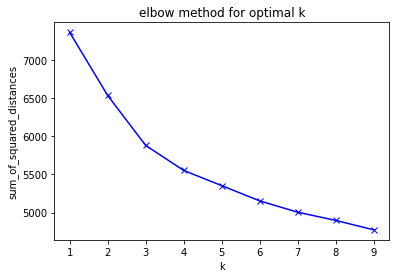

In [ ]:
findBestKWithKMeans(X_glove)

La méthode du coude avec KMeans sur l'espace d'origine nous donne un K optimal plutôt à 3

In [ ]:
# Dendogram for Hierarchical Clustering
import scipy.cluster.hierarchy as shc


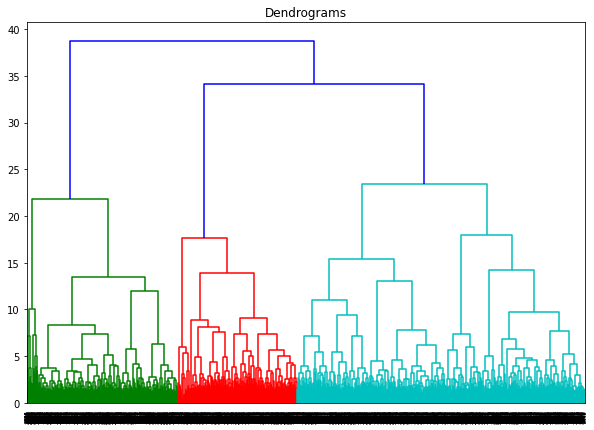

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 7))  
plt.title("Dendrograms")  
dend = shc.dendrogram(shc.linkage(X_glove, method='ward'))

En affichant le dendrogramme, nous pouvons voir que la meilleure valeur de K semble être 3 (4 étant aussi une bonne possibilité).

In [ ]:
!pip install hdbscan
import hdbscan

     |████████████████████████████████| 6.4 MB 4.1 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for hdbscan: filename=hdbscan-0.8.27-cp37-cp37m-linux_x86_64.whl size=2311949 sha256=970d464a3421974942bee1073a3a126c0003dc41a37269248ac38fae59a9f681
  Stored in directory: /root/.cache/pip/wheels/73/5f/2f/9a259b84003b84847c259779206acecabb25ab56f1506ee72b
Successfully built hdbscan


In [ ]:
#unique, counts = np.unique(pred_labels, return_counts=True)
#dict(zip(unique, counts))

{-1: 2919, 0: 459, 1: 306, 2: 301}

In [ ]:
!pip install umap-learn

     |████████████████████████████████| 86 kB 4.6 MB/s 
     |████████████████████████████████| 1.1 MB 36.0 MB/s 
  Created wheel for umap-learn: filename=umap_learn-0.5.2-py3-none-any.whl size=82709 sha256=acd4fc3e3e867c2b1607d25411530e6bc283d45d1cf507256d7774b99a7c5aeb
  Stored in directory: /root/.cache/pip/wheels/84/1b/c6/aaf68a748122632967cef4dffef68224eb16798b6793257d82
  Created wheel for pynndescent: filename=pynndescent-0.5.5-py3-none-any.whl size=52603 sha256=b418156e3f5b03c91d17833034289316c42f9a42deb66cab75e57784cbb3b834
  Stored in directory: /root/.cache/pip/wheels/af/e9/33/04db1436df0757c42fda8ea6796d7a8586e23c85fac355f476
Successfully built umap-learn pynndescent


Nous avons vu sur les dataset supervisés que UMAP et TSNE étaient les plus efficaces pour obtenir un espace réduit intéressant à partir d'un embedding Glove. En appliquant la méthode du coude sur ces espaces réduits, nous allons voir si le k optimal optenu ainsi est cohérent avec ce qu'on a sur l'espace d'origine.

In [ ]:
from umap import UMAP

X_glove_umap = UMAP(n_components=2, random_state=42).fit_transform(X_glove)

/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)


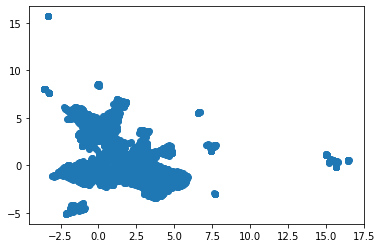

In [ ]:
plt.scatter(x = X_glove_umap[:, 0], y = X_glove_umap[:, 1])

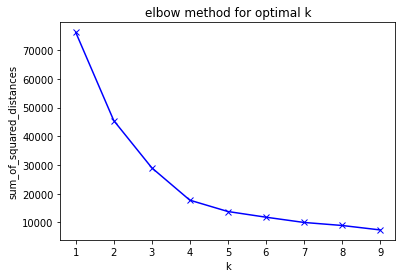

In [ ]:
findBestKWithKMeans(X_glove_umap)

Avec UMAP, le coude est plutôt à K = 4.

In [ ]:
from sklearn.manifold import TSNE
X_glove_tsne = TSNE(n_components=2, random_state=42).fit_transform(X_glove)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


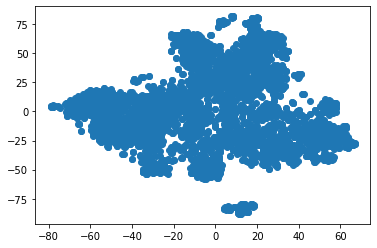

In [ ]:
plt.scatter(x = X_glove_tsne[:, 0], y = X_glove_tsne[:, 1])

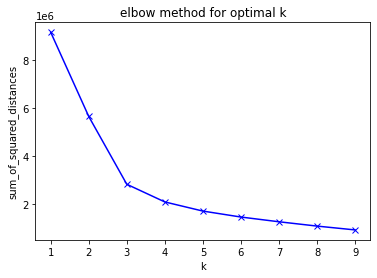

In [ ]:
findBestKWithKMeans(X_glove_tsne)

Avec TSNE, le coude est bien visible à K = 3

Au vu de tous les résultats précédents, nous choisissons K = 3, la valeur qui fait à peu près consensus.

In [ ]:
k = 3

In [ ]:
from sklearn.metrics import silhouette_score

def printSilhouetteScores(X, labels, X_reduced=None):
  print("Silhouette score dans l'espace d'origine (distance cosine) :")
  print(silhouette_score(X, labels, metric='cosine'))
  if (X_reduced is not None):
    print("Silhouette score dans l'espace réduit(distance euclidienne) :")
    print(silhouette_score(X_reduced, labels))


## Clustering dans l'espace d'origine

### KMeans

In [ ]:
pred_labels = KMeans(k,random_state=42).fit(X_glove).labels_
printSilhouetteScores(X_glove, pred_labels)


Silhouette score dans l'espace d'origine (distance cosine) :
0.21039939


### Spectral Clustering

In [ ]:
pred_labels=SpectralClustering(k,affinity='nearest_neighbors',n_neighbors=10,random_state=42).fit(X_glove).labels_
printSilhouetteScores(X_glove, pred_labels)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


Silhouette score dans l'espace d'origine (distance cosine) :
0.42099118


### HDBSCAN

In [ ]:
X_glove_sc = StandardScaler().fit_transform(X_glove)
hdbscan_model = hdbscan.HDBSCAN(algorithm= 'best', alpha=1.0, leaf_size=40,min_cluster_size=50, cluster_selection_method='eom', metric='braycurtis').fit(X_glove_sc)
pred_labels= hdbscan_model.labels_
printSilhouetteScores(X_glove, pred_labels)

Silhouette score dans l'espace d'origine (distance cosine) :
0.021151446


### CAH

In [ ]:
from sklearn.cluster import AgglomerativeClustering

pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit(X_glove).labels_
printSilhouetteScores(X_glove, pred_labels)

Silhouette score dans l'espace d'origine (distance cosine) :
0.18916129


## Approches Tandem

### UMAP

In [ ]:
from umap import UMAP

X_glove_umap = UMAP(n_components= 2, random_state=42).fit_transform(X_glove)

#### UMAP + KMeans

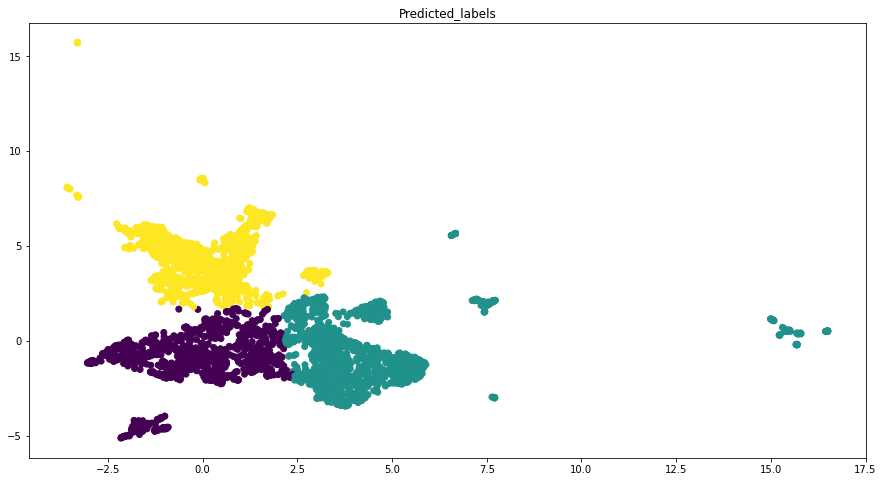

In [ ]:
pred_labels = KMeans(k,random_state=42).fit(X_glove_umap).labels_
eval_clustering_2D_nolabels(X_glove_umap, pred_labels)

In [ ]:
printSilhouetteScores(X_glove, pred_labels, X_glove_umap)

Silhouette score dans l'espace d'origine (distance cosine) :
0.1437663
Silhouette score dans l'espace réduit(distance euclidienne) :
0.44784436


#### UMAP + Spectral Clustering

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


Silhouette score dans l'espace d'origine (distance cosine) :
0.08754204
Silhouette score dans l'espace réduit(distance euclidienne) :
0.35807225


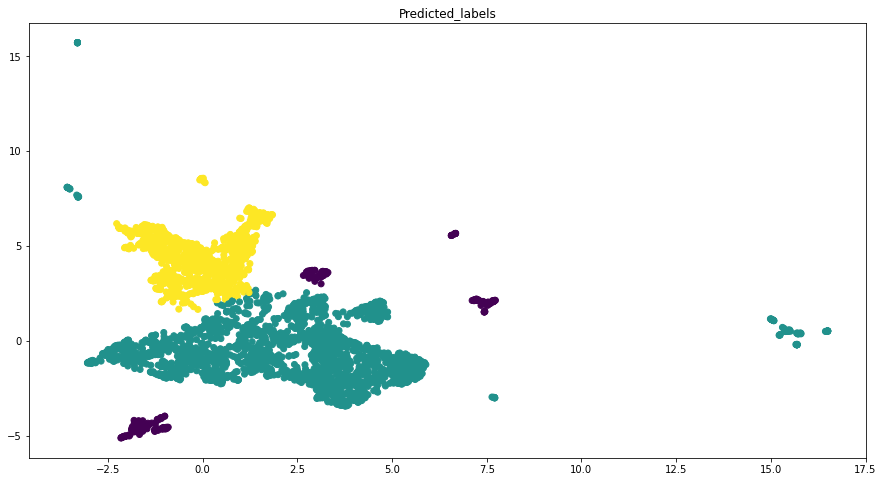

In [ ]:
pred_labels=SpectralClustering(k,affinity='nearest_neighbors',n_neighbors=25,random_state=42).fit(X_glove_umap).labels_
eval_clustering_2D_nolabels(X_glove_umap, pred_labels)
printSilhouetteScores(X_glove, pred_labels, X_glove_umap)

#### UMAP + HDBSCAN

Silhouette score dans l'espace d'origine (distance cosine) :
0.121150784
Silhouette score dans l'espace réduit(distance euclidienne) :
0.34706885


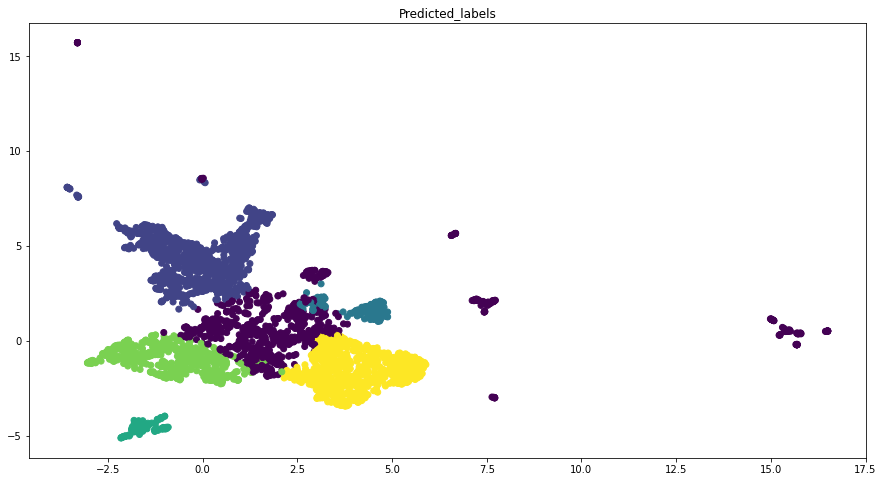

In [ ]:
X_glove_sc = StandardScaler().fit_transform(X_glove_umap)
hdbscan_model = hdbscan.HDBSCAN(algorithm= 'best', alpha=1.0, leaf_size=40,min_cluster_size=100, cluster_selection_method='eom', metric='braycurtis').fit(X_glove_sc)
pred_labels= hdbscan_model.labels_
eval_clustering_2D_nolabels(X_glove_umap, pred_labels)
printSilhouetteScores(X_glove, pred_labels, X_glove_umap)

#### UMAP + CAH

Silhouette score dans l'espace d'origine (distance cosine) :
0.13933055
Silhouette score dans l'espace réduit(distance euclidienne) :
0.4299339


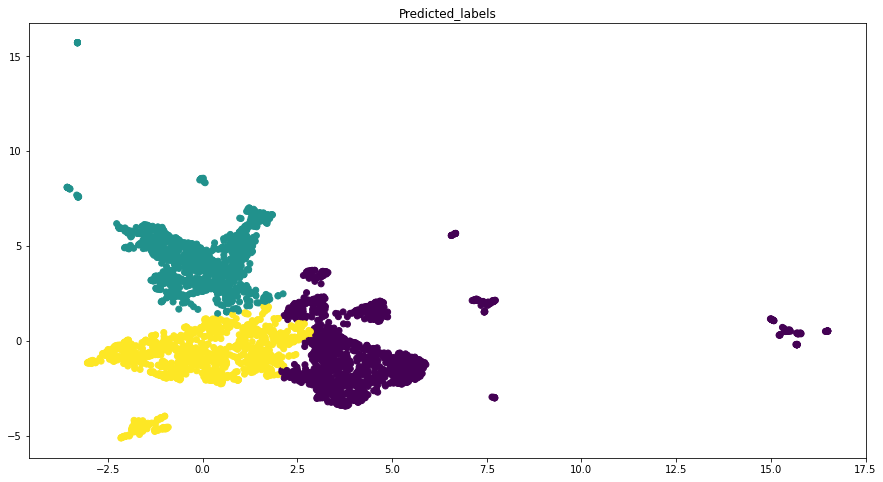

In [ ]:
pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit(X_glove_umap).labels_
eval_clustering_2D_nolabels(X_glove_umap, pred_labels)
printSilhouetteScores(X_glove, pred_labels, X_glove_umap)

### TSNE

#### TSNE + KMeans

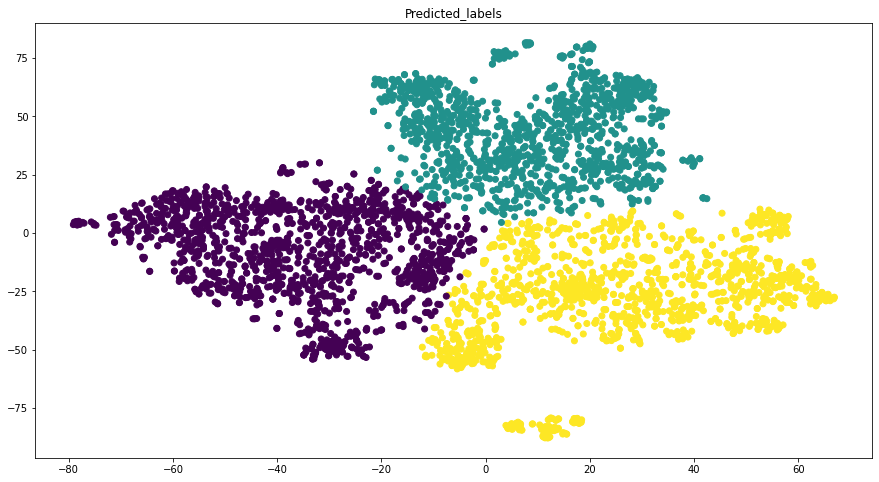

In [ ]:
pred_labels = KMeans(k,random_state=42).fit(X_glove_tsne).labels_
eval_clustering_2D_nolabels(X_glove_tsne, pred_labels)

In [ ]:
printSilhouetteScores(X_glove, pred_labels, X_glove_tsne)

Silhouette score dans l'espace d'origine (distance cosine) :
0.17993598
Silhouette score dans l'espace réduit(distance euclidienne) :
0.47220764


#### TSNE + Spectral Clustering

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


Silhouette score dans l'espace d'origine (distance cosine) :
0.19944896
Silhouette score dans l'espace réduit(distance euclidienne) :
0.2963509


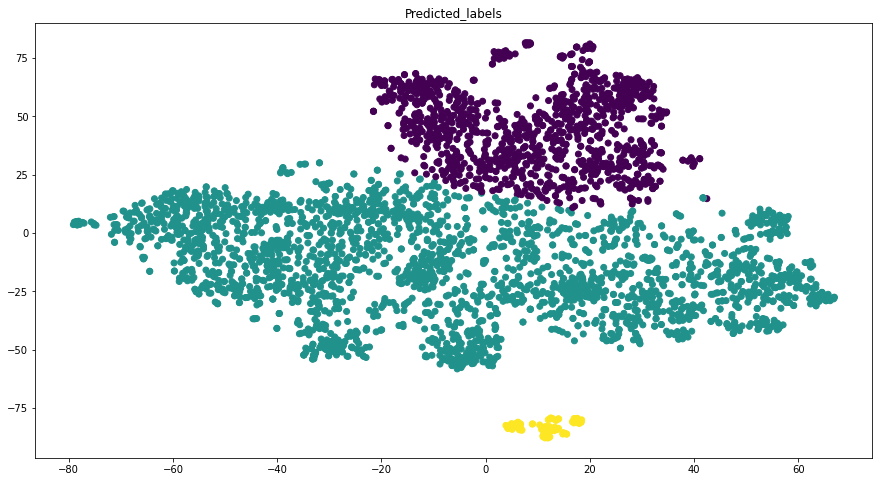

In [ ]:
pred_labels=SpectralClustering(k,affinity='nearest_neighbors',n_neighbors=25,random_state=42).fit(X_glove_tsne).labels_
eval_clustering_2D_nolabels(X_glove_tsne, pred_labels)
printSilhouetteScores(X_glove, pred_labels, X_glove_tsne)

#### TSNE + HDBSCAN

Silhouette score dans l'espace d'origine (distance cosine) :
0.13597159
Silhouette score dans l'espace réduit(distance euclidienne) :
0.34671175


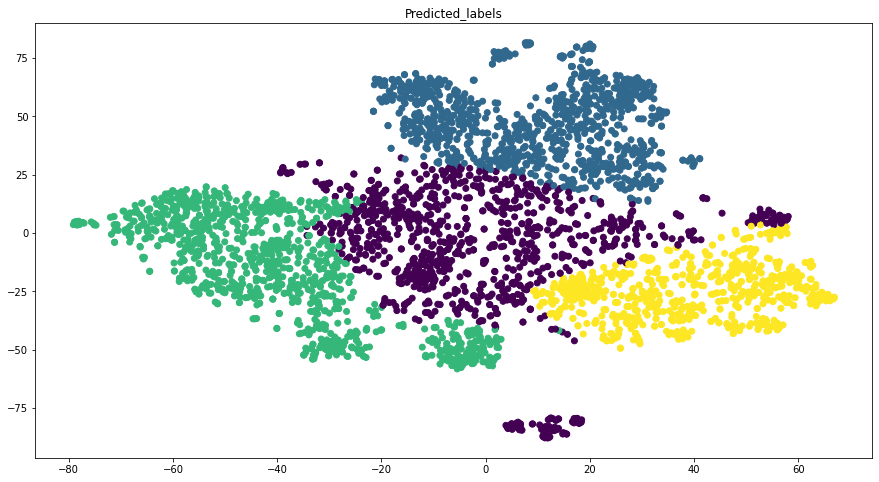

In [ ]:
X_glove_sc = StandardScaler().fit_transform(X_glove_tsne)
hdbscan_model = hdbscan.HDBSCAN(algorithm= 'best', alpha=1.0, leaf_size=40,min_cluster_size=100, cluster_selection_method='eom', metric='braycurtis').fit(X_glove_sc)
pred_labels= hdbscan_model.labels_
eval_clustering_2D_nolabels(X_glove_tsne, pred_labels)
printSilhouetteScores(X_glove, pred_labels, X_glove_tsne)

#### TSNE + CAH

Silhouette score dans l'espace d'origine (distance cosine) :
0.17879236
Silhouette score dans l'espace réduit(distance euclidienne) :
0.41615936


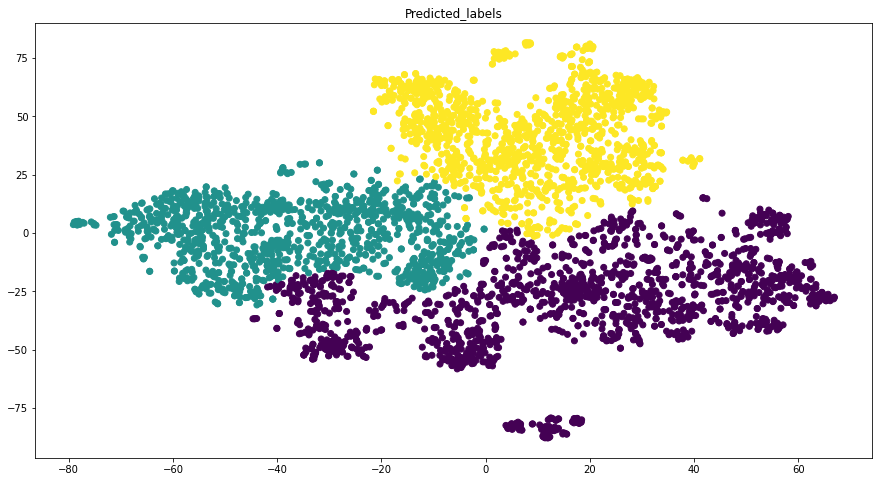

In [ ]:
pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit(X_glove_tsne).labels_
eval_clustering_2D_nolabels(X_glove_tsne, pred_labels)
printSilhouetteScores(X_glove, pred_labels, X_glove_tsne)

### Autoencoders

In [ ]:
X_glove_autoenc = autoencoder(X_glove,2,seed=42)

100%|██████████| 50/50 [00:08<00:00,  5.63it/s]


#### Kmeans

Silhouette score dans l'espace d'origine (distance cosine) :
0.17453611
Silhouette score dans l'espace réduit(distance euclidienne) :
0.45673478


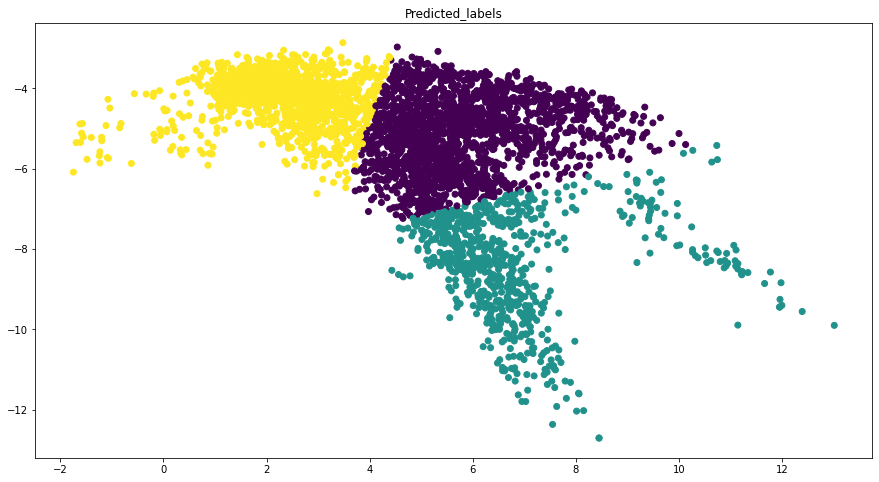

In [ ]:
pred_labels = KMeans(k,random_state=42).fit(X_glove_autoenc).labels_
eval_clustering_2D_nolabels(X_glove_autoenc, pred_labels)
printSilhouetteScores(X_glove, pred_labels, X_glove_autoenc)

De prime abord, les clusters n'ont pas l'air très bien séparés dans l'espace réduit de l'autoencoder mais KMeans obtient tout de même un score satisfaisant.

#### Clustering spectral 

Silhouette score dans l'espace d'origine (distance cosine) :
0.17668785
Silhouette score dans l'espace réduit(distance euclidienne) :
0.4360088


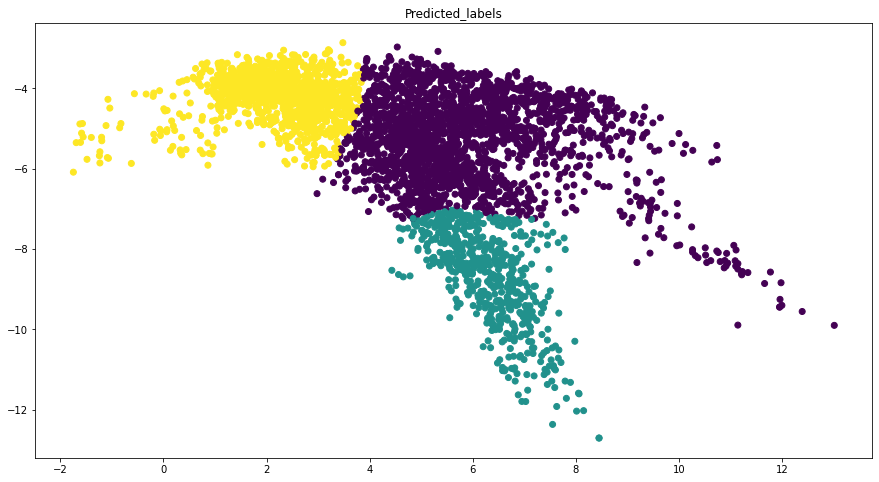

In [ ]:
pred_labels=SpectralClustering(k,affinity='nearest_neighbors',n_neighbors=30,random_state=42).fit(X_glove_autoenc).labels_
eval_clustering_2D_nolabels(X_glove_autoenc, pred_labels)
printSilhouetteScores(X_glove, pred_labels, X_glove_autoenc)

On obtient un clustering assez similaire à celui de KMeans

#### HDBSCAN

Silhouette score dans l'espace d'origine (distance cosine) :
0.123911984
Silhouette score dans l'espace réduit(distance euclidienne) :
0.30673048


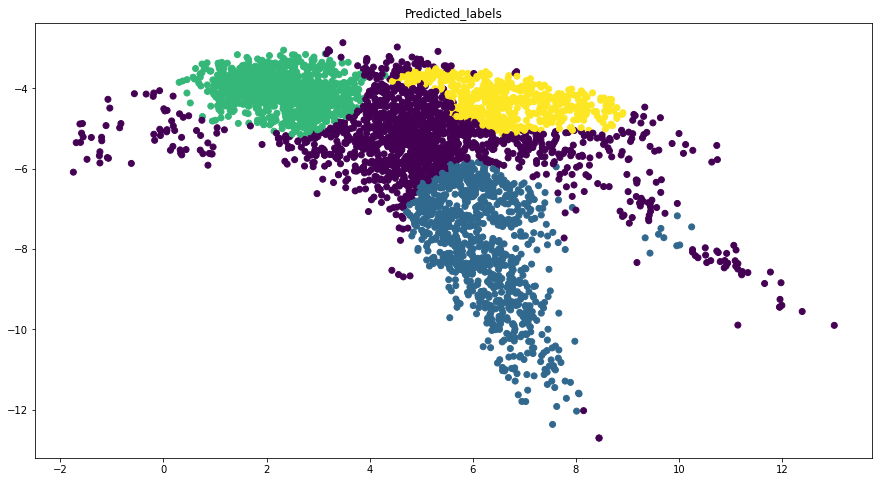

In [ ]:
X_glove_autoenc_sc = StandardScaler().fit_transform(X_glove_autoenc)
hdbscan_model = hdbscan.HDBSCAN(algorithm= 'best', alpha=1.0, leaf_size=40,min_cluster_size=50, cluster_selection_method='eom', metric='braycurtis').fit(X_glove_autoenc_sc)
pred_labels= hdbscan_model.labels_
eval_clustering_2D_nolabels(X_glove_autoenc, pred_labels)
printSilhouetteScores(X_glove, pred_labels, X_glove_autoenc)

HDBSCAN trouve 4 clusters là où on en voulait que 3.

#### CAH

Silhouette score dans l'espace d'origine (distance cosine) :
0.18603712
Silhouette score dans l'espace réduit(distance euclidienne) :
0.42188197


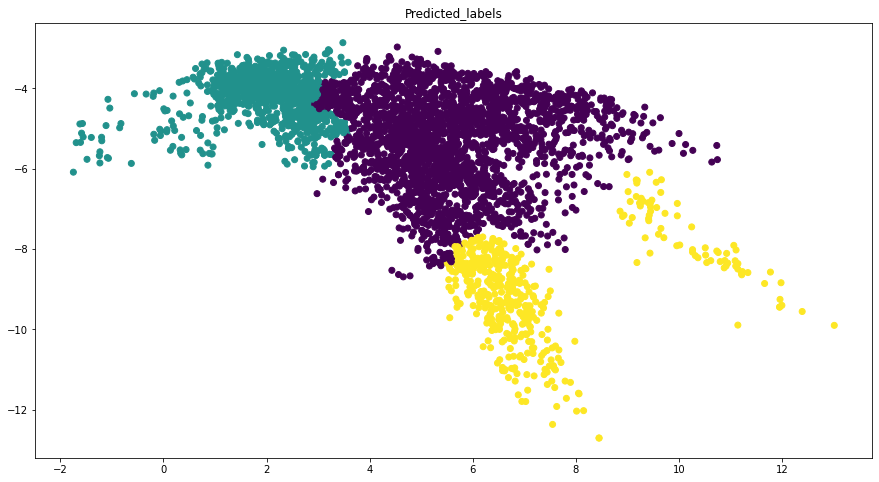

In [ ]:
from sklearn.cluster import AgglomerativeClustering

CAH = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit(X_glove_autoenc)
pred_labels= CAH.labels_
eval_clustering_2D_nolabels(X_glove_autoenc, pred_labels)
printSilhouetteScores(X_glove, pred_labels, X_glove_autoenc)

### Interprétation des clusters (approche Tandem)

Nous allons choisir comme clusters ceux données par TSNE + KMeans, puisque c'est la méthode qui donnait les meilleurs scores

In [ ]:
pred_labels = KMeans(k,random_state=42).fit(X_glove_tsne).labels_

In [ ]:
# Nettoyage du texte avant le nuage de mots
texts_cleaned = texts.map(lambda t: clean_text(t))


In [ ]:
dic = {'text': texts_cleaned, 'cluster': pred_labels}
df_texts = pd.DataFrame(data=dic)

In [ ]:
df_texts

,text,cluster
0,Eli Manning remains New York Giants quarterbac...,1
1,extra hour exercise week could significantly c...,2
2,AP Boston Red Sox send hobbled star Curt Schil...,1
3,BASEBALL Arizona NL Named Bob Gebhard assistan...,1
4,CFHT Twentyfive year ago September CanadaFranc...,0
...,...,...
3980,GEORGE TOWN Cayman Islands strengthened Hurric...,2
3981,Findcom business search engine wwwfindcom toda...,0
3982,followed Arkansas football last four year know...,1
3983,Loren Woods point careerhigh rebound Vince Car...,1


#### **Nuage de mots**

In [ ]:
from wordcloud import WordCloud

# cluster 0
wholeText0 = " ".join(t for t in df_texts.loc[df_texts['cluster'] == 0, 'text'])
wordcloud0 = WordCloud(width=1000, height=600, background_color="white").generate(wholeText0)

# cluster 1
wholeText1 = " ".join(t for t in df_texts.loc[df_texts['cluster'] == 1, 'text'])
wordcloud1 = WordCloud(width=1000, height=600, background_color="white").generate(wholeText1)

# cluster 2
wholeText2 = " ".join(t for t in df_texts.loc[df_texts['cluster'] == 2, 'text'])
wordcloud2 = WordCloud(width=1000, height=600, background_color="white").generate(wholeText2)

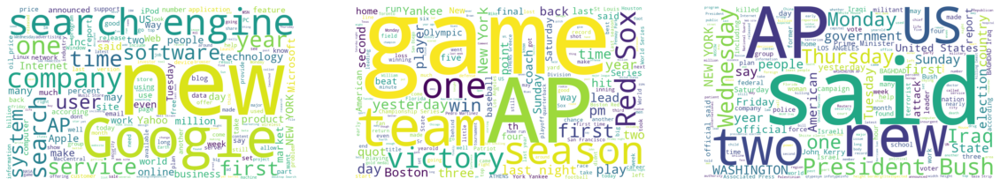

In [ ]:
import matplotlib.pyplot as plt

# Display the generated image:
plt.figure( figsize=(20,20))
plt.subplot(1,3,1)
plt.imshow(wordcloud0, interpolation='bilinear')
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(wordcloud1, interpolation='bilinear')
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(wordcloud2, interpolation='bilinear')
plt.axis("off")
plt.show()

Le premier cluster parle d'informatique et d'entreprises d'informatique.

Le deuxième parle d'équipes de baseball aux USA.

Le troisième parle de politique américaine.

On a donc bien 3 sujets distincts dans nos clusters, ce qui montre que notre clustering a du sens.

## Approches combinées 

### Reduced k-means 

R[write to console]: Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2



  |======================================================================| 100%Silhouette score dans l'espace d'origine (distance cosine) :
0.19911595
Silhouette score dans l'espace réduit(distance euclidienne) :
0.5235618462848409


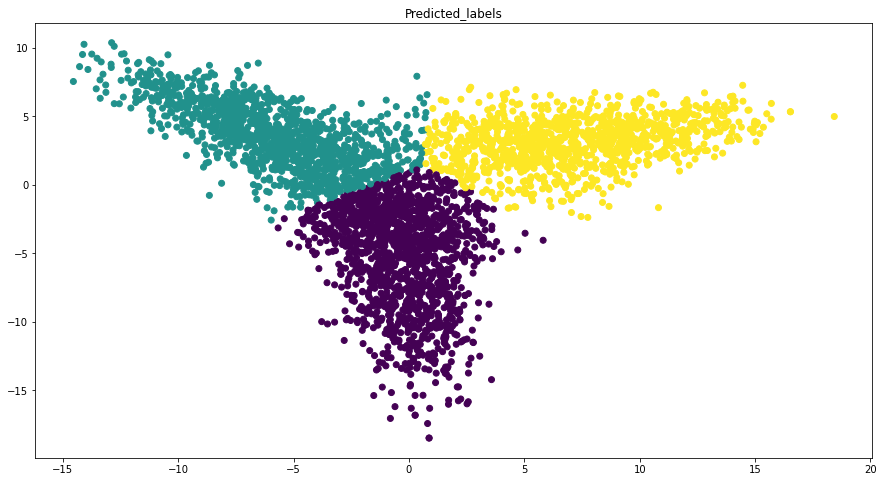

In [ ]:
rkm = fcps.TandemClustering(X_glove,k,Type='Reduced', PlotIt=False,ndim=2,nstart=10)
pred_labels = rkm[0]
X_glove_reduced = rkm[1][0]
eval_clustering_2D_nolabels(X_glove_reduced, pred_labels)
printSilhouetteScores(X_glove, pred_labels, X_glove_reduced)

Reduced KM fourni des meilleurs résultats que ceux obtenus avec l'approche tandem (TSNE+Kmeans)

### Factorial k-means 

  |======================================================================| 100%Silhouette score dans l'espace d'origine (distance cosine) :
0.079055734
Silhouette score dans l'espace réduit(distance euclidienne) :
-0.021990800103849326


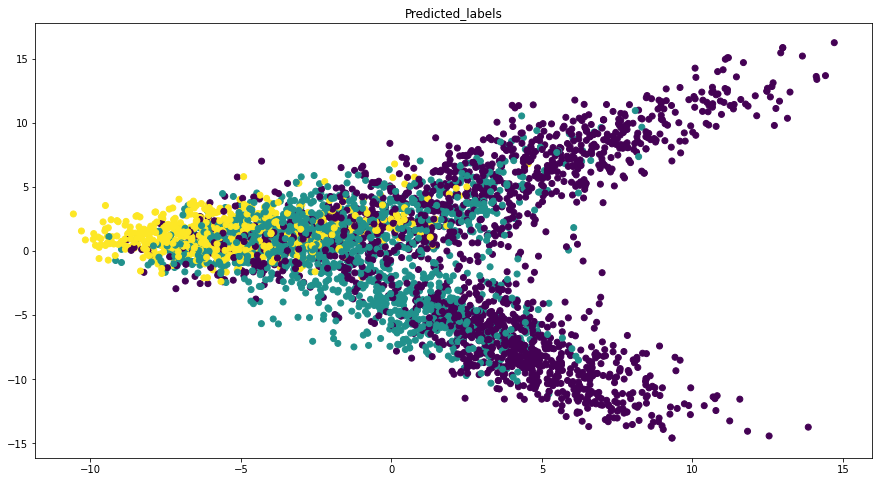

In [ ]:
rkm = fcps.TandemClustering(X_glove,k,Type='Factorial', PlotIt=False,ndim=2,nstart=10)
pred_labels = rkm[0]
X_glove_reduced = rkm[1][0]
eval_clustering_2D_nolabels(X_glove_reduced, pred_labels)
printSilhouetteScores(X_glove, pred_labels, X_glove_reduced)

Factorial KM n'a pas bien fonctionné sur nos données, en visualisant l'espace réduit obtenu, on voit bien que ce dernier est de très mauvaise qualité

### Deep Clustering Network

### Code de DCN et DKM

In [ ]:
import os
import math
import numpy as np
import tensorflow.compat.v1 as tf
from sklearn.cluster import KMeans
from tqdm import tqdm

"""
  Credits:
    This code is based on the implementation provided by Maziar Moradi Fard and Thibaut Thonet
    Available in: https://github.com/MaziarMF/deep-k-means
"""

TF_FLOAT_TYPE = tf.float32

tf.disable_eager_execution()

def fc_layers(input, specs):
    [dimensions, activations, names] = specs
    for dimension, activation, name in zip(dimensions, activations, names):
        input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)
    return input

def autoencoder(input, specs):
    [dimensions, activations, names] = specs
    mid_ind = int(len(dimensions)/2)

    # Encoder
    embedding = fc_layers(input, [dimensions[:mid_ind], activations[:mid_ind], names[:mid_ind]])
    # Decoder
    output = fc_layers(embedding, [dimensions[mid_ind:], activations[mid_ind:], names[mid_ind:]])

    return embedding, output

def f_func(x, y):
    return tf.reduce_sum(tf.square(x - y), axis=1)

def g_func(x, y):
    return tf.reduce_sum(tf.square(x - y), axis=1)

def next_batch(num, data):
    """
    Return a total of `num` random samples.
    """
    indices = np.arange(0, data.shape[0])
    np.random.shuffle(indices)
    indices = indices[:num]
    batch_data = np.asarray([data[i, :] for i in indices])

    return indices, batch_data


#######################################################
############### Deep Clustering Network ###############
#######################################################

class DcnCompGraph(object):
    """Computation graph for the Deep Clustering Network model proposed in:
        Yang, B., Fu, X., Sidiropoulos, N. D., & Hong, M. (2017). Towards K-means-friendly Spaces: Simultaneous Deep
        Learning and Clustering. In ICML '17 (pp. 3861–3870).
    This implementation is inspired by https://github.com/boyangumn/DCN
    """

    def __init__(self, ae_specs, n_clusters, batch_size, n_samples, val_lambda):
        input_size = ae_specs[0][-1]
        embedding_size = ae_specs[0][int((len(ae_specs[0]) - 1) / 2)]

        # Placeholder tensor for input data
        self.input = tf.placeholder(dtype=TF_FLOAT_TYPE, shape=(batch_size, input_size))

        # Auto-encoder loss computations
        self.embedding, self.output = autoencoder(self.input, ae_specs)  # Get the auto-encoder's embedding and output
        rec_error = g_func(self.input, self.output)  # Reconstruction error based on distance g
        self.ae_loss = tf.reduce_mean(rec_error)

        # Clustering loss computations
        ## Tensor for cluster representatives
        minval_rep, maxval_rep = -1, 1
        self.cluster_rep = tf.Variable(tf.random_uniform([n_clusters, embedding_size],
                                                    minval=minval_rep, maxval=maxval_rep,
                                                    dtype=TF_FLOAT_TYPE), name='cluster_rep', dtype=TF_FLOAT_TYPE)

        ## Clustering assignments for all samples in the dataset
        initial_clustering_assign = tf.random_uniform(minval=0, maxval=n_clusters, dtype=tf.int32, shape=[n_samples])
        self.cluster_assign = tf.Variable(initial_clustering_assign, name='cluster_assign', dtype=tf.int32, trainable=False)

        ## Get the cluster representative corresponding to the cluster of each batch sample
        self.indices = tf.placeholder(dtype=tf.int32, shape=batch_size)  # Placeholder for sample indices in current batch
        batch_clust_rep = []
        for j in range(batch_size):
            k = self.cluster_assign[self.indices[j]]  # Clustering assignment for sample j in batch
            batch_clust_rep.append(self.cluster_rep[k, :])
        stack_batch_clust_rep = tf.stack(batch_clust_rep)

        ## Compute the k-means term
        clustering_error = f_func(self.embedding, stack_batch_clust_rep)

        # Compute the full loss combining the reconstruction error and k-means term
        self.ae_loss = tf.reduce_mean(rec_error)
        self.kmeans_loss = tf.reduce_mean(clustering_error)
        self.loss = self.ae_loss + val_lambda * self.kmeans_loss

        # The optimizer is defined to minimize this loss
        optimizer = tf.train.AdamOptimizer()
        self.pretrain_op = optimizer.minimize(self.ae_loss) # Pretrain the autoencoder before starting DCN
        self.train_op = optimizer.minimize(self.loss)

        # As it has been pointed out in the DCN paper, first the weights of the autoencoder shall be trained then the
        # assignments and cluster representatives. So far in the computation graph we have optimized the weights of the
        # autoencoder, now it's the time for the assignments and representatives.

        # Update the clustering assignments
        for j in range(batch_size):
            # Find which cluster representative is the closest to the current batch sample
            new_assign = tf.argmin(f_func(tf.reshape(self.embedding[j, :], (1, embedding_size)), self.cluster_rep),
                                   output_type=tf.int32)
            # Update the clustering assignment
            self.cluster_assign_update = tf.assign(self.cluster_assign[self.indices[j]], new_assign)

        # Update the cluster representatives
        ## Initialize the value of count
        initial_count = tf.constant(100.0, shape=[n_clusters])
        count = tf.Variable(initial_count, name='count', dtype=TF_FLOAT_TYPE, trainable=False)
        ## Update the cluster representatives according to Equation (8) in the DCN paper
        for j in range(batch_size):
            k = self.cluster_assign[self.indices[j]]  # Clustering assignment for sample j in batch
            self.count_update = tf.assign(count[k], count[k] + 1)  # Updated count for cluster assignments
            new_rep = self.cluster_rep[k] - (1 / count[k]) * (self.cluster_rep[k] - self.embedding[j])
            self.cluster_rep_update = tf.assign(self.cluster_rep[k], new_rep)

def DCN(data, n_clusters, n_components, n_pretrain_epochs=50, n_finetuning_epochs=50, lambda_=1.0, batch_size=256, seed=None, cpu=False):
    # Auto-encoder architecture
    input_size = data.shape[1]
    hidden_1_size = 500
    hidden_2_size = 500
    hidden_3_size = 2000
    embedding_size = n_components
    dimensions = [hidden_1_size, hidden_2_size, hidden_3_size, embedding_size, # Encoder layer dimensions
                  hidden_3_size, hidden_2_size, hidden_1_size, input_size] # Decoder layer dimensions
    activations = [tf.nn.relu, tf.nn.relu, tf.nn.relu, None, # Encoder layer activations
                  tf.nn.relu, tf.nn.relu, tf.nn.relu, None] # Decoder layer activations
    names = ['enc_hidden_1', 'enc_hidden_2', 'enc_hidden_3', 'embedding', # Encoder layer names
            'dec_hidden_1', 'dec_hidden_2', 'dec_hidden_3', 'output'] # Decoder layer names

    n_samples = data.shape[0]
    n_batches = int(math.ceil(n_samples / batch_size)) # Number of mini-batches
    pretrain = True # Specify if DKM's autoencoder should be pretrained

    # Hardware specifications
    if cpu:
        os.environ['CUDA_VISIBLE_DEVICES'] = '-1' # Run on CPU instead of GPU if batch_size is small
    gpu_options = tf.GPUOptions(per_process_gpu_memory_fraction=0.05)

    if seed is not None:
      tf.reset_default_graph()
      tf.set_random_seed(seed)
      np.random.seed(seed)

    cg = DcnCompGraph([dimensions, activations, names], n_clusters, batch_size, n_samples,
                      lambda_)

    # Run the computation graph
    with tf.Session(config=tf.ConfigProto(gpu_options=gpu_options)) as sess:
        # Initialization
        init = tf.global_variables_initializer()
        sess.run(init)

        # Pretrain if specified
        if pretrain:
            print("Starting autoencoder pretraining...")

            # Variables to save pretraining tensor content
            embeddings = np.zeros((n_samples, embedding_size), dtype=float)

            # First, pretrain the autoencoder
            ## Loop over epochs
            for _ in tqdm(range(n_pretrain_epochs)):

                # Loop over the samples
                for _ in range(n_batches):
                    # Fetch a random data batch of the specified size
                    indices_, data_batch = next_batch(batch_size, data)

                    # Run the computation graph until pretrain_op (only on autoencoder) on the data batch
                    _, embedding_, ae_loss_ = sess.run((cg.pretrain_op, cg.embedding, cg.ae_loss),
                                                       feed_dict={cg.input: data_batch})

                    # Save the embeddings for batch samples
                    for j in range(len(indices_)):
                        embeddings[indices_[j], :] = embedding_[j, :]

            # Second, run k-means++ on the pretrained embeddings
            print("Running k-means on the learned embeddings...")
            kmeans_model = KMeans(n_clusters=n_clusters, init="k-means++").fit(embeddings)

            # The cluster centers are used to initialize the cluster representatives in DCN
            sess.run(tf.assign(cg.cluster_rep, kmeans_model.cluster_centers_))

            # The clustering assignments are used to initialize the clustering assignments in DCN
            sess.run(tf.assign(cg.cluster_assign, kmeans_model.labels_))

        # Train the full DCN model
        print("Starting DCN training...")
        ## Loop over epochs
        for epoch in tqdm(range(n_finetuning_epochs)):
            # print("Training step: epoch {}".format(epoch))

            # Loop over the samples
            for _ in range(n_batches):
                # Fetch a random data batch of the specified size
                indices_, data_batch = next_batch(batch_size, data)

                # Run the computation graph on the data batch
                _, _, _, _, loss_, cluster_assign_, ae_loss_, kmeans_loss_ =\
                    sess.run((cg.train_op, cg.cluster_assign_update, cg.count_update, cg.cluster_rep_update, cg.loss,
                              cg.cluster_assign, cg.ae_loss, cg.kmeans_loss),
                             feed_dict={cg.input: data_batch, cg.indices: indices_})
        
        embeddings = np.zeros((n_samples, embedding_size), dtype=float)
        for _ in range(n_batches):
            # Fetch a random data batch of the specified size
            indices_, data_batch = next_batch(batch_size, data)

            # Run the computation graph on the data batch
            _, _, embeddings_, _, _, loss_, cluster_assign_, ae_loss_, kmeans_loss_ =\
                sess.run((cg.train_op, cg.cluster_assign_update, cg.embedding, cg.count_update, cg.cluster_rep_update, cg.loss,
                          cg.cluster_assign, cg.ae_loss, cg.kmeans_loss),
                          feed_dict={cg.input: data_batch, cg.indices: indices_})

            for j in range(len(indices_)):
                embeddings[indices_[j], :] = embeddings_[j, :]
                
    return embeddings, cluster_assign_


#######################################################
##################### Deep K-means ####################
#######################################################

class DkmCompGraph(object):
    """Computation graph for Deep K-Means
    """

    def __init__(self, ae_specs, n_clusters, val_lambda):
        input_size = ae_specs[0][-1]
        embedding_size = ae_specs[0][int((len(ae_specs[0])-1)/2)]

        # Placeholder tensor for input data
        self.input = tf.placeholder(dtype=TF_FLOAT_TYPE, shape=(None, input_size))

        # Auto-encoder loss computations
        self.embedding, self.output = autoencoder(self.input, ae_specs)  # Get the auto-encoder's embedding and output
        rec_error = g_func(self.input, self.output)  # Reconstruction error based on distance g

        # k-Means loss computations
        ## Tensor for cluster representatives
        minval_rep, maxval_rep = -1, 1
        self.cluster_rep = tf.Variable(tf.random_uniform([n_clusters, embedding_size],
                                                    minval=minval_rep, maxval=maxval_rep,
                                                    dtype=TF_FLOAT_TYPE), name='cluster_rep', dtype=TF_FLOAT_TYPE)

        ## First, compute the distance f between the embedding and each cluster representative
        list_dist = []
        for i in range(0, n_clusters):
            dist = f_func(self.embedding, tf.reshape(self.cluster_rep[i, :], (1, embedding_size)))
            list_dist.append(dist)
        self.stack_dist = tf.stack(list_dist)

        ## Second, find the minimum squared distance for softmax normalization
        min_dist = tf.reduce_min(list_dist, axis=0)

        ## Third, compute exponentials shifted with min_dist to avoid underflow (0/0) issues in softmaxes
        self.alpha = tf.placeholder(dtype=TF_FLOAT_TYPE, shape=())  # Placeholder tensor for alpha
        list_exp = []
        for i in range(n_clusters):
            exp = tf.exp(-self.alpha * (self.stack_dist[i] - min_dist))
            list_exp.append(exp)
        stack_exp = tf.stack(list_exp)
        sum_exponentials = tf.reduce_sum(stack_exp, axis=0)

        ## Fourth, compute softmaxes and the embedding/representative distances weighted by softmax
        list_softmax = []
        list_weighted_dist = []
        for j in range(n_clusters):
            softmax = stack_exp[j] / sum_exponentials
            weighted_dist = self.stack_dist[j] * softmax
            list_softmax.append(softmax)
            list_weighted_dist.append(weighted_dist)
        stack_weighted_dist = tf.stack(list_weighted_dist)

        # Compute the full loss combining the reconstruction error and k-means term
        self.ae_loss = tf.reduce_mean(rec_error)
        self.kmeans_loss = tf.reduce_mean(tf.reduce_sum(stack_weighted_dist, axis=0))
        self.loss = self.ae_loss + val_lambda * self.kmeans_loss

        # The optimizer is defined to minimize this loss
        optimizer = tf.train.AdamOptimizer()
        self.pretrain_op = optimizer.minimize(self.ae_loss) # Pretrain the autoencoder before starting DKM
        self.train_op = optimizer.minimize(self.loss) # Train the whole DKM model

def DKM(data, n_clusters, n_components, n_pretrain_epochs=50, n_finetuning_epochs=5, lambda_=1.0, batch_size=256, seed=None, cpu=False):
    """
        The final number of finetuning epochs is n_finetuning_epochs * 20 if pretrain and n_finetuning_epochs * 40 if annealing
    """
    # Auto-encoder architecture
    input_size = data.shape[1]
    hidden_1_size = 500
    hidden_2_size = 500
    hidden_3_size = 2000
    embedding_size = n_components
    dimensions = [hidden_1_size, hidden_2_size, hidden_3_size, embedding_size, # Encoder layer dimensions
                  hidden_3_size, hidden_2_size, hidden_1_size, input_size] # Decoder layer dimensions
    activations = [tf.nn.relu, tf.nn.relu, tf.nn.relu, None, # Encoder layer activations
                  tf.nn.relu, tf.nn.relu, tf.nn.relu, None] # Decoder layer activations
    names = ['enc_hidden_1', 'enc_hidden_2', 'enc_hidden_3', 'embedding', # Encoder layer names
            'dec_hidden_1', 'dec_hidden_2', 'dec_hidden_3', 'output'] # Decoder layer names

    n_samples = data.shape[0]
    n_batches = int(math.ceil(n_samples / batch_size)) # Number of mini-batches
    pretrain = True # Specify if DKM's autoencoder should be pretrained
    annealing = False # Specify if annealing should be used

    # Define the alpha scheme depending on if the approach includes annealing/pretraining
    if annealing and not pretrain:
        constant_value = 1  # specs.embedding_size # Used to modify the range of the alpha scheme
        max_n = 40  # Number of alpha values to consider
        alphas = np.zeros(max_n, dtype=float)
        alphas[0] = 0.1
        for i in range(1, max_n):
            alphas[i] = (2 ** (1 / (np.log(i + 1)) ** 2)) * alphas[i - 1]
        alphas = alphas / constant_value
    elif not annealing and pretrain:
        constant_value = 1  # specs.embedding_size # Used to modify the range of the alpha scheme
        max_n = 20  # Number of alpha values to consider (constant values are used here)
        alphas = 1000*np.ones(max_n, dtype=float) # alpha is constant
        alphas = alphas / constant_value
    else:
        raise Exception("Run with either annealing (-a) or pretraining (-p), but not both.")

    # Hardware specifications
    if cpu:
        os.environ['CUDA_VISIBLE_DEVICES'] = '-1' # Run on CPU instead of GPU if batch_size is small

    gpu_options = tf.GPUOptions(per_process_gpu_memory_fraction=0.05)
    config = tf.ConfigProto(gpu_options=gpu_options)

    if seed is not None:
      tf.reset_default_graph()
      tf.set_random_seed(seed)
      np.random.seed(seed)
      
    # Define the computation graph for DKM
    cg = DkmCompGraph([dimensions, activations, names], n_clusters, lambda_)

    # Run the computation graph
    with tf.Session(config=config) as sess:
        # Initialization
        init = tf.global_variables_initializer()
        sess.run(init)

        # Variables to save tensor content
        distances = np.zeros((n_clusters, n_samples))

        # Pretrain if specified
        if pretrain:
            print("Starting autoencoder pretraining...")

            # Variables to save pretraining tensor content
            embeddings = np.zeros((n_samples, embedding_size), dtype=float)

            # First, pretrain the autoencoder
            ## Loop over epochs
            for _ in tqdm(range(n_pretrain_epochs)):
                # Loop over the samples
                for _ in range(n_batches):
                    # Fetch a random data batch of the specified size
                    indices, data_batch = next_batch(batch_size, data)

                    # Run the computation graph until pretrain_op (only on autoencoder) on the data batch
                    _, embedding_, ae_loss_ = sess.run((cg.pretrain_op, cg.embedding, cg.ae_loss),
                                                        feed_dict={cg.input: data_batch})

                    # Save the embeddings for batch samples
                    for j in range(len(indices)):
                        embeddings[indices[j], :] = embedding_[j, :]

            # Second, run k-means++ on the pretrained embeddings
            print("Running k-means on the learned embeddings...")
            kmeans_model = KMeans(n_clusters=n_clusters, init="k-means++").fit(embeddings)

            # The cluster centers are used to initialize the cluster representatives in DKM
            sess.run(tf.assign(cg.cluster_rep, kmeans_model.cluster_centers_))

        # Train the full DKM model
        if (len(alphas) > 0):
            print("Starting DKM training...")
        ## Loop over alpha (inverse temperature), from small to large values
        for k in tqdm(range(len(alphas))):
            # Loop over epochs per alpha
            for _ in range(n_finetuning_epochs):
                # Loop over the samples
                for _ in range(n_batches):
                    # Fetch a random data batch of the specified size
                    indices, data_batch = next_batch(batch_size, data)

                    # Run the computation graph on the data batch
                    _, loss_, stack_dist_, cluster_rep_, ae_loss_, kmeans_loss_ =\
                        sess.run((cg.train_op, cg.loss, cg.stack_dist, cg.cluster_rep, cg.ae_loss, cg.kmeans_loss),
                                  feed_dict={cg.input: data_batch, cg.alpha: alphas[k]})

                    # Save the distances for batch samples
                    for j in range(len(indices)):
                        distances[:, indices[j]] = stack_dist_[:, j]

        _, loss_, X_reduced, stack_dist_, cluster_rep_, ae_loss_, kmeans_loss_ =\
        sess.run((cg.train_op, cg.loss, cg.embedding, cg.stack_dist, cg.cluster_rep, cg.ae_loss, cg.kmeans_loss),
                  feed_dict={cg.input: data, cg.alpha: alphas[k]})

        distances = stack_dist_

        # Infer cluster assignments for all samples
        cluster_assign = np.zeros((n_samples), dtype=float)
        for i in range(n_samples):
            index_closest_cluster = np.argmin(distances[:, i])
            cluster_assign[i] = index_closest_cluster
        cluster_assign = cluster_assign.astype(np.int64)

    return X_reduced, cluster_assign

### DCN

In [ ]:
embeddings, cluster_assign_ = DCN(X_glove, n_clusters=k,n_components=2)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:21: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
/usr/local/lib/python3.7/dist-packages/keras/legacy_tf_layers/core.py:255: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  return layer.apply(inputs)


Starting autoencoder pretraining...


100%|██████████| 50/50 [01:20<00:00,  1.60s/it]


Running k-means on the learned embeddings...
Starting DCN training...


100%|██████████| 50/50 [01:27<00:00,  1.75s/it]


Silhouette score dans l'espace d'origine (distance cosine) :
0.16527984
Silhouette score dans l'espace réduit(distance euclidienne) :
0.1905385934303166


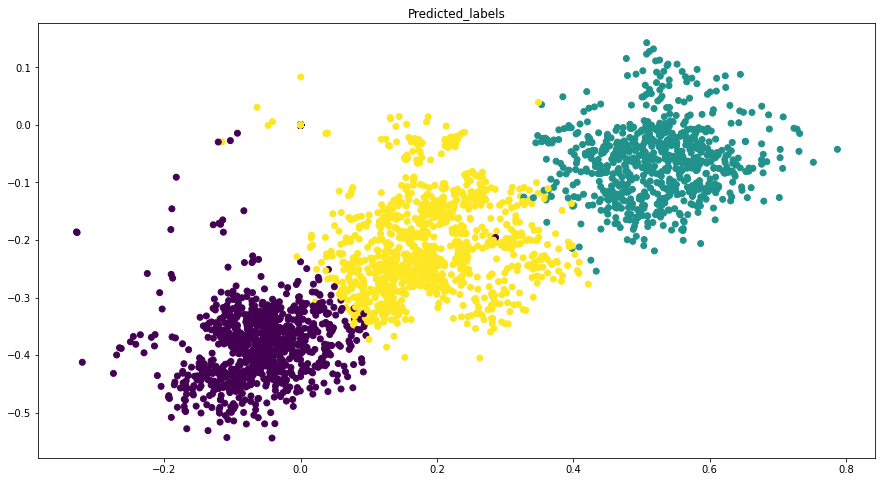

In [ ]:
eval_clustering_2D_nolabels(embeddings, cluster_assign_)
printSilhouetteScores(X_glove, cluster_assign_, embeddings)

L'espace réduit obtenu par DCN avait l'air intéressant mais le silhouette score n'est pas élevé au final.

### Deep k-means

In [ ]:
tf.reset_default_graph()

In [ ]:
X_reduced, cluster_assign = DKM(X_glove,n_clusters=k,n_components=2)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:21: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
/usr/local/lib/python3.7/dist-packages/keras/legacy_tf_layers/core.py:255: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  return layer.apply(inputs)


Starting autoencoder pretraining...


100%|██████████| 50/50 [01:19<00:00,  1.59s/it]


Running k-means on the learned embeddings...
Starting DKM training...


100%|██████████| 20/20 [02:39<00:00,  7.95s/it]


Silhouette score dans l'espace d'origine (distance cosine) :
0.16527984
Silhouette score dans l'espace réduit(distance euclidienne) :
0.35022166


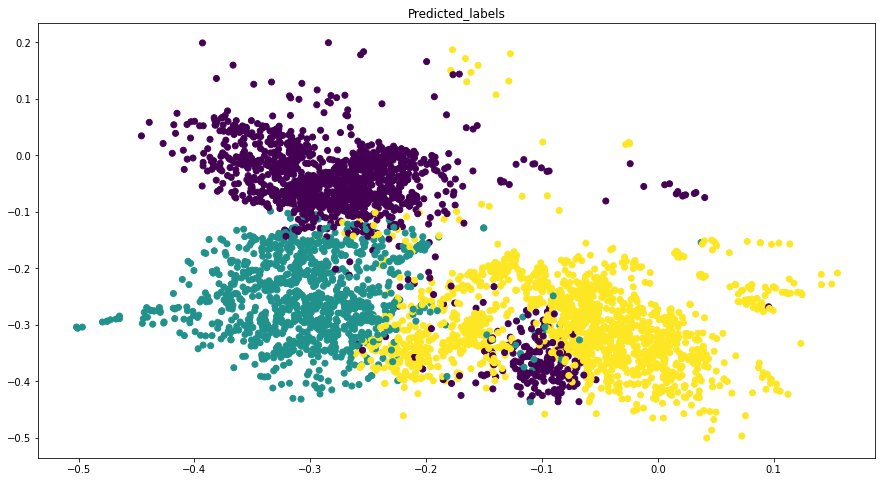

In [ ]:
eval_clustering_2D_nolabels(X_reduced, cluster_assign_)
printSilhouetteScores(X_glove, cluster_assign_, X_reduced)

## Interprétation des clusters

Nous allons choisir comme clusters ceux donnés par Reduced Kmeans, puisque c'est la méthode qui donnait les meilleurs scores

In [ ]:
rkm = fcps.TandemClustering(X_glove,k,Type='Reduced', PlotIt=False,ndim=2,nstart=10)
pred_labels = rkm[0]
X_glove_reduced = rkm[1][0]


  |======================================================================| 100%

In [ ]:
# Nettoyage du texte avant le nuage de mots
texts_cleaned = texts.map(lambda t: clean_text(t))


In [ ]:
dic = {'text': texts_cleaned, 'cluster': pred_labels}
df_texts = pd.DataFrame(data=dic)

In [ ]:
df_texts

,text,cluster
0,Eli Manning remains New York Giants quarterbac...,3
1,extra hour exercise week could significantly c...,2
2,AP Boston Red Sox send hobbled star Curt Schil...,3
3,BASEBALL Arizona NL Named Bob Gebhard assistan...,3
4,CFHT Twentyfive year ago September CanadaFranc...,1
...,...,...
3980,GEORGE TOWN Cayman Islands strengthened Hurric...,1
3981,Findcom business search engine wwwfindcom toda...,2
3982,followed Arkansas football last four year know...,3
3983,Loren Woods point careerhigh rebound Vince Car...,3


### **Nuage de mots**

In [ ]:
from wordcloud import WordCloud

# cluster 0
wholeText0 = " ".join(t for t in df_texts.loc[df_texts['cluster'] == 1, 'text'])
wordcloud0 = WordCloud(width=1000, height=600, background_color="white").generate(wholeText0)

# cluster 1
wholeText1 = " ".join(t for t in df_texts.loc[df_texts['cluster'] == 2, 'text'])
wordcloud1 = WordCloud(width=1000, height=600, background_color="white").generate(wholeText1)

# cluster 2
wholeText2 = " ".join(t for t in df_texts.loc[df_texts['cluster'] == 3, 'text'])
wordcloud2 = WordCloud(width=1000, height=600, background_color="white").generate(wholeText2)

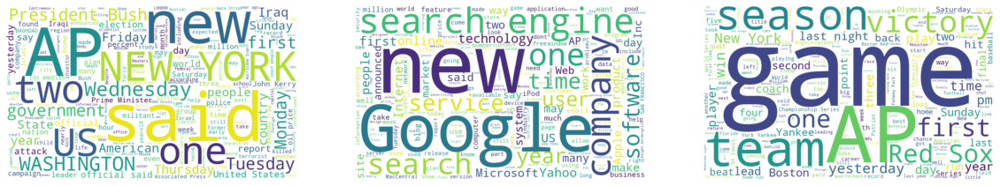

In [ ]:
import matplotlib.pyplot as plt

# Display the generated image:
plt.figure( figsize=(20,20))
plt.subplot(1,3,1)
plt.imshow(wordcloud0, interpolation='bilinear')
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(wordcloud1, interpolation='bilinear')
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(wordcloud2, interpolation='bilinear')
plt.axis("off")
plt.show()

On retrouve les mêmes clusters qu'avec l'approche Tandem

# Word2Vec 

In [ ]:
code_drive_w2v = "1k0ZS3Z7hctHdf3t6NeH1skuFJWUL0TZM"

In [ ]:
download_file_from_google_drive(code_drive_w2v,"word2vec.bin.gz")

1.53GB [00:13, 122MB/s]


In [ ]:
w2v_model = KeyedVectors.load_word2vec_format("word2vec.bin.gz",binary=True)

In [ ]:
get_w2v_vector = lambda x:w2v_model[x] if x in w2v_model.vocab else None

In [ ]:
X_w2v = static_document_embeddings(get_w2v_vector,texts,tokenize_re)
X_w2v.shape

(3985, 300)

## Détermination du nombre de clusters

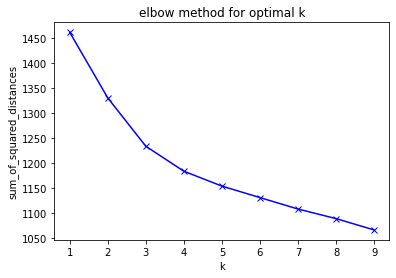

In [ ]:
findBestKWithKMeans(X_w2v)

*     La méthode Elbow avec KMeans sur l'espace d'origine nous donne un K optimal plutôt à 3. Pour confirmer cette hypothèse nous effectuons dans ce qui suit un clustering hiérarchique et nous afficherons le dendrogramme correspondant 

In [ ]:
# Dendogram for Hierarchical Clustering
import scipy.cluster.hierarchy as shc


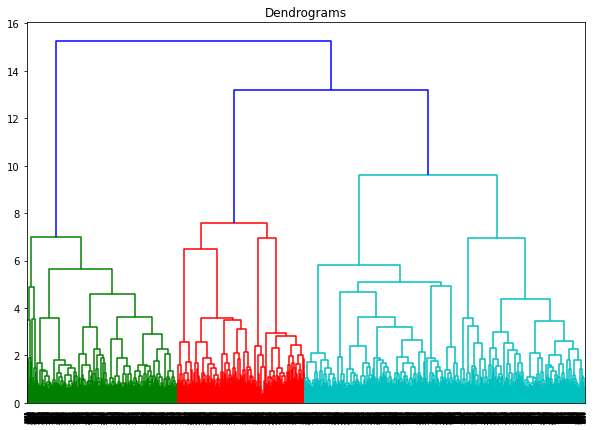

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 7))  
plt.title("Dendrograms")  
dend = shc.dendrogram(shc.linkage(X_w2v, method='ward'))

En affichant le dendrogramme, nous pouvons voir que la meilleure valeur de K semble être 3.

In [ ]:
!pip install hdbscan
import hdbscan

     |████████████████████████████████| 6.4 MB 4.5 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for hdbscan: filename=hdbscan-0.8.27-cp37-cp37m-linux_x86_64.whl size=2311920 sha256=3e14ebdde2afb43708b321e5bb23963dd62161524f6dabe98cc8b66953298197
  Stored in directory: /root/.cache/pip/wheels/73/5f/2f/9a259b84003b84847c259779206acecabb25ab56f1506ee72b
Successfully built hdbscan


In [ ]:
!pip install umap-learn

     |████████████████████████████████| 86 kB 3.2 MB/s 
     |████████████████████████████████| 1.1 MB 37.1 MB/s 
  Created wheel for umap-learn: filename=umap_learn-0.5.2-py3-none-any.whl size=82709 sha256=e784d880d6d5918c434a9bfdd32f0671e7f3bbd06be17374457a5b98743c501b
  Stored in directory: /root/.cache/pip/wheels/84/1b/c6/aaf68a748122632967cef4dffef68224eb16798b6793257d82
  Created wheel for pynndescent: filename=pynndescent-0.5.5-py3-none-any.whl size=52603 sha256=46b9e725ec721fe73a5c5b5dc641c24e078a0cd021de882f92422d000f937e9f
  Stored in directory: /root/.cache/pip/wheels/af/e9/33/04db1436df0757c42fda8ea6796d7a8586e23c85fac355f476
Successfully built umap-learn pynndescent


Nous avons vu sur les dataset supervisés que UMAP et TSNE étaient les plus efficaces pour obtenir un espace réduit intéressant à partir d'un embedding Word2Vec. En appliquant la méthode du coude sur ces espaces réduits, nous allons voir si le k optimal optenu ainsi est cohérent avec ce qu'on a sur l'espace d'origine.

In [ ]:
from umap import UMAP

X_w2v_umap = UMAP(n_components=2, random_state=42).fit_transform(X_w2v)

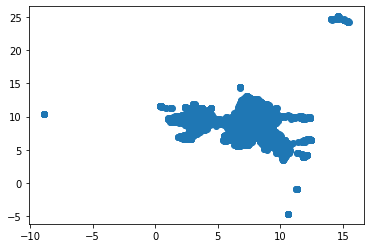

In [ ]:
plt.scatter(x = X_w2v_umap[:, 0], y = X_w2v_umap[:, 1])

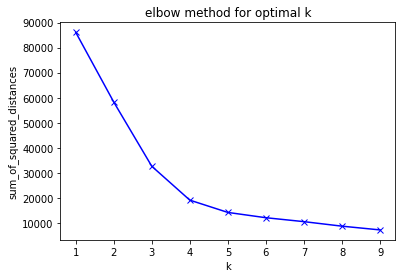

In [ ]:
findBestKWithKMeans(X_w2v_umap)

Avec UMAP, le coude est plutôt à K = 4.

In [ ]:
from sklearn.manifold import TSNE
X_w2v_tsne = TSNE(n_components=2, random_state=42).fit_transform(X_w2v)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


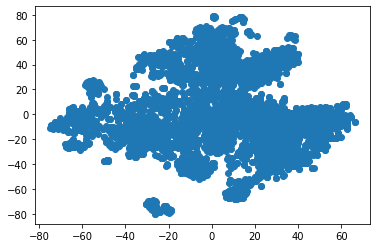

In [ ]:
plt.scatter(x = X_w2v_tsne[:, 0], y = X_w2v_tsne[:, 1])

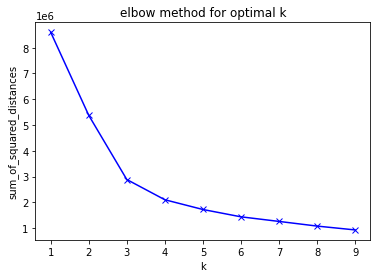

In [ ]:
findBestKWithKMeans(X_w2v_tsne)

Avec TSNE, le coude est bien visible à K = 3

Au vu de tous les résultats précédents, nous choisissons K = 3, la valeur qui fait à peu près consensus.

## Clustering

In [ ]:
k = 3

### Clustering dans l'espace d'origine

#### KMeans

In [ ]:
pred_labels = KMeans(k,random_state=42).fit(X_w2v).labels_
printSilhouetteScores(X_w2v, pred_labels)


Silhouette score dans l'espace d'origine (distance cosine) :
0.16636541


#### Spectral Clustering

In [ ]:
pred_labels=SpectralClustering(k,affinity='nearest_neighbors',n_neighbors=10,random_state=42).fit(X_w2v).labels_
printSilhouetteScores(X_w2v, pred_labels)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


Silhouette score dans l'espace d'origine (distance cosine) :
0.0014327817


#### HDBSCAN

In [ ]:
X_w2v_sc = StandardScaler().fit_transform(X_w2v)
hdbscan_model = hdbscan.HDBSCAN(algorithm= 'best', alpha=1.0, leaf_size=40,min_cluster_size=50, cluster_selection_method='eom', metric='braycurtis').fit(X_w2v_sc)
pred_labels= hdbscan_model.labels_
printSilhouetteScores(X_w2v, pred_labels)

Silhouette score dans l'espace d'origine (distance cosine) :
0.011880305


#### CAH

In [ ]:
from sklearn.cluster import AgglomerativeClustering

pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit(X_w2v).labels_
printSilhouetteScores(X_w2v, pred_labels)

Silhouette score dans l'espace d'origine (distance cosine) :
0.13835949


Les résultats de clustering sur l'espace d'origine en utilisant les différents modèles ne sont pas très bon; on a une faible silouette score 

### UMAP

#### UMAP + KMeans

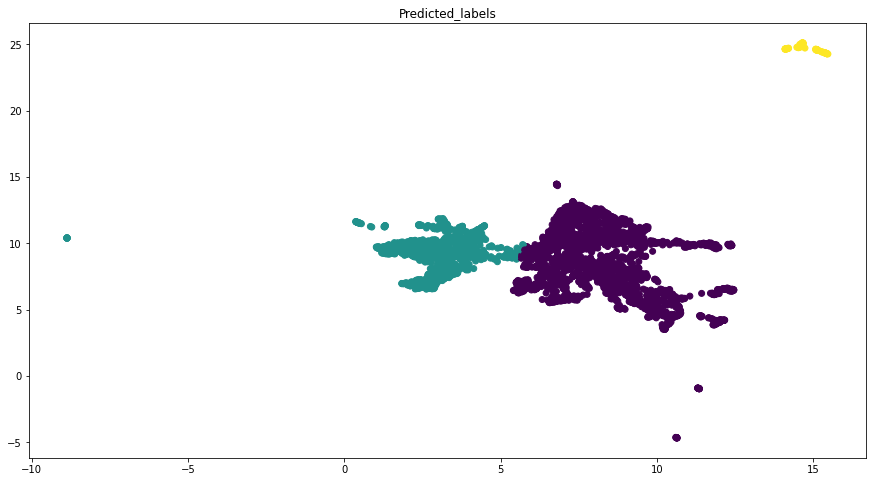

In [ ]:
pred_labels = KMeans(k,random_state=42).fit(X_w2v_umap).labels_
eval_clustering_2D_nolabels(X_w2v_umap, pred_labels)

In [ ]:
printSilhouetteScores(X_w2v, pred_labels, X_w2v_umap)

Silhouette score dans l'espace d'origine (distance cosine) :
0.10913607
Silhouette score dans l'espace réduit(distance euclidienne) :
0.45484346


#### UMAP + Spectral Clustering

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


Silhouette score dans l'espace d'origine (distance cosine) :
0.09343231
Silhouette score dans l'espace réduit(distance euclidienne) :
0.4232415


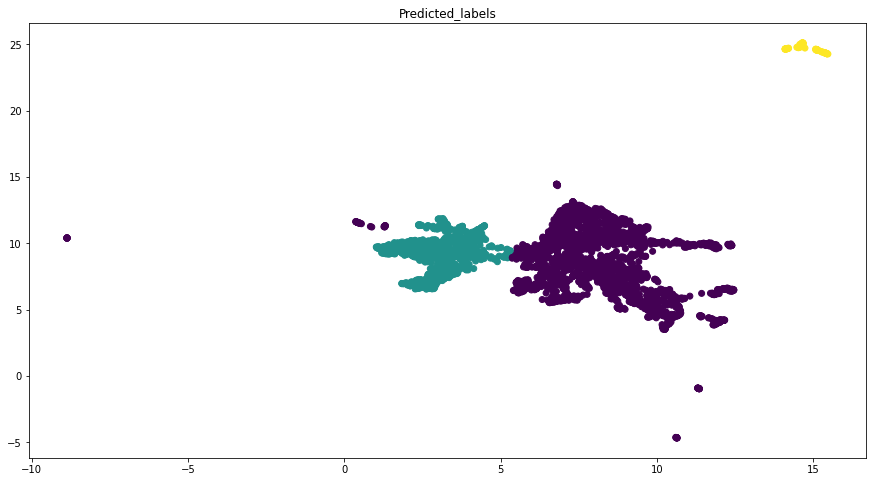

In [ ]:
pred_labels=SpectralClustering(k,affinity='nearest_neighbors',n_neighbors=25,random_state=42).fit(X_w2v_umap).labels_
eval_clustering_2D_nolabels(X_w2v_umap, pred_labels)
printSilhouetteScores(X_w2v, pred_labels, X_w2v_umap)

#### UMAP + HDBSCAN

Silhouette score dans l'espace d'origine (distance cosine) :
0.13007957
Silhouette score dans l'espace réduit(distance euclidienne) :
0.2823574


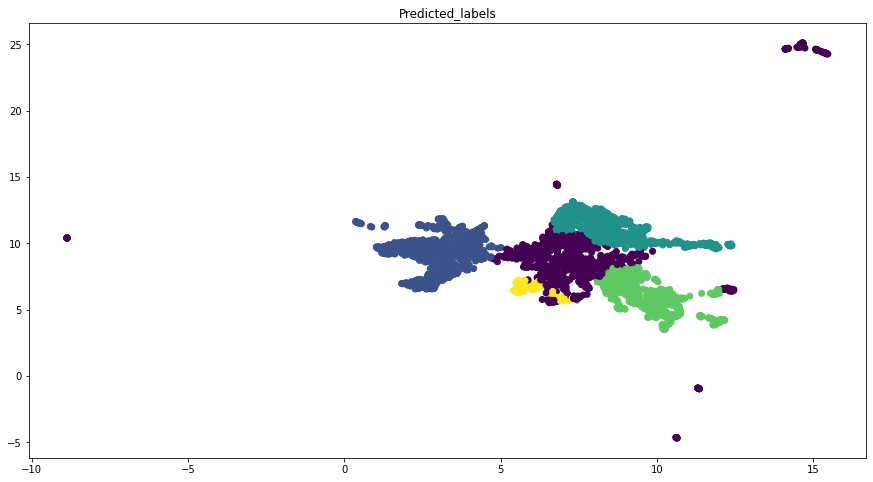

In [ ]:
X_w2v_sc = StandardScaler().fit_transform(X_w2v_umap)
hdbscan_model = hdbscan.HDBSCAN(algorithm= 'best', alpha=1.0, leaf_size=40,min_cluster_size=100, cluster_selection_method='eom', metric='braycurtis').fit(X_w2v_sc)
pred_labels= hdbscan_model.labels_
eval_clustering_2D_nolabels(X_w2v_umap, pred_labels)
printSilhouetteScores(X_w2v, pred_labels, X_w2v_umap)

#### UMAP + CAH

Silhouette score dans l'espace d'origine (distance cosine) :
0.10851723
Silhouette score dans l'espace réduit(distance euclidienne) :
0.45551258


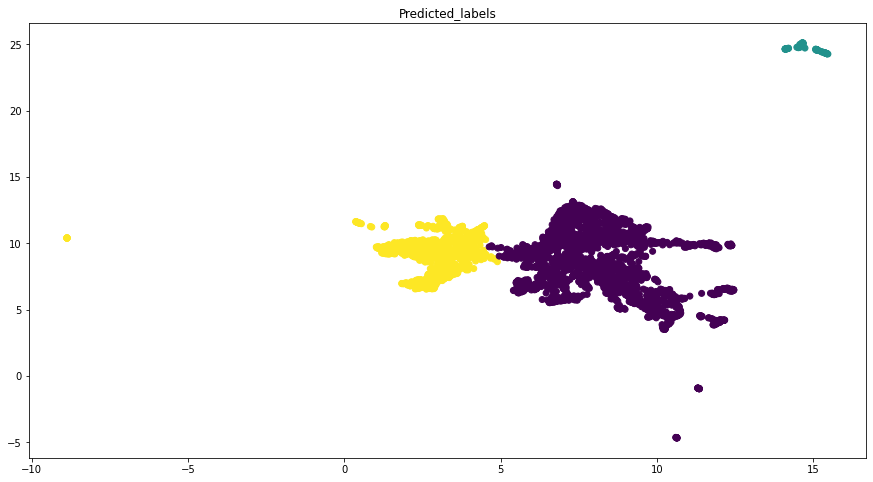

In [ ]:
pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit(X_w2v_umap).labels_
eval_clustering_2D_nolabels(X_w2v_umap, pred_labels)
printSilhouetteScores(X_w2v, pred_labels, X_w2v_umap)

### TSNE

#### TSNE + KMeans

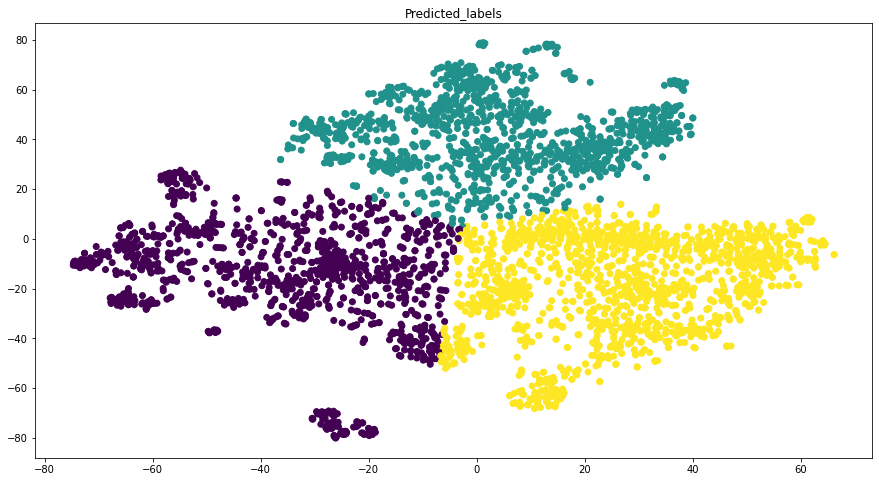

In [ ]:
pred_labels = KMeans(k,random_state=42).fit(X_w2v_tsne).labels_
eval_clustering_2D_nolabels(X_w2v_tsne, pred_labels)

In [ ]:
printSilhouetteScores(X_w2v, pred_labels, X_w2v_tsne)

Silhouette score dans l'espace d'origine (distance cosine) :
0.14752898
Silhouette score dans l'espace réduit(distance euclidienne) :
0.44917035


#### TSNE + Spectral Clustering

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


Silhouette score dans l'espace d'origine (distance cosine) :
0.11541967
Silhouette score dans l'espace réduit(distance euclidienne) :
0.2811871


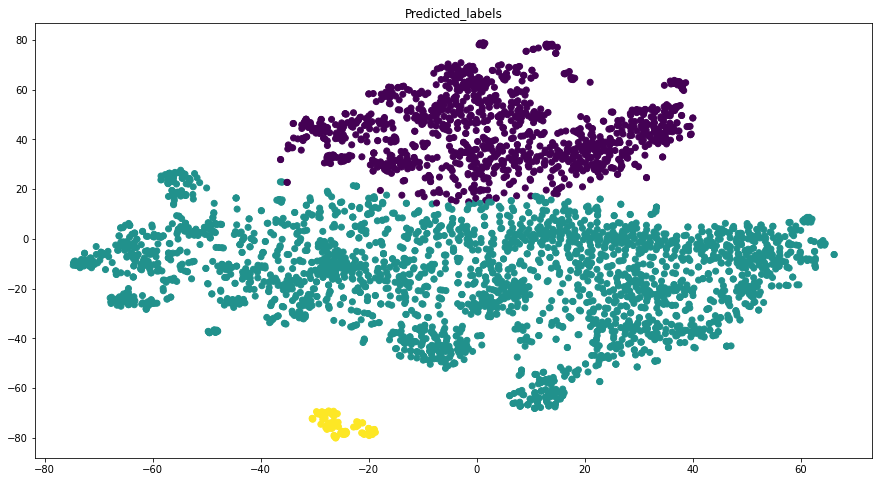

In [ ]:
pred_labels=SpectralClustering(k,affinity='nearest_neighbors',n_neighbors=25,random_state=42).fit(X_w2v_tsne).labels_
eval_clustering_2D_nolabels(X_w2v_tsne, pred_labels)
printSilhouetteScores(X_w2v, pred_labels, X_w2v_tsne)

#### TSNE + HDBSCAN

Silhouette score dans l'espace d'origine (distance cosine) :
0.11987124
Silhouette score dans l'espace réduit(distance euclidienne) :
0.26771542


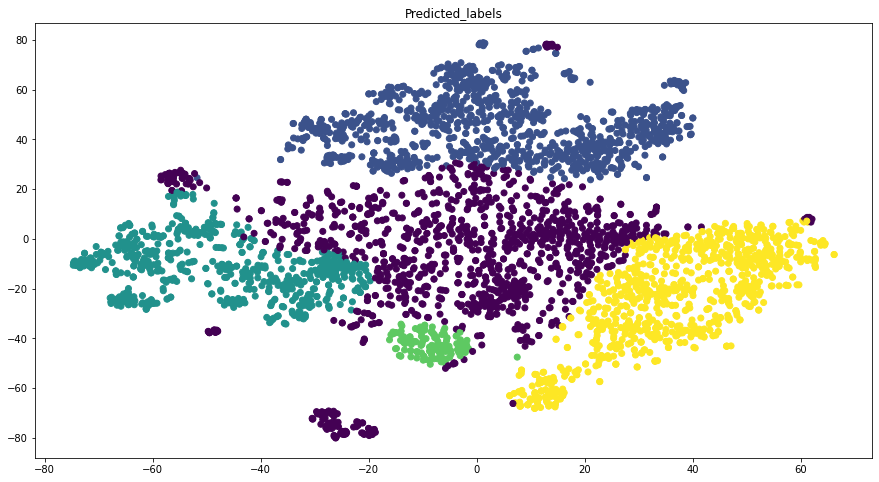

In [ ]:
X_w2v_sc = StandardScaler().fit_transform(X_w2v_tsne)
hdbscan_model = hdbscan.HDBSCAN(algorithm= 'best', alpha=1.0, leaf_size=40,min_cluster_size=100, cluster_selection_method='eom', metric='braycurtis').fit(X_w2v_sc)
pred_labels= hdbscan_model.labels_
eval_clustering_2D_nolabels(X_w2v_tsne, pred_labels)
printSilhouetteScores(X_w2v, pred_labels, X_w2v_tsne)

#### TSNE + CAH

Silhouette score dans l'espace d'origine (distance cosine) :
0.15334791
Silhouette score dans l'espace réduit(distance euclidienne) :
0.43480825


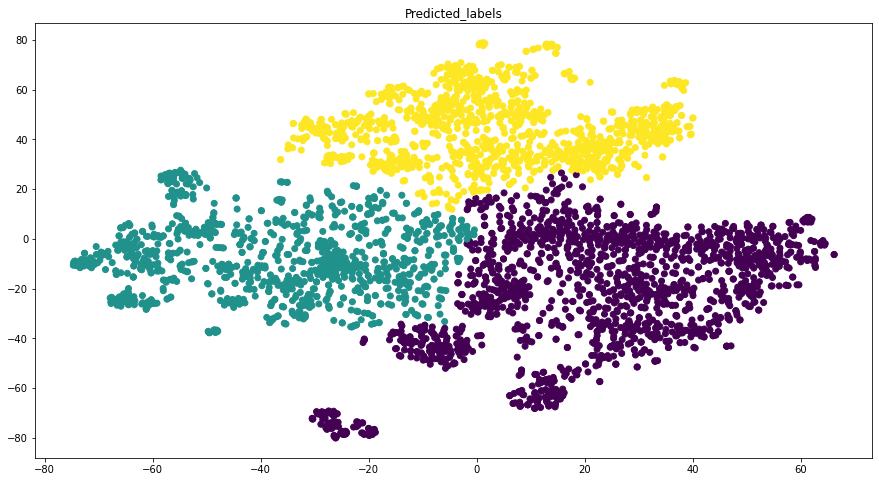

In [ ]:
pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit(X_w2v_tsne).labels_
eval_clustering_2D_nolabels(X_w2v_tsne, pred_labels)
printSilhouetteScores(X_w2v, pred_labels, X_w2v_tsne)

### Autoencoders

In [ ]:
encoded_X_w2v = autoencoder(X_w2v,2,seed=42)

100%|██████████| 50/50 [00:10<00:00,  4.94it/s]


#### Kmeans

Silhouette score dans l'espace d'origine (distance cosine) :
0.15392183
Silhouette score dans l'espace réduit(distance euclidienne) :
0.53280014


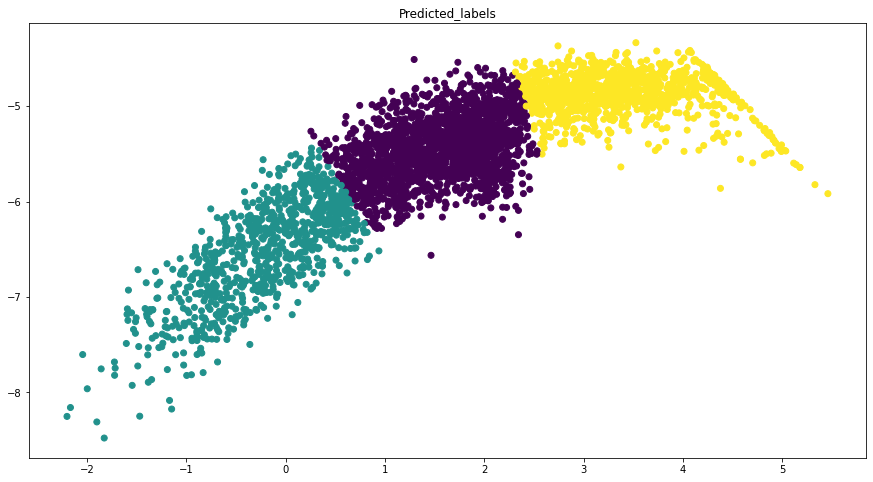

In [ ]:
pred_labels = KMeans(k,random_state=42).fit(encoded_X_w2v).labels_
eval_clustering_2D_nolabels(encoded_X_w2v, pred_labels)
printSilhouetteScores(X_w2v, pred_labels, encoded_X_w2v)

L'espace réduit obtenu avec l'autoencoder n'a pas l'air très bon lors de la visualisation 2D, mais le silouette score obtenu après le kmeans est meilleur que celui de UMAP ou TSNE

#### Clustering spectral 

Silhouette score dans l'espace d'origine (distance cosine) :
0.15021007
Silhouette score dans l'espace réduit(distance euclidienne) :
0.5275583


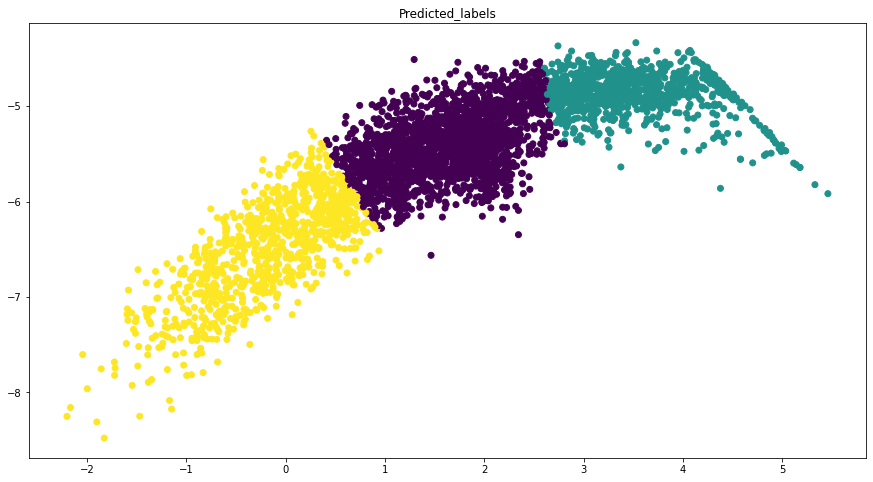

In [ ]:
pred_labels=SpectralClustering(k,affinity='nearest_neighbors',n_neighbors=30,random_state=42).fit(encoded_X_w2v).labels_
eval_clustering_2D_nolabels(encoded_X_w2v, pred_labels)
printSilhouetteScores(X_w2v, pred_labels, encoded_X_w2v)

#### HDBSCAN

Silhouette score dans l'espace d'origine (distance cosine) :
0.018964354
Silhouette score dans l'espace réduit(distance euclidienne) :
-0.001422212


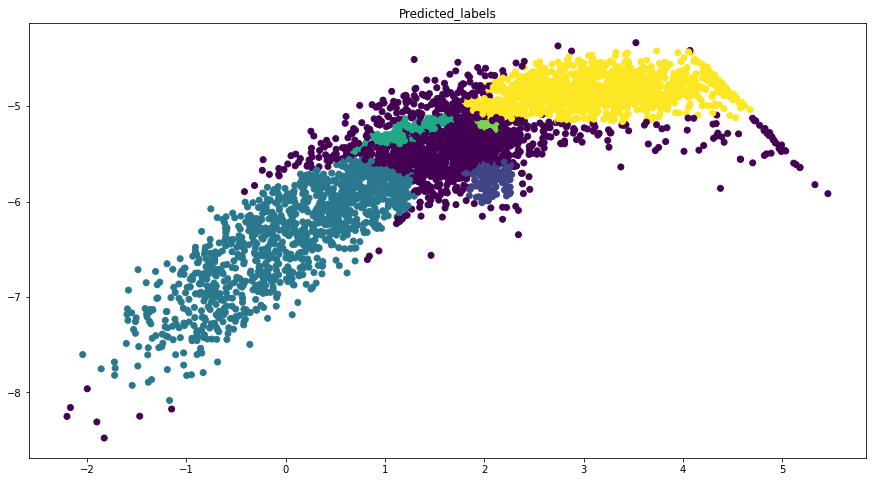

In [ ]:
encoded_X_w2v_sc = StandardScaler().fit_transform(encoded_X_w2v)
hdbscan_model = hdbscan.HDBSCAN(algorithm= 'best', alpha=1.0, leaf_size=40,min_cluster_size=25, cluster_selection_method='eom', metric='braycurtis').fit(encoded_X_w2v_sc)
pred_labels= hdbscan_model.labels_
eval_clustering_2D_nolabels(encoded_X_w2v, pred_labels)
printSilhouetteScores(X_w2v, pred_labels, encoded_X_w2v)

HDBSCAN est très mauvais sur l'espace réduit obtenu avec les autoencoder. Ceci est dû à la qualité de l'espace réduit fourni par l'autoencoder

#### CAH

Silhouette score dans l'espace d'origine (distance cosine) :
0.15148617
Silhouette score dans l'espace réduit(distance euclidienne) :
0.4981944


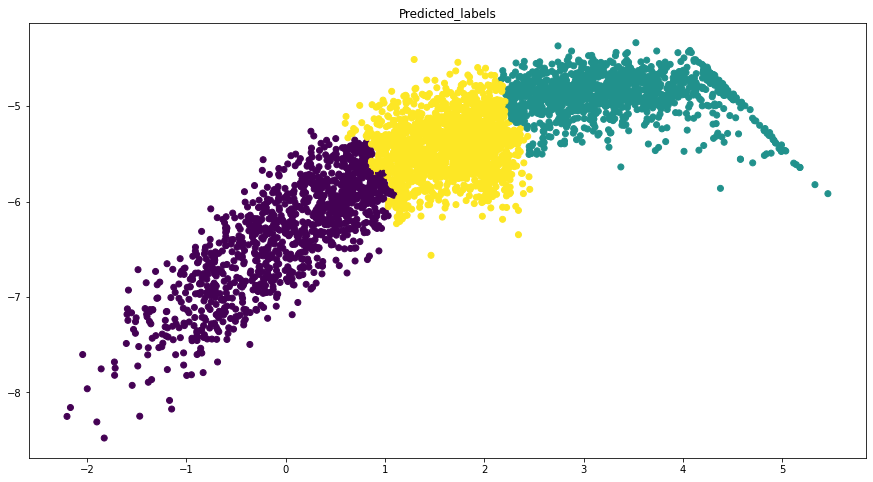

In [ ]:
CAH = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit(encoded_X_w2v)
pred_labels= CAH.labels_
eval_clustering_2D_nolabels(encoded_X_w2v, pred_labels)
printSilhouetteScores(X_w2v, pred_labels, encoded_X_w2v)

## Interprétation des clusters (Approches Tandem)

Nous allons choisir comme clusters ceux données par Autoencoder+ Kmeans, puisque c'est la méthode qui a donné le meilleur silouette score

In [ ]:
pred_labels = KMeans(k,random_state=42).fit(encoded_X_w2v).labels_


In [ ]:
# Nettoyage du texte avant le nuage de mots
texts_cleaned = texts.map(lambda t: clean_text(t))


In [ ]:
dic = {'text': texts_cleaned, 'cluster': pred_labels}
df_texts = pd.DataFrame(data=dic)

In [ ]:
df_texts

,text,cluster
0,Eli Manning remains New York Giants quarterbac...,2
1,extra hour exercise week could significantly c...,0
2,AP Boston Red Sox send hobbled star Curt Schil...,2
3,BASEBALL Arizona NL Named Bob Gebhard assistan...,2
4,CFHT Twentyfive year ago September CanadaFranc...,0
...,...,...
3980,GEORGE TOWN Cayman Islands strengthened Hurric...,0
3981,Findcom business search engine wwwfindcom toda...,1
3982,followed Arkansas football last four year know...,2
3983,Loren Woods point careerhigh rebound Vince Car...,2


### **Nuage de mots**

In [ ]:
from wordcloud import WordCloud

# cluster 0
wholeText0 = " ".join(t for t in df_texts.loc[df_texts['cluster'] == 0, 'text'])
wordcloud0 = WordCloud(width=1000, height=600, background_color="white").generate(wholeText0)

# cluster 1
wholeText1 = " ".join(t for t in df_texts.loc[df_texts['cluster'] == 1, 'text'])
wordcloud1 = WordCloud(width=1000, height=600, background_color="white").generate(wholeText1)

# cluster 2
wholeText2 = " ".join(t for t in df_texts.loc[df_texts['cluster'] == 2, 'text'])
wordcloud2 = WordCloud(width=1000, height=600, background_color="white").generate(wholeText2)

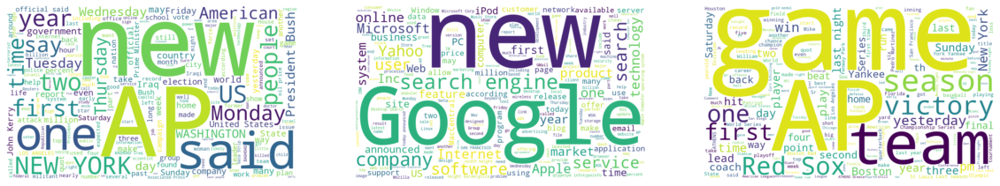

In [ ]:
import matplotlib.pyplot as plt

# Display the generated image:
plt.figure( figsize=(20,20))
plt.subplot(1,3,1)
plt.imshow(wordcloud0, interpolation='bilinear')
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(wordcloud1, interpolation='bilinear')
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(wordcloud2, interpolation='bilinear')
plt.axis("off")
plt.show()

Le premier cluster de politique américaine. 

Le deuxième parle d'IT.
 
Le troisième parle de baseball aux USA.

On a donc bien 3 sujets distincts dans nos clusters, ce qui montre que notre clustering a du sens.

## Approches combinées 

### Reduced k-means 

R[write to console]: Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2



  |======================================================================| 100%Silhouette score dans l'espace d'origine (distance cosine) :
0.16679731
Silhouette score dans l'espace réduit(distance euclidienne) :
0.5504845864511981


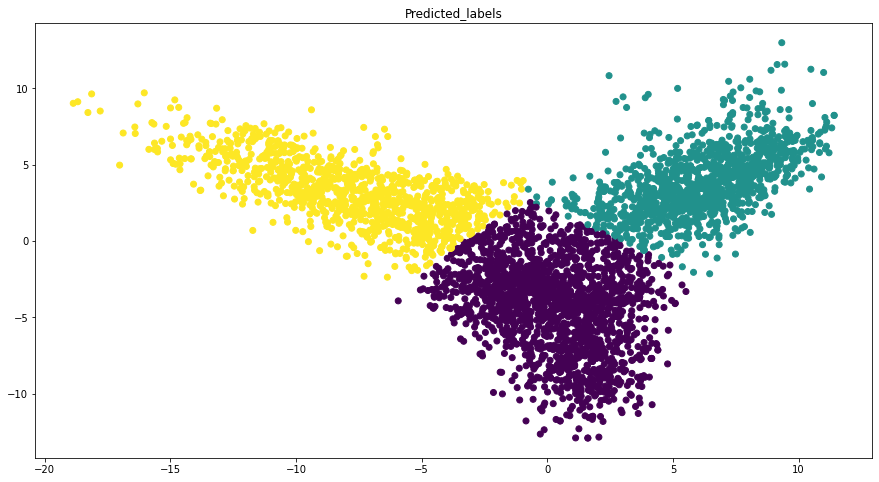

In [ ]:
rkm = fcps.TandemClustering(X_w2v,k,Type='Reduced', PlotIt=False,ndim=2,nstart=10)
pred_labels = rkm[0]
reduced_X_w2v = rkm[1][0]
eval_clustering_2D_nolabels(reduced_X_w2v, pred_labels)
printSilhouetteScores(X_w2v, pred_labels, reduced_X_w2v)

Reduced KM fourni des meilleurs résultats que ceux obtenus avec l'approche tandem (Autoencoder+Kmeans)

### Factorial k-means 

  |======================================================================| 100%Silhouette score dans l'espace d'origine (distance cosine) :
0.091567
Silhouette score dans l'espace réduit(distance euclidienne) :
0.06577869213800633


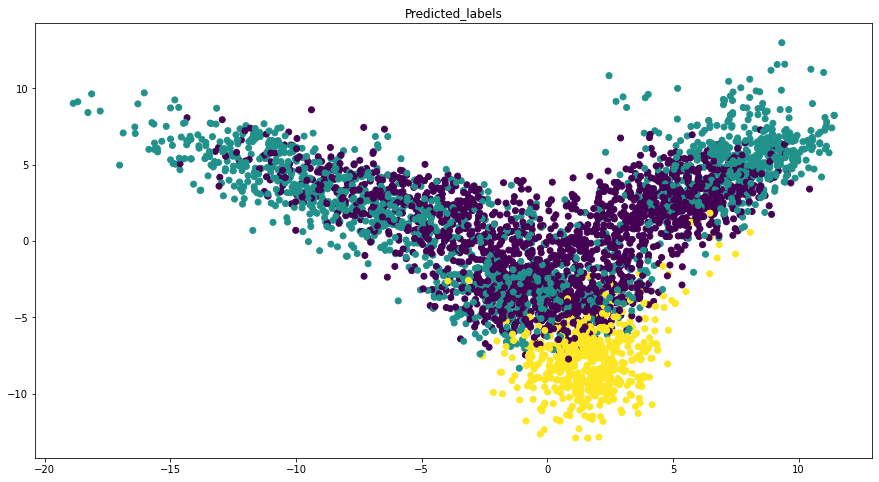

In [ ]:
rkm = fcps.TandemClustering(X_w2v,k,Type='Factorial', PlotIt=False,ndim=2,nstart=10)
pred_labels = rkm[0]
Reduced_X_w2v = rkm[1][0]
eval_clustering_2D_nolabels(reduced_X_w2v, pred_labels)
printSilhouetteScores(X_w2v, pred_labels, reduced_X_w2v)

Factorial KM n'a pas bien fonctionné sur nos données, en visualisant l'espace réduit obtenu, on voit bien que ce dernier est de très mauvaise qualité

### Deep Clustering Network

In [ ]:
import os
import math
import numpy as np
import tensorflow.compat.v1 as tf
from sklearn.cluster import KMeans
from tqdm import tqdm

"""
  Credits:
    This code is based on the implementation provided by Maziar Moradi Fard and Thibaut Thonet
    Available in: https://github.com/MaziarMF/deep-k-means
"""

TF_FLOAT_TYPE = tf.float32

tf.disable_eager_execution()

def fc_layers(input, specs):
    [dimensions, activations, names] = specs
    for dimension, activation, name in zip(dimensions, activations, names):
        input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)
    return input

def autoencoder(input, specs):
    [dimensions, activations, names] = specs
    mid_ind = int(len(dimensions)/2)

    # Encoder
    embedding = fc_layers(input, [dimensions[:mid_ind], activations[:mid_ind], names[:mid_ind]])
    # Decoder
    output = fc_layers(embedding, [dimensions[mid_ind:], activations[mid_ind:], names[mid_ind:]])

    return embedding, output

def f_func(x, y):
    return tf.reduce_sum(tf.square(x - y), axis=1)

def g_func(x, y):
    return tf.reduce_sum(tf.square(x - y), axis=1)

def next_batch(num, data):
    """
    Return a total of `num` random samples.
    """
    indices = np.arange(0, data.shape[0])
    np.random.shuffle(indices)
    indices = indices[:num]
    batch_data = np.asarray([data[i, :] for i in indices])

    return indices, batch_data


#######################################################
############### Deep Clustering Network ###############
#######################################################

class DcnCompGraph(object):
    """Computation graph for the Deep Clustering Network model proposed in:
        Yang, B., Fu, X., Sidiropoulos, N. D., & Hong, M. (2017). Towards K-means-friendly Spaces: Simultaneous Deep
        Learning and Clustering. In ICML '17 (pp. 3861–3870).
    This implementation is inspired by https://github.com/boyangumn/DCN
    """

    def __init__(self, ae_specs, n_clusters, batch_size, n_samples, val_lambda):
        input_size = ae_specs[0][-1]
        embedding_size = ae_specs[0][int((len(ae_specs[0]) - 1) / 2)]

        # Placeholder tensor for input data
        self.input = tf.placeholder(dtype=TF_FLOAT_TYPE, shape=(batch_size, input_size))

        # Auto-encoder loss computations
        self.embedding, self.output = autoencoder(self.input, ae_specs)  # Get the auto-encoder's embedding and output
        rec_error = g_func(self.input, self.output)  # Reconstruction error based on distance g
        self.ae_loss = tf.reduce_mean(rec_error)

        # Clustering loss computations
        ## Tensor for cluster representatives
        minval_rep, maxval_rep = -1, 1
        self.cluster_rep = tf.Variable(tf.random_uniform([n_clusters, embedding_size],
                                                    minval=minval_rep, maxval=maxval_rep,
                                                    dtype=TF_FLOAT_TYPE), name='cluster_rep', dtype=TF_FLOAT_TYPE)

        ## Clustering assignments for all samples in the dataset
        initial_clustering_assign = tf.random_uniform(minval=0, maxval=n_clusters, dtype=tf.int32, shape=[n_samples])
        self.cluster_assign = tf.Variable(initial_clustering_assign, name='cluster_assign', dtype=tf.int32, trainable=False)

        ## Get the cluster representative corresponding to the cluster of each batch sample
        self.indices = tf.placeholder(dtype=tf.int32, shape=batch_size)  # Placeholder for sample indices in current batch
        batch_clust_rep = []
        for j in range(batch_size):
            k = self.cluster_assign[self.indices[j]]  # Clustering assignment for sample j in batch
            batch_clust_rep.append(self.cluster_rep[k, :])
        stack_batch_clust_rep = tf.stack(batch_clust_rep)

        ## Compute the k-means term
        clustering_error = f_func(self.embedding, stack_batch_clust_rep)

        # Compute the full loss combining the reconstruction error and k-means term
        self.ae_loss = tf.reduce_mean(rec_error)
        self.kmeans_loss = tf.reduce_mean(clustering_error)
        self.loss = self.ae_loss + val_lambda * self.kmeans_loss

        # The optimizer is defined to minimize this loss
        optimizer = tf.train.AdamOptimizer()
        self.pretrain_op = optimizer.minimize(self.ae_loss) # Pretrain the autoencoder before starting DCN
        self.train_op = optimizer.minimize(self.loss)

        # As it has been pointed out in the DCN paper, first the weights of the autoencoder shall be trained then the
        # assignments and cluster representatives. So far in the computation graph we have optimized the weights of the
        # autoencoder, now it's the time for the assignments and representatives.

        # Update the clustering assignments
        for j in range(batch_size):
            # Find which cluster representative is the closest to the current batch sample
            new_assign = tf.argmin(f_func(tf.reshape(self.embedding[j, :], (1, embedding_size)), self.cluster_rep),
                                   output_type=tf.int32)
            # Update the clustering assignment
            self.cluster_assign_update = tf.assign(self.cluster_assign[self.indices[j]], new_assign)

        # Update the cluster representatives
        ## Initialize the value of count
        initial_count = tf.constant(100.0, shape=[n_clusters])
        count = tf.Variable(initial_count, name='count', dtype=TF_FLOAT_TYPE, trainable=False)
        ## Update the cluster representatives according to Equation (8) in the DCN paper
        for j in range(batch_size):
            k = self.cluster_assign[self.indices[j]]  # Clustering assignment for sample j in batch
            self.count_update = tf.assign(count[k], count[k] + 1)  # Updated count for cluster assignments
            new_rep = self.cluster_rep[k] - (1 / count[k]) * (self.cluster_rep[k] - self.embedding[j])
            self.cluster_rep_update = tf.assign(self.cluster_rep[k], new_rep)

def DCN(data, n_clusters, n_components, n_pretrain_epochs=50, n_finetuning_epochs=50, lambda_=1.0, batch_size=256, seed=None, cpu=False):
    # Auto-encoder architecture
    input_size = data.shape[1]
    hidden_1_size = 500
    hidden_2_size = 500
    hidden_3_size = 2000
    embedding_size = n_components
    dimensions = [hidden_1_size, hidden_2_size, hidden_3_size, embedding_size, # Encoder layer dimensions
                  hidden_3_size, hidden_2_size, hidden_1_size, input_size] # Decoder layer dimensions
    activations = [tf.nn.relu, tf.nn.relu, tf.nn.relu, None, # Encoder layer activations
                  tf.nn.relu, tf.nn.relu, tf.nn.relu, None] # Decoder layer activations
    names = ['enc_hidden_1', 'enc_hidden_2', 'enc_hidden_3', 'embedding', # Encoder layer names
            'dec_hidden_1', 'dec_hidden_2', 'dec_hidden_3', 'output'] # Decoder layer names

    n_samples = data.shape[0]
    n_batches = int(math.ceil(n_samples / batch_size)) # Number of mini-batches
    pretrain = True # Specify if DKM's autoencoder should be pretrained

    # Hardware specifications
    if cpu:
        os.environ['CUDA_VISIBLE_DEVICES'] = '-1' # Run on CPU instead of GPU if batch_size is small
    gpu_options = tf.GPUOptions(per_process_gpu_memory_fraction=0.05)

    if seed is not None:
      tf.reset_default_graph()
      tf.set_random_seed(seed)
      np.random.seed(seed)

    cg = DcnCompGraph([dimensions, activations, names], n_clusters, batch_size, n_samples,
                      lambda_)

    # Run the computation graph
    with tf.Session(config=tf.ConfigProto(gpu_options=gpu_options)) as sess:
        # Initialization
        init = tf.global_variables_initializer()
        sess.run(init)

        # Pretrain if specified
        if pretrain:
            print("Starting autoencoder pretraining...")

            # Variables to save pretraining tensor content
            embeddings = np.zeros((n_samples, embedding_size), dtype=float)

            # First, pretrain the autoencoder
            ## Loop over epochs
            for _ in tqdm(range(n_pretrain_epochs)):

                # Loop over the samples
                for _ in range(n_batches):
                    # Fetch a random data batch of the specified size
                    indices_, data_batch = next_batch(batch_size, data)

                    # Run the computation graph until pretrain_op (only on autoencoder) on the data batch
                    _, embedding_, ae_loss_ = sess.run((cg.pretrain_op, cg.embedding, cg.ae_loss),
                                                       feed_dict={cg.input: data_batch})

                    # Save the embeddings for batch samples
                    for j in range(len(indices_)):
                        embeddings[indices_[j], :] = embedding_[j, :]

            # Second, run k-means++ on the pretrained embeddings
            print("Running k-means on the learned embeddings...")
            kmeans_model = KMeans(n_clusters=n_clusters, init="k-means++").fit(embeddings)

            # The cluster centers are used to initialize the cluster representatives in DCN
            sess.run(tf.assign(cg.cluster_rep, kmeans_model.cluster_centers_))

            # The clustering assignments are used to initialize the clustering assignments in DCN
            sess.run(tf.assign(cg.cluster_assign, kmeans_model.labels_))

        # Train the full DCN model
        print("Starting DCN training...")
        ## Loop over epochs
        for epoch in tqdm(range(n_finetuning_epochs)):
            # print("Training step: epoch {}".format(epoch))

            # Loop over the samples
            for _ in range(n_batches):
                # Fetch a random data batch of the specified size
                indices_, data_batch = next_batch(batch_size, data)

                # Run the computation graph on the data batch
                _, _, _, _, loss_, cluster_assign_, ae_loss_, kmeans_loss_ =\
                    sess.run((cg.train_op, cg.cluster_assign_update, cg.count_update, cg.cluster_rep_update, cg.loss,
                              cg.cluster_assign, cg.ae_loss, cg.kmeans_loss),
                             feed_dict={cg.input: data_batch, cg.indices: indices_})
        
        embeddings = np.zeros((n_samples, embedding_size), dtype=float)
        for _ in range(n_batches):
            # Fetch a random data batch of the specified size
            indices_, data_batch = next_batch(batch_size, data)

            # Run the computation graph on the data batch
            _, _, embeddings_, _, _, loss_, cluster_assign_, ae_loss_, kmeans_loss_ =\
                sess.run((cg.train_op, cg.cluster_assign_update, cg.embedding, cg.count_update, cg.cluster_rep_update, cg.loss,
                          cg.cluster_assign, cg.ae_loss, cg.kmeans_loss),
                          feed_dict={cg.input: data_batch, cg.indices: indices_})

            for j in range(len(indices_)):
                embeddings[indices_[j], :] = embeddings_[j, :]
                
    return embeddings, cluster_assign_


#######################################################
##################### Deep K-means ####################
#######################################################

class DkmCompGraph(object):
    """Computation graph for Deep K-Means
    """

    def __init__(self, ae_specs, n_clusters, val_lambda):
        input_size = ae_specs[0][-1]
        embedding_size = ae_specs[0][int((len(ae_specs[0])-1)/2)]

        # Placeholder tensor for input data
        self.input = tf.placeholder(dtype=TF_FLOAT_TYPE, shape=(None, input_size))

        # Auto-encoder loss computations
        self.embedding, self.output = autoencoder(self.input, ae_specs)  # Get the auto-encoder's embedding and output
        rec_error = g_func(self.input, self.output)  # Reconstruction error based on distance g

        # k-Means loss computations
        ## Tensor for cluster representatives
        minval_rep, maxval_rep = -1, 1
        self.cluster_rep = tf.Variable(tf.random_uniform([n_clusters, embedding_size],
                                                    minval=minval_rep, maxval=maxval_rep,
                                                    dtype=TF_FLOAT_TYPE), name='cluster_rep', dtype=TF_FLOAT_TYPE)

        ## First, compute the distance f between the embedding and each cluster representative
        list_dist = []
        for i in range(0, n_clusters):
            dist = f_func(self.embedding, tf.reshape(self.cluster_rep[i, :], (1, embedding_size)))
            list_dist.append(dist)
        self.stack_dist = tf.stack(list_dist)

        ## Second, find the minimum squared distance for softmax normalization
        min_dist = tf.reduce_min(list_dist, axis=0)

        ## Third, compute exponentials shifted with min_dist to avoid underflow (0/0) issues in softmaxes
        self.alpha = tf.placeholder(dtype=TF_FLOAT_TYPE, shape=())  # Placeholder tensor for alpha
        list_exp = []
        for i in range(n_clusters):
            exp = tf.exp(-self.alpha * (self.stack_dist[i] - min_dist))
            list_exp.append(exp)
        stack_exp = tf.stack(list_exp)
        sum_exponentials = tf.reduce_sum(stack_exp, axis=0)

        ## Fourth, compute softmaxes and the embedding/representative distances weighted by softmax
        list_softmax = []
        list_weighted_dist = []
        for j in range(n_clusters):
            softmax = stack_exp[j] / sum_exponentials
            weighted_dist = self.stack_dist[j] * softmax
            list_softmax.append(softmax)
            list_weighted_dist.append(weighted_dist)
        stack_weighted_dist = tf.stack(list_weighted_dist)

        # Compute the full loss combining the reconstruction error and k-means term
        self.ae_loss = tf.reduce_mean(rec_error)
        self.kmeans_loss = tf.reduce_mean(tf.reduce_sum(stack_weighted_dist, axis=0))
        self.loss = self.ae_loss + val_lambda * self.kmeans_loss

        # The optimizer is defined to minimize this loss
        optimizer = tf.train.AdamOptimizer()
        self.pretrain_op = optimizer.minimize(self.ae_loss) # Pretrain the autoencoder before starting DKM
        self.train_op = optimizer.minimize(self.loss) # Train the whole DKM model

def DKM(data, n_clusters, n_components, n_pretrain_epochs=50, n_finetuning_epochs=5, lambda_=1.0, batch_size=256, seed=None, cpu=False):
    """
        The final number of finetuning epochs is n_finetuning_epochs * 20 if pretrain and n_finetuning_epochs * 40 if annealing
    """
    # Auto-encoder architecture
    input_size = data.shape[1]
    hidden_1_size = 500
    hidden_2_size = 500
    hidden_3_size = 2000
    embedding_size = n_components
    dimensions = [hidden_1_size, hidden_2_size, hidden_3_size, embedding_size, # Encoder layer dimensions
                  hidden_3_size, hidden_2_size, hidden_1_size, input_size] # Decoder layer dimensions
    activations = [tf.nn.relu, tf.nn.relu, tf.nn.relu, None, # Encoder layer activations
                  tf.nn.relu, tf.nn.relu, tf.nn.relu, None] # Decoder layer activations
    names = ['enc_hidden_1', 'enc_hidden_2', 'enc_hidden_3', 'embedding', # Encoder layer names
            'dec_hidden_1', 'dec_hidden_2', 'dec_hidden_3', 'output'] # Decoder layer names

    n_samples = data.shape[0]
    n_batches = int(math.ceil(n_samples / batch_size)) # Number of mini-batches
    pretrain = True # Specify if DKM's autoencoder should be pretrained
    annealing = False # Specify if annealing should be used

    # Define the alpha scheme depending on if the approach includes annealing/pretraining
    if annealing and not pretrain:
        constant_value = 1  # specs.embedding_size # Used to modify the range of the alpha scheme
        max_n = 40  # Number of alpha values to consider
        alphas = np.zeros(max_n, dtype=float)
        alphas[0] = 0.1
        for i in range(1, max_n):
            alphas[i] = (2 ** (1 / (np.log(i + 1)) ** 2)) * alphas[i - 1]
        alphas = alphas / constant_value
    elif not annealing and pretrain:
        constant_value = 1  # specs.embedding_size # Used to modify the range of the alpha scheme
        max_n = 20  # Number of alpha values to consider (constant values are used here)
        alphas = 1000*np.ones(max_n, dtype=float) # alpha is constant
        alphas = alphas / constant_value
    else:
        raise Exception("Run with either annealing (-a) or pretraining (-p), but not both.")

    # Hardware specifications
    if cpu:
        os.environ['CUDA_VISIBLE_DEVICES'] = '-1' # Run on CPU instead of GPU if batch_size is small

    gpu_options = tf.GPUOptions(per_process_gpu_memory_fraction=0.05)
    config = tf.ConfigProto(gpu_options=gpu_options)

    if seed is not None:
      tf.reset_default_graph()
      tf.set_random_seed(seed)
      np.random.seed(seed)
      
    # Define the computation graph for DKM
    cg = DkmCompGraph([dimensions, activations, names], n_clusters, lambda_)

    # Run the computation graph
    with tf.Session(config=config) as sess:
        # Initialization
        init = tf.global_variables_initializer()
        sess.run(init)

        # Variables to save tensor content
        distances = np.zeros((n_clusters, n_samples))

        # Pretrain if specified
        if pretrain:
            print("Starting autoencoder pretraining...")

            # Variables to save pretraining tensor content
            embeddings = np.zeros((n_samples, embedding_size), dtype=float)

            # First, pretrain the autoencoder
            ## Loop over epochs
            for _ in tqdm(range(n_pretrain_epochs)):
                # Loop over the samples
                for _ in range(n_batches):
                    # Fetch a random data batch of the specified size
                    indices, data_batch = next_batch(batch_size, data)

                    # Run the computation graph until pretrain_op (only on autoencoder) on the data batch
                    _, embedding_, ae_loss_ = sess.run((cg.pretrain_op, cg.embedding, cg.ae_loss),
                                                        feed_dict={cg.input: data_batch})

                    # Save the embeddings for batch samples
                    for j in range(len(indices)):
                        embeddings[indices[j], :] = embedding_[j, :]

            # Second, run k-means++ on the pretrained embeddings
            print("Running k-means on the learned embeddings...")
            kmeans_model = KMeans(n_clusters=n_clusters, init="k-means++").fit(embeddings)

            # The cluster centers are used to initialize the cluster representatives in DKM
            sess.run(tf.assign(cg.cluster_rep, kmeans_model.cluster_centers_))

        # Train the full DKM model
        if (len(alphas) > 0):
            print("Starting DKM training...")
        ## Loop over alpha (inverse temperature), from small to large values
        for k in tqdm(range(len(alphas))):
            # Loop over epochs per alpha
            for _ in range(n_finetuning_epochs):
                # Loop over the samples
                for _ in range(n_batches):
                    # Fetch a random data batch of the specified size
                    indices, data_batch = next_batch(batch_size, data)

                    # Run the computation graph on the data batch
                    _, loss_, stack_dist_, cluster_rep_, ae_loss_, kmeans_loss_ =\
                        sess.run((cg.train_op, cg.loss, cg.stack_dist, cg.cluster_rep, cg.ae_loss, cg.kmeans_loss),
                                  feed_dict={cg.input: data_batch, cg.alpha: alphas[k]})

                    # Save the distances for batch samples
                    for j in range(len(indices)):
                        distances[:, indices[j]] = stack_dist_[:, j]

        _, loss_, X_reduced, stack_dist_, cluster_rep_, ae_loss_, kmeans_loss_ =\
        sess.run((cg.train_op, cg.loss, cg.embedding, cg.stack_dist, cg.cluster_rep, cg.ae_loss, cg.kmeans_loss),
                  feed_dict={cg.input: data, cg.alpha: alphas[k]})

        distances = stack_dist_

        # Infer cluster assignments for all samples
        cluster_assign = np.zeros((n_samples), dtype=float)
        for i in range(n_samples):
            index_closest_cluster = np.argmin(distances[:, i])
            cluster_assign[i] = index_closest_cluster
        cluster_assign = cluster_assign.astype(np.int64)

    return X_reduced, cluster_assign

In [ ]:
embeddings, cluster_assign_ = DCN(X_w2v, n_clusters=k,n_components=2)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:21: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
/usr/local/lib/python3.7/dist-packages/keras/legacy_tf_layers/core.py:255: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  return layer.apply(inputs)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:07<00:00,  6.48it/s]


Running k-means on the learned embeddings...
Starting DCN training...


100%|██████████| 50/50 [00:27<00:00,  1.84it/s]


Silhouette score dans l'espace d'origine (distance cosine) :
0.16121992
Silhouette score dans l'espace réduit(distance euclidienne) :
0.19317286683392917


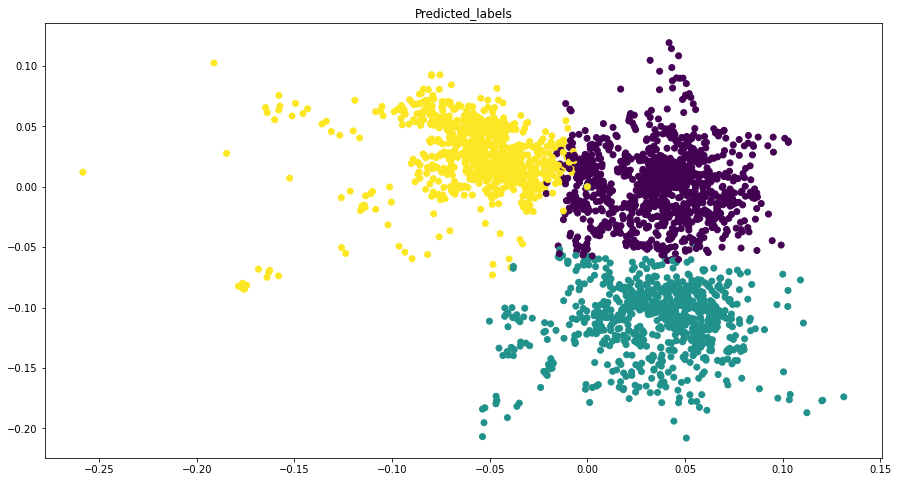

In [ ]:
eval_clustering_2D_nolabels(embeddings, cluster_assign_)
printSilhouetteScores(X_w2v, cluster_assign_, embeddings)

### Deep k-means

In [ ]:
tf.reset_default_graph()

In [ ]:
X_reduced, cluster_assign = DKM(X_w2v,n_clusters=k,n_components=2)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:21: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
/usr/local/lib/python3.7/dist-packages/keras/legacy_tf_layers/core.py:255: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  return layer.apply(inputs)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:06<00:00,  7.72it/s]


Running k-means on the learned embeddings...
Starting DKM training...


100%|██████████| 20/20 [00:18<00:00,  1.07it/s]


Silhouette score dans l'espace d'origine (distance cosine) :
0.16121992
Silhouette score dans l'espace réduit(distance euclidienne) :
0.19317286683392917


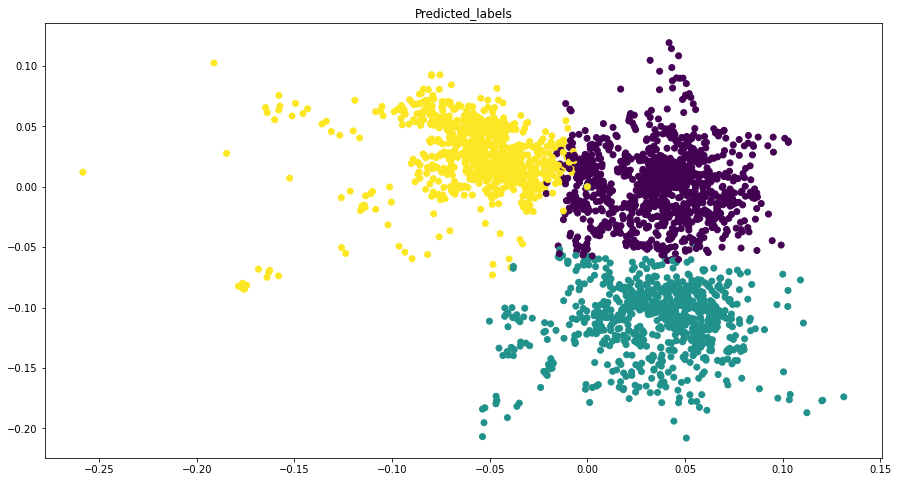

In [ ]:
eval_clustering_2D_nolabels(embeddings, cluster_assign_)
printSilhouetteScores(X_w2v, cluster_assign_, embeddings)

## Interprétation des clusters

Nous allons choisir comme clusters ceux donnés par Reduced Kmeans, puisque c'est la méthode qui donnait les meilleurs scores

In [ ]:
rkm = fcps.TandemClustering(X_w2v,k,Type='Reduced', PlotIt=False,ndim=2,nstart=10)
pred_labels = rkm[0]
reduced_X_w2v = rkm[1][0]


  |======================================================================| 100%

In [ ]:
# Nettoyage du texte avant le nuage de mots
texts_cleaned = texts.map(lambda t: clean_text(t))


In [ ]:
dic = {'text': texts_cleaned, 'cluster': pred_labels}
df_texts = pd.DataFrame(data=dic)

In [ ]:
df_texts

,text,cluster
0,Eli Manning remains New York Giants quarterbac...,2
1,extra hour exercise week could significantly c...,1
2,AP Boston Red Sox send hobbled star Curt Schil...,2
3,BASEBALL Arizona NL Named Bob Gebhard assistan...,2
4,CFHT Twentyfive year ago September CanadaFranc...,1
...,...,...
3980,GEORGE TOWN Cayman Islands strengthened Hurric...,1
3981,Findcom business search engine wwwfindcom toda...,3
3982,followed Arkansas football last four year know...,2
3983,Loren Woods point careerhigh rebound Vince Car...,2


### **Nuage de mots**

In [ ]:
from wordcloud import WordCloud

# cluster 0
wholeText0 = " ".join(t for t in df_texts.loc[df_texts['cluster'] == 1, 'text'])
wordcloud0 = WordCloud(width=1000, height=600, background_color="white").generate(wholeText0)

# cluster 1
wholeText1 = " ".join(t for t in df_texts.loc[df_texts['cluster'] == 2, 'text'])
wordcloud1 = WordCloud(width=1000, height=600, background_color="white").generate(wholeText1)

# cluster 2
wholeText2 = " ".join(t for t in df_texts.loc[df_texts['cluster'] == 3, 'text'])
wordcloud2 = WordCloud(width=1000, height=600, background_color="white").generate(wholeText2)

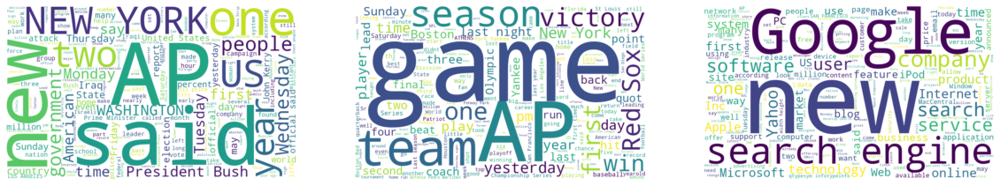

In [ ]:
import matplotlib.pyplot as plt

# Display the generated image:
plt.figure( figsize=(20,20))
plt.subplot(1,3,1)
plt.imshow(wordcloud0, interpolation='bilinear')
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(wordcloud1, interpolation='bilinear')
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(wordcloud2, interpolation='bilinear')
plt.axis("off")
plt.show()

Le premier cluster parle de politique américaine.

Le deuxième parle d'équipes de baseball aux USA.

Le troisième parle d'IT.

On a donc bien 3 sujets distincts dans nos clusters, ce qui montre que notre clustering a du sens.

#BERT

In [ ]:
def encode_sentences_batch(model, tokenizer, sentences, batch_size=32):
    n_layers = model.config.num_hidden_layers
    tokenized_sentences = [tokenizer.tokenize(sent)[:512] for sent in sentences]
    
    # sort by length
    argsort = np.argsort([len(i) for i in tokenized_sentences])
    sorted_inds = np.argsort(argsort)

    sentences = [sentences[i] for i in argsort]

    # sentences_dataset = BertDataset(sentences)
    data_loader = DataLoader(dataset=sentences,
                                batch_size=batch_size,
                                shuffle=False,
                                num_workers=4,
                                collate_fn=lambda x: collate_fn(x, tokenizer)
                                )

    embeddings = {k:[] for k in range(n_layers)}

    for _, batch in enumerate(data_loader):
        with torch.no_grad():
            x, mask = batch
            x = x.to(device)

            output = model(x)
            hidden_states = output.hidden_states
            hidden_states = list(hidden_states[1:])

            for ind_layer, layer_embeddings in enumerate(hidden_states):
                # remove padding's zeros
                layer_embeddings = layer_embeddings.cpu() * mask[:, :, None]
                # compute average over tokens
                layer_hidden_state = layer_embeddings.sum(axis=1) / mask.sum(axis=1).unsqueeze(1)


                embeddings[ind_layer].append(layer_hidden_state)

    # put the batches together and sort the documents
    embeddings = [torch.vstack(embeddings[layer_ind])[sorted_inds].numpy() for layer_ind in range(n_layers)]
    
    return embeddings

In [ ]:
def collate_fn(batch_sentences, tokenizer):
    tokenized = tokenizer(batch_sentences, padding=True, truncation=True, max_length=512)
    inds = tokenized['input_ids']
    mask = tokenized['attention_mask']

    inds = torch.tensor(inds)
    mask = torch.tensor(mask)

    return inds, mask

In [ ]:
!pip install transformers

     |████████████████████████████████| 3.3 MB 11.7 MB/s 
     |████████████████████████████████| 61 kB 470 kB/s 
     |████████████████████████████████| 895 kB 37.9 MB/s 
     |████████████████████████████████| 596 kB 38.2 MB/s 
     |████████████████████████████████| 3.3 MB 35.7 MB/s 
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [ ]:
from transformers import BertModel, BertTokenizer, RobertaModel, RobertaTokenizer
from torch.utils.data import DataLoader
import torch

In [ ]:
if torch.cuda.is_available():
  device = 'cuda'
else:
  device = 'cpu'

In [ ]:
device

'cuda'

In [ ]:
model_name = 'bert-base-cased'
model = BertModel.from_pretrained(model_name, output_hidden_states=True)
tokenizer = BertTokenizer.from_pretrained(model_name)

Downloading:   0%|          | 0.00/570 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/416M [00:00<?, ?B/s]

Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.seq_relationship.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.bias', 'cls.predictions.bias', 'cls.predictions.decoder.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


Downloading:   0%|          | 0.00/208k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/29.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/426k [00:00<?, ?B/s]

In [ ]:
if device == 'cuda':
  model.cuda()

In [ ]:
X_bert = encode_sentences_batch(model, tokenizer, texts, batch_size=32)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [ ]:
X_bert[11].shape

(3985, 768)

In [ ]:
X_bert = np.array(X_bert).mean(axis=0)

X_bert.shape

(3985, 768)

## Détermination du nombre de clusters

In [ ]:
def findBestKWithKMeans(X):

  sum_of_squared_distances = []
  K = range(1,10)
  for k in K:
      k_means = KMeans(n_clusters=k, random_state=42, n_init=10)
      model = k_means.fit(X)
      sum_of_squared_distances.append(k_means.inertia_)

  plt.plot(K, sum_of_squared_distances, 'bx-')
  plt.xlabel('k')
  plt.ylabel('sum_of_squared_distances')
  plt.title('elbow method for optimal k')
  plt.show()

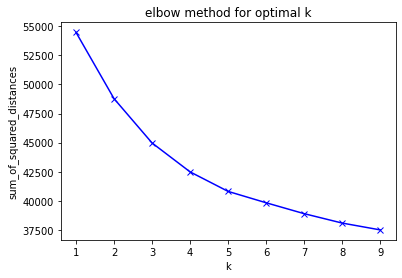

In [ ]:
#Elbow method
findBestKWithKMeans(X_bert)

*     La méthode Elbow avec KMeans sur l'espace d'origine ne nous montre pas clairement l'existence d'un coude. en pourrait estimer le nombre optimal de clusters à k=3 ou k=4.
Pour avoir un avis tranché nous effectuons dans ce qui suit un clustering hiérarchique et nous afficherons le dendrogramme correspondant afin de décider du nombre de clusters. 

In [ ]:
# Dendogram for Hierarchical Clustering
import scipy.cluster.hierarchy as shc


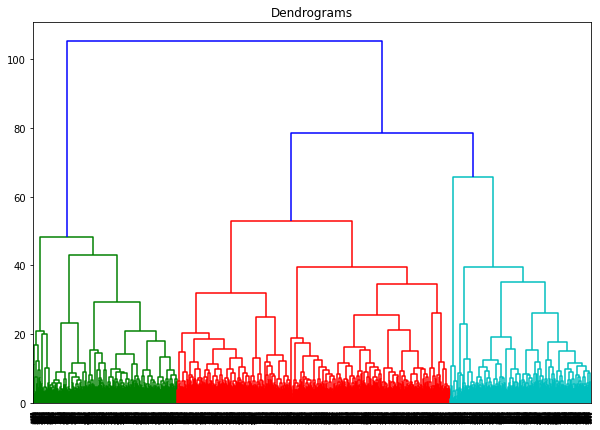

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 7))  
plt.title("Dendrograms")  
dend = shc.dendrogram(shc.linkage(X_bert, method='ward'))

En affichant le dendrogramme, nous pouvons voir que la meilleure valeur de K semble être 3.

In [ ]:
!pip install hdbscan
import hdbscan

     |████████████████████████████████| 6.4 MB 10.8 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for hdbscan: filename=hdbscan-0.8.27-cp37-cp37m-linux_x86_64.whl size=2311900 sha256=4a66d796acc804b5d5765d94ee6b05f824484765cf0a978f8e80fe10296c3371
  Stored in directory: /root/.cache/pip/wheels/73/5f/2f/9a259b84003b84847c259779206acecabb25ab56f1506ee72b
Successfully built hdbscan


In [ ]:
!pip install umap-learn

     |████████████████████████████████| 86 kB 4.5 MB/s 
     |████████████████████████████████| 1.1 MB 33.2 MB/s 
  Created wheel for umap-learn: filename=umap_learn-0.5.2-py3-none-any.whl size=82709 sha256=7d152f746575388fd6ff5d27d20f78f5a59c67fc35d23349677b82f35d82e5d0
  Stored in directory: /root/.cache/pip/wheels/84/1b/c6/aaf68a748122632967cef4dffef68224eb16798b6793257d82
  Created wheel for pynndescent: filename=pynndescent-0.5.5-py3-none-any.whl size=52603 sha256=e0d3c8c1161593877e380b0ce10d0236a2dd6398b2d767873d8c21d6c0305108
  Stored in directory: /root/.cache/pip/wheels/af/e9/33/04db1436df0757c42fda8ea6796d7a8586e23c85fac355f476
Successfully built umap-learn pynndescent


Nous avons vu sur les dataset supervisés que UMAP et TSNE étaient les plus efficaces pour obtenir un espace réduit intéressant à partir d'un embedding BERT. En appliquant la méthode du coude sur ces espaces réduits, nous allons voir si le k optimal obtenu ainsi est cohérent avec ce qu'on a sur l'espace d'origine.

In [ ]:
from umap import UMAP

X_bert_umap = UMAP(n_components=2, random_state=42).fit_transform(X_bert)

/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)


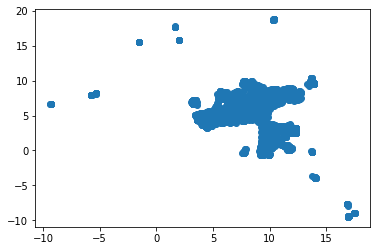

In [ ]:
plt.scatter(x = X_bert_umap[:, 0], y = X_bert_umap[:, 1])

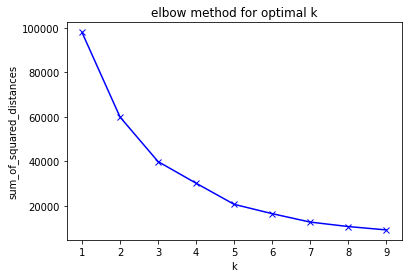

In [ ]:
findBestKWithKMeans(X_bert_umap)

Avec UMAP, on dirait que le coude est plutôt à K = 3.

In [ ]:
from sklearn.manifold import TSNE
X_bert_tsne = TSNE(n_components=2, random_state=42).fit_transform(X_bert)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


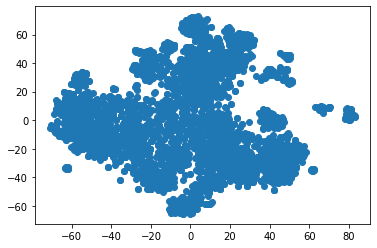

In [ ]:
plt.scatter(x = X_bert_tsne[:, 0], y = X_bert_tsne[:, 1])

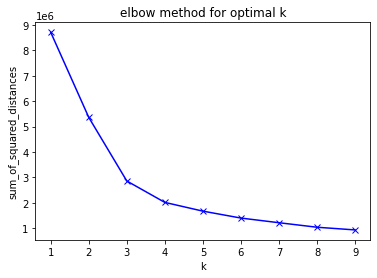

In [ ]:
findBestKWithKMeans(X_bert_tsne)

Avec TSNE, le coude est bien visible à K = 3

Au vu de tous les résultats précédents, nous choisissons K = 3, la valeur qui fait à peu près consensus.

In [ ]:
k=3

## Clustering sur l'espace d'origine

### KMeans

In [ ]:
pred_labels = KMeans(k,random_state=42).fit(X_bert).labels_
printSilhouetteScores(X_bert, pred_labels)


Silhouette score dans l'espace d'origine (distance cosine) :
0.2022439


### Spectral Clustering

In [ ]:
pred_labels=SpectralClustering(k,affinity='nearest_neighbors',n_neighbors=30,random_state=42).fit(X_bert).labels_
printSilhouetteScores(X_bert, pred_labels)

Silhouette score dans l'espace d'origine (distance cosine) :
0.23977485


### HDBSCAN

In [ ]:
!pip install hdbscan
import hdbscan

In [ ]:
from sklearn.preprocessing import StandardScaler
X_bert_sc = StandardScaler().fit_transform(X_bert)
#from sklearn.metrics import pairwise_distances
#distance = pairwise_distances(X_bert, metric='cosine')
hdbscan_model = hdbscan.HDBSCAN(min_cluster_size=350, metric='braycurtis').fit(X_bert_sc)

#pred_labels = hdbscan_model.fit(distance.astype('float64')).labels_

pred_labels = hdbscan_model.labels_
printSilhouetteScores(X_bert, pred_labels)

Silhouette score dans l'espace d'origine (distance cosine) :
0.021580284


In [ ]:
np.unique(pred_labels)

array([-1,  0,  1])

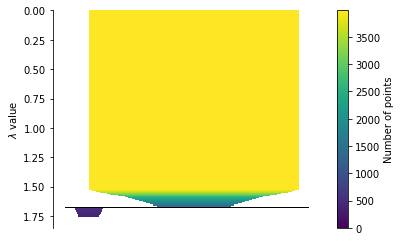

In [ ]:
hdbscan_model.condensed_tree_.plot()

### CAH

In [ ]:
from sklearn.cluster import AgglomerativeClustering

pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit(X_bert).labels_
printSilhouetteScores(X_bert, pred_labels)

Silhouette score dans l'espace d'origine (distance cosine) :
0.16993786


  * Le clustering sur l'espace d'origine qui a donné le meilleur résultats en terme de silhouette score est le spectral clustering (0.24%)

## Approches Tandem

### PCA 

In [ ]:
X_bert_reduced = PCA(n_components=2, whiten=False, random_state=42).fit_transform(X_bert)

#### PCA + Kmeans 

Silhouette score dans l'espace d'origine (distance cosine) :
0.20910591
Silhouette score dans l'espace réduit(distance euclidienne) :
0.4985677


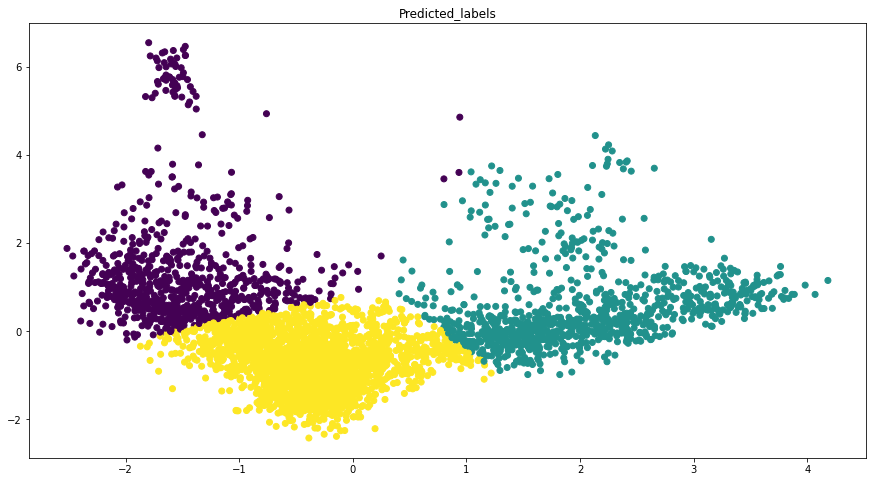

In [ ]:
pred_labels = KMeans(k,random_state=42).fit(X_bert_reduced).labels_
eval_clustering_2D_nolabels(X_bert_reduced, pred_labels)
printSilhouetteScores(X_bert, pred_labels, X_bert_reduced)

La PCA n'a pas résussi à bien séparer les différents clusters dans l'espace réduit mais il donne de meilleurs résultats de silhouette score sur le kmeans sur l'espace réduit.

Le score PCA+Kmeans atteins les 0.50%

#### PCA + Clustering spectral 

Silhouette score dans l'espace d'origine (distance cosine) :
0.18766968
Silhouette score dans l'espace réduit(distance euclidienne) :
0.47053123


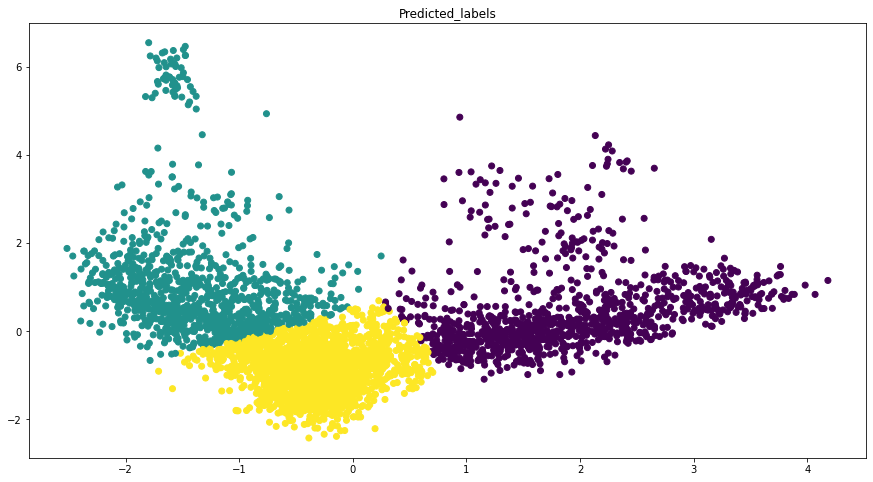

In [ ]:
pred_labels=SpectralClustering(k,affinity='nearest_neighbors',n_neighbors=30,random_state=42).fit(X_bert_reduced).labels_
eval_clustering_2D_nolabels(X_bert_reduced, pred_labels)
printSilhouetteScores(X_bert, pred_labels, X_bert_reduced)

#### PCA + HDBSCAN

[-1  0  1]
Silhouette score dans l'espace d'origine (distance cosine) :
0.16018741
Silhouette score dans l'espace réduit(distance euclidienne) :
0.31449184


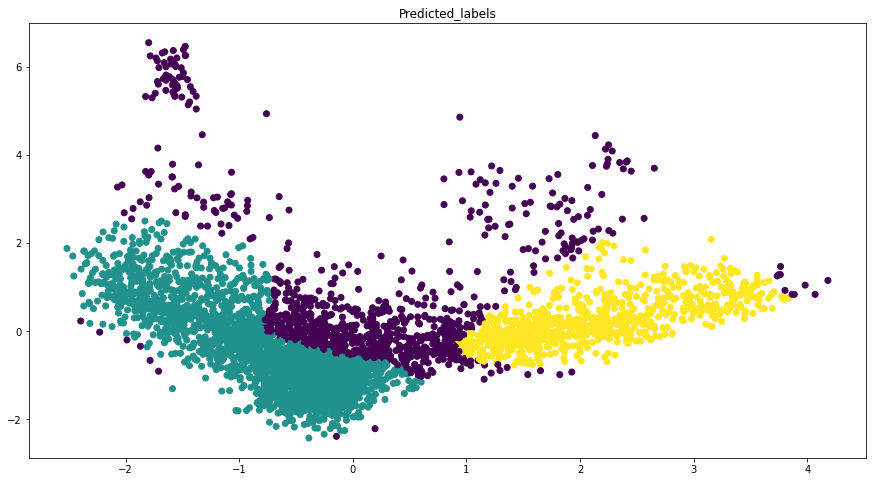

In [ ]:
X_bert_reduced_sc = StandardScaler().fit_transform(X_bert_reduced)
hdbscan_model = hdbscan.HDBSCAN(algorithm= 'best', alpha=1.0, leaf_size=40,min_cluster_size=300, cluster_selection_method='eom', metric='braycurtis').fit(X_bert_reduced_sc)
pred_labels= hdbscan_model.labels_
print(np.unique(pred_labels))
eval_clustering_2D_nolabels(X_bert_reduced, pred_labels)
printSilhouetteScores(X_bert, pred_labels, X_bert_reduced)

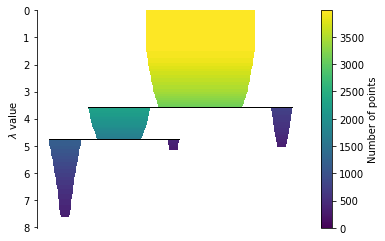

In [ ]:
hdbscan_model.condensed_tree_.plot()

#### PCA + CAH

Silhouette score dans l'espace d'origine (distance cosine) :
0.19524132
Silhouette score dans l'espace réduit(distance euclidienne) :
0.4785427


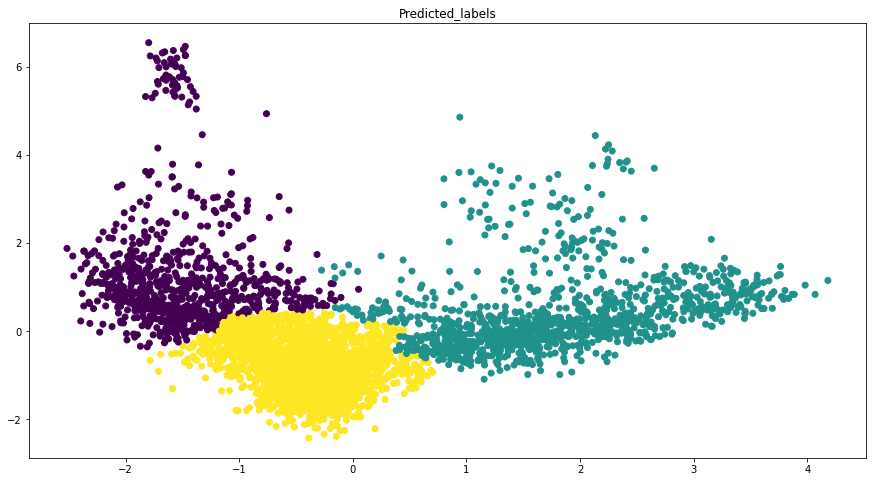

In [ ]:
pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit(X_bert_reduced).labels_
eval_clustering_2D_nolabels(X_bert_reduced, pred_labels)
printSilhouetteScores(X_bert, pred_labels, X_bert_reduced)

En utilisant la réduction de dimension ACP sur la représentation BERT, le Kmeans a donné de meilleurs résultats en terme de silhouette score (0.49%) ce qui est très bon.  

### TSNE

In [ ]:
from sklearn.manifold import TSNE
X_bert_tsne = TSNE(n_components=2, random_state=42).fit_transform(X_bert)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


#### TSNE + Kmeans 

Silhouette score dans l'espace d'origine (distance cosine) :
0.145289
Silhouette score dans l'espace réduit(distance euclidienne) :
0.4550013


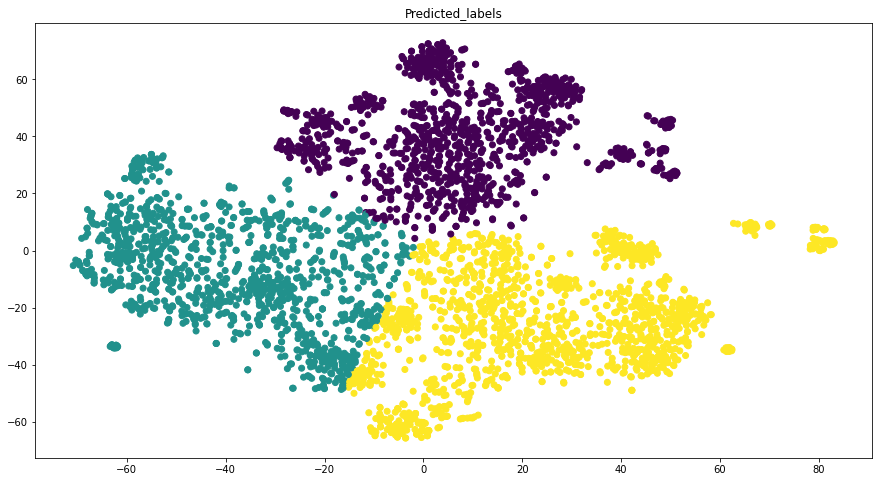

In [ ]:
pred_labels = KMeans(k,random_state=42).fit(X_bert_tsne).labels_
eval_clustering_2D_nolabels(X_bert_tsne, pred_labels)
printSilhouetteScores(X_bert, pred_labels, X_bert_tsne)

On voit que TSNE a bien réussi à séparer les clusters dans l'espace réduit.
Le kmeans sur cet espace réduit a donné un assez bon résultat (0.45 de silhouette score)

#### TSNE + Clustering spectral 

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


Silhouette score dans l'espace d'origine (distance cosine) :
0.3586312
Silhouette score dans l'espace réduit(distance euclidienne) :
0.12716791


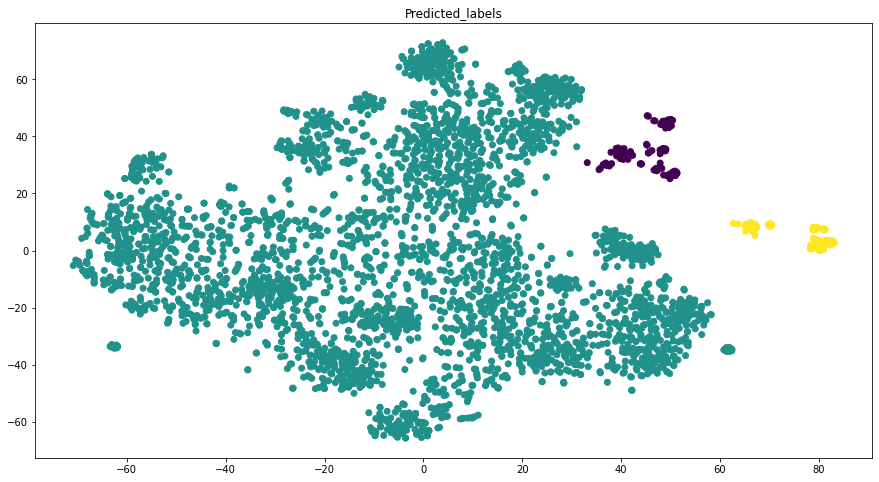

In [ ]:
pred_labels=SpectralClustering(k,affinity='nearest_neighbors',n_neighbors=30,random_state=42).fit(X_bert_tsne).labels_
eval_clustering_2D_nolabels(X_bert_tsne, pred_labels)
printSilhouetteScores(X_bert, pred_labels, X_bert_tsne)

#### TSNE + HDBSCAN

[-1  0  1]
Silhouette score dans l'espace d'origine (distance cosine) :
0.119172625
Silhouette score dans l'espace réduit(distance euclidienne) :
0.16011275


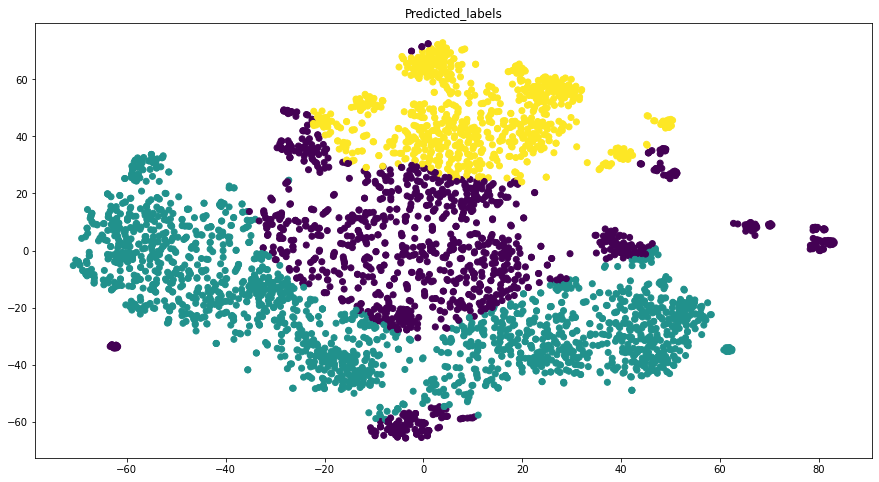

In [ ]:
X_bert_tsne_sc = StandardScaler().fit_transform(X_bert_tsne)
hdbscan_model = hdbscan.HDBSCAN(algorithm= 'best', alpha=1.0, leaf_size=40,min_cluster_size=300, cluster_selection_method='eom', metric='braycurtis').fit(X_bert_tsne_sc)
pred_labels= hdbscan_model.labels_
print(np.unique(pred_labels))
eval_clustering_2D_nolabels(X_bert_tsne, pred_labels)
printSilhouetteScores(X_bert, pred_labels, X_bert_tsne)

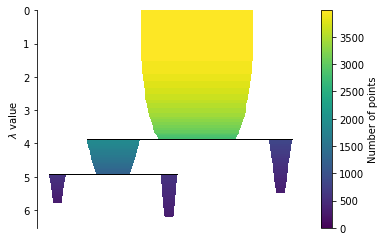

In [ ]:
hdbscan_model.condensed_tree_.plot()

#### TSNE + CAH

Silhouette score dans l'espace d'origine (distance cosine) :
0.12503684
Silhouette score dans l'espace réduit(distance euclidienne) :
0.4062021


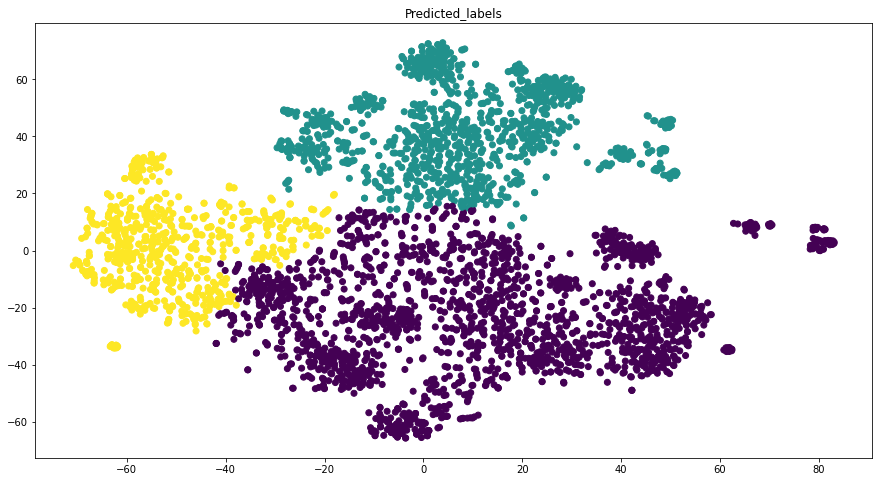

In [ ]:
pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit(X_bert_tsne).labels_
eval_clustering_2D_nolabels(X_bert_tsne, pred_labels)
printSilhouetteScores(X_bert, pred_labels, X_bert_tsne)

TSNE suivi de CAH a donné un bon résultat de clustering (silhouette score = 0.40%) mais le Kmeans sur l'espace réduit TSNE reste meilleur.  

### UMAP

In [ ]:
!pip install umap-learn

In [ ]:
from umap import UMAP

X_bert_umap = UMAP(n_components= 2, random_state=42).fit_transform(X_bert)

#### UMAP + Kmeans 

Silhouette score dans l'espace d'origine (distance cosine) :
0.12833369
Silhouette score dans l'espace réduit(distance euclidienne) :
0.46869573


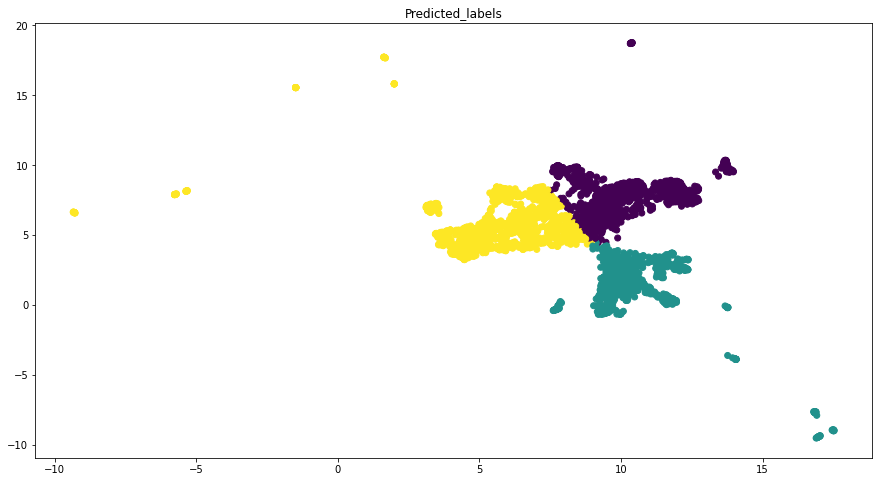

In [ ]:
pred_labels = KMeans(k,random_state=42).fit(X_bert_umap).labels_
eval_clustering_2D_nolabels(X_bert_umap, pred_labels)
printSilhouetteScores(X_bert, pred_labels, X_bert_umap)

On voit qu'avec UMAP, les clusters sont bien distincts les uns des autres dans l'espace réduit.
Le kmeans sur cet espace réduit a donné un score satisfaisant 

#### UMAP + Clustering spectral 

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


Silhouette score dans l'espace d'origine (distance cosine) :
0.17214733
Silhouette score dans l'espace réduit(distance euclidienne) :
0.36777908


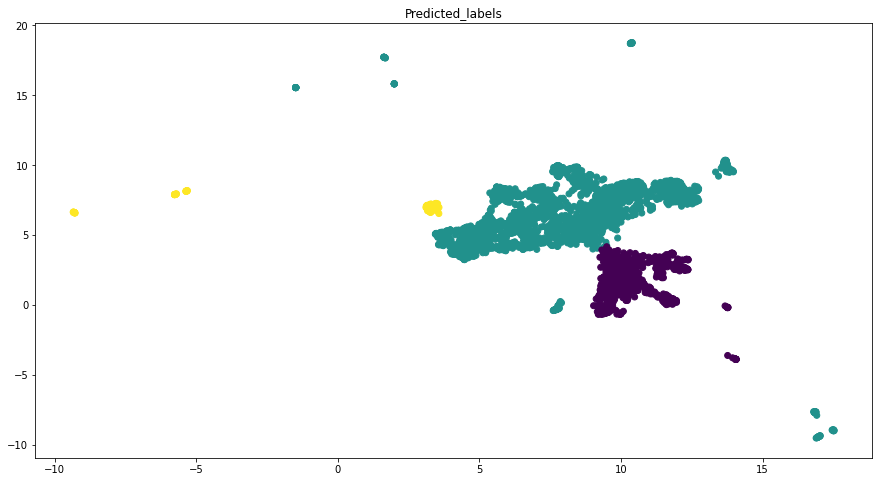

In [ ]:
pred_labels=SpectralClustering(k,affinity='nearest_neighbors',n_neighbors=25,random_state=42).fit(X_bert_umap).labels_
eval_clustering_2D_nolabels(X_bert_umap, pred_labels)
printSilhouetteScores(X_bert, pred_labels, X_bert_umap)

#### UMAP + HDBSCAN

[-1  0  1]
Silhouette score dans l'espace d'origine (distance cosine) :
0.16590755
Silhouette score dans l'espace réduit(distance euclidienne) :
0.37060347


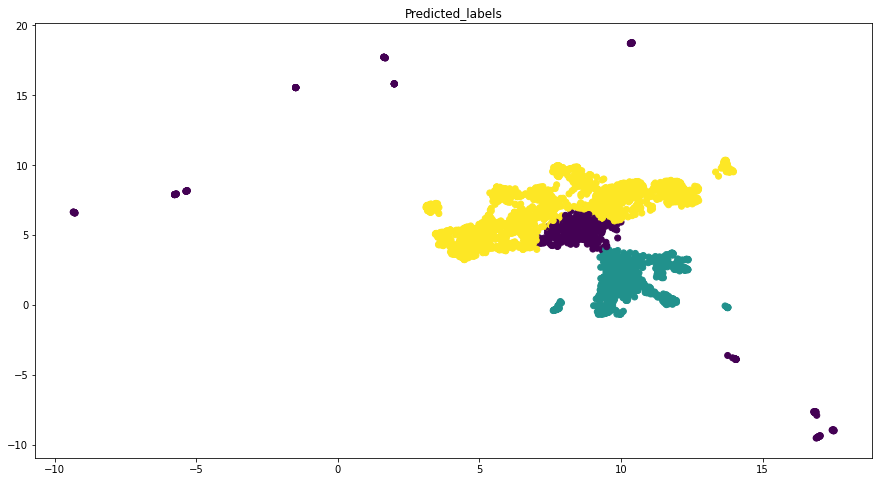

In [ ]:
X_bert_umap_sc = StandardScaler().fit_transform(X_bert_umap)
hdbscan_model = hdbscan.HDBSCAN(algorithm= 'best', alpha=1.0, leaf_size=40,min_cluster_size=250, cluster_selection_method='eom', metric='braycurtis').fit(X_bert_umap_sc)
pred_labels= hdbscan_model.labels_
print(np.unique(pred_labels))
eval_clustering_2D_nolabels(X_bert_umap, pred_labels)
printSilhouetteScores(X_bert, pred_labels, X_bert_umap)

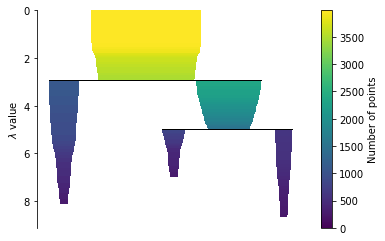

In [ ]:
hdbscan_model.condensed_tree_.plot()

HDBSCAN est meilleur sur la représenation induite par UMAP (contrairement à TSNE et PCA). Silhouette score = 0.37%.  

#### UMAP + CAH

Silhouette score dans l'espace d'origine (distance cosine) :
0.124581754
Silhouette score dans l'espace réduit(distance euclidienne) :
0.43745184


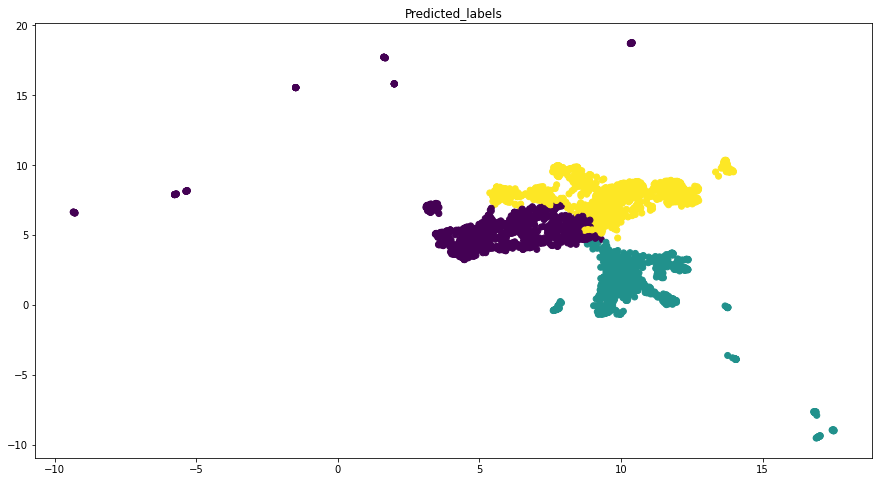

In [ ]:
pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit(X_bert_umap).labels_
eval_clustering_2D_nolabels(X_bert_umap, pred_labels)
printSilhouetteScores(X_bert, pred_labels, X_bert_umap)

La représentation de l'espace réduit en utilisant UMAP donne un résultat très bon en utilisant le modèle Kmeans. 

### Autoencoders

In [ ]:
encoded_X_bert = autoencoder(X_bert,2,seed=42)

100%|██████████| 50/50 [00:09<00:00,  5.35it/s]


#### Kmeans

Silhouette score dans l'espace d'origine (distance cosine) :
0.1840708
Silhouette score dans l'espace réduit(distance euclidienne) :
0.4987143


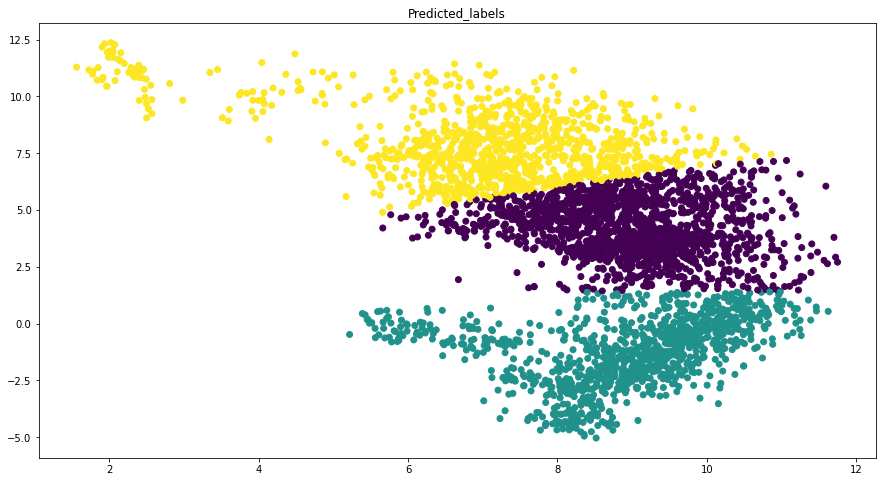

In [ ]:
pred_labels = KMeans(k,random_state=42).fit(encoded_X_bert).labels_
eval_clustering_2D_nolabels(encoded_X_bert, pred_labels)
printSilhouetteScores(X_bert, pred_labels, encoded_X_bert)

L'espace réduit obtenu avec l'autoencoder n'a pas l'air très bon lors de la visualisation 2D, mais le silouette score obtenu après le kmeans atteint les 0.50%.

#### Clustering spectral 

Silhouette score dans l'espace d'origine (distance cosine) :
0.1771479
Silhouette score dans l'espace réduit(distance euclidienne) :
0.4871574


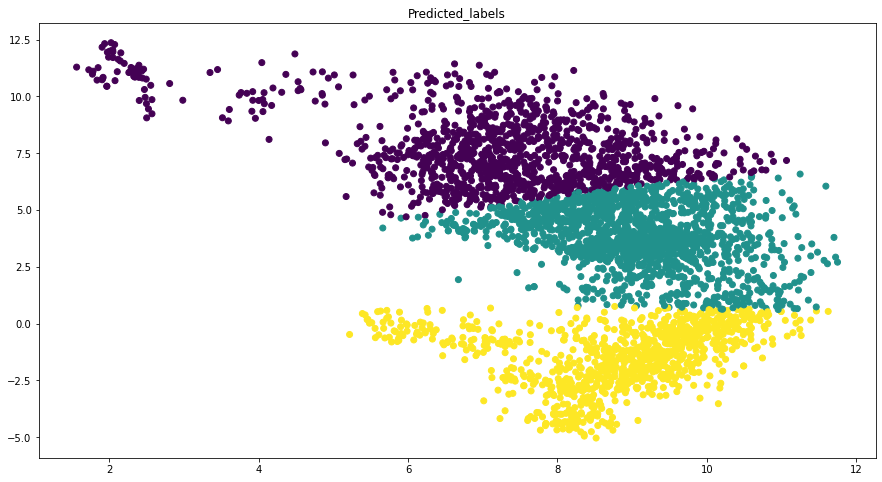

In [ ]:
pred_labels=SpectralClustering(k,affinity='nearest_neighbors',n_neighbors=35,random_state=42).fit(encoded_X_bert).labels_
eval_clustering_2D_nolabels(encoded_X_bert, pred_labels)
printSilhouetteScores(X_bert, pred_labels, encoded_X_bert)

#### HDBSCAN

[-1  0  1]
Silhouette score dans l'espace d'origine (distance cosine) :
0.0867284
Silhouette score dans l'espace réduit(distance euclidienne) :
0.16256288


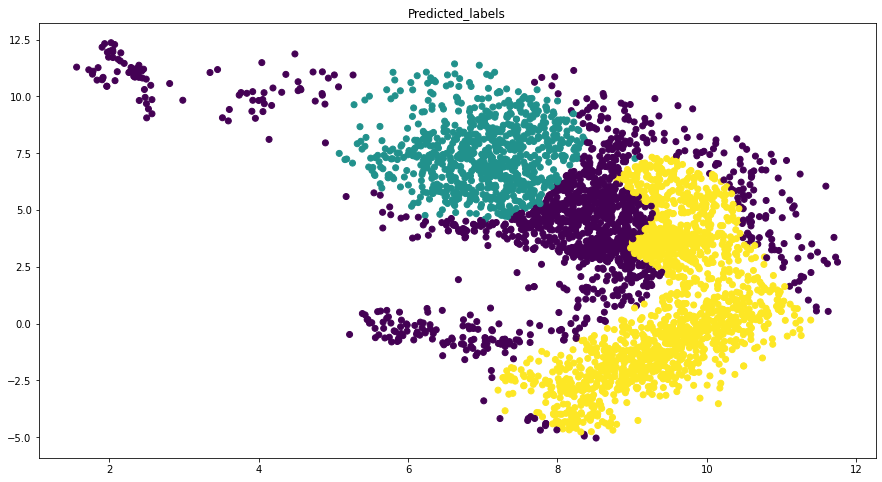

In [ ]:
encoded_X_bert_sc = StandardScaler().fit_transform(encoded_X_bert)
hdbscan_model = hdbscan.HDBSCAN(algorithm= 'best', alpha=1.0, leaf_size=40,min_cluster_size=250, cluster_selection_method='eom', metric='braycurtis').fit(encoded_X_bert_sc)
pred_labels= hdbscan_model.labels_
print(np.unique(pred_labels))
eval_clustering_2D_nolabels(encoded_X_bert, pred_labels)
printSilhouetteScores(X_bert, pred_labels, encoded_X_bert)

HDBSCAN est très mauvais sur l'espace réduit obtenu avec les autoencoder. Ceci est dû à la qualité de l'espace réduit fourni par l'autoencoder

#### CAH

Silhouette score dans l'espace d'origine (distance cosine) :
0.16496304
Silhouette score dans l'espace réduit(distance euclidienne) :
0.46175486


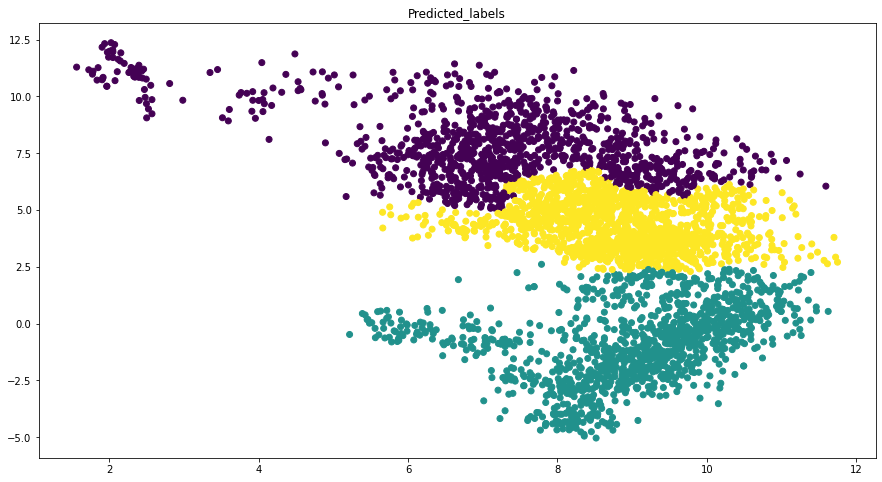

In [ ]:
CAH = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit(encoded_X_bert)
pred_labels= CAH.labels_
eval_clustering_2D_nolabels(encoded_X_bert, pred_labels)
printSilhouetteScores(X_bert, pred_labels, encoded_X_bert)

Kmeans donne de meilleurs résultats de clustering sur tous les espaces réduits. en particulier avec PCA et les autoencoders (0.50% de silhoouette score)  

## Interprétation des clusters (Approches Tandem)

Nous allons choisir comme clusters ceux données par PCA+ Kmeans, puisque c'est la méthode qui a donné le meilleur silouette score.

In [ ]:
pred_labels = KMeans(k,random_state=42).fit(X_bert_reduced).labels_



In [ ]:
# Nettoyage du texte avant le nuage de mots
texts_cleaned = texts.map(lambda t: clean_text(t))


In [ ]:
dic = {'text': texts_cleaned, 'cluster': pred_labels}
df_texts = pd.DataFrame(data=dic)

In [ ]:
df_texts

,text,cluster
0,Eli Manning remains New York Giants quarterbac...,1
1,extra hour exercise week could significantly c...,2
2,AP Boston Red Sox send hobbled star Curt Schil...,1
3,BASEBALL Arizona NL Named Bob Gebhard assistan...,1
4,CFHT Twentyfive year ago September CanadaFranc...,2
...,...,...
3980,GEORGE TOWN Cayman Islands strengthened Hurric...,2
3981,Findcom business search engine wwwfindcom toda...,0
3982,followed Arkansas football last four year know...,1
3983,Loren Woods point careerhigh rebound Vince Car...,1


### **Nuage de mots**

In [ ]:
from wordcloud import WordCloud

# cluster 0
wholeText0 = " ".join(t for t in df_texts.loc[df_texts['cluster'] == 0, 'text'])
wordcloud0 = WordCloud(width=1000, height=600, background_color="white").generate(wholeText0)

# cluster 1
wholeText1 = " ".join(t for t in df_texts.loc[df_texts['cluster'] == 1, 'text'])
wordcloud1 = WordCloud(width=1000, height=600, background_color="white").generate(wholeText1)

# cluster 2
wholeText2 = " ".join(t for t in df_texts.loc[df_texts['cluster'] == 2, 'text'])
wordcloud2 = WordCloud(width=1000, height=600, background_color="white").generate(wholeText2)

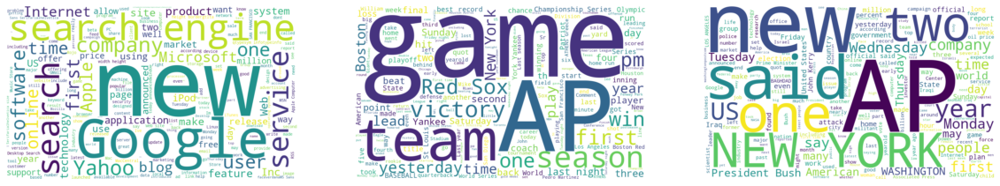

In [ ]:
import matplotlib.pyplot as plt

# Display the generated image:
plt.figure( figsize=(20,20))
plt.subplot(1,3,1)
plt.imshow(wordcloud0, interpolation='bilinear')
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(wordcloud1, interpolation='bilinear')
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(wordcloud2, interpolation='bilinear')
plt.axis("off")
plt.show()

Le premier cluster semple parler d'IT (internet, web, softaware... )
Le deuxième parle de baseball aux USA.
 
Le troisième parle de politique américaine. 


On a donc bien 3 sujets distincts dans nos clusters, ce qui montre que notre clustering a du sens.

## Approches combinées 

### Reduced k-means 

R[write to console]: Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2



  |======================================================================| 100%Silhouette score dans l'espace d'origine (distance cosine) :
0.19632891
Silhouette score dans l'espace réduit(distance euclidienne) :
0.5633655378942642


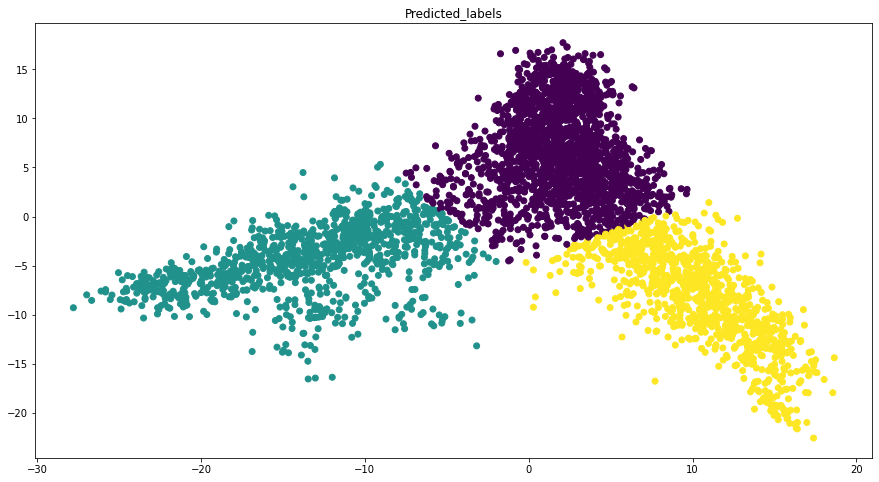

In [ ]:
rkm = fcps.TandemClustering(X_bert,k,Type='Reduced', PlotIt=False,ndim=2,nstart=10)
pred_labels = rkm[0]
reduced_X_bert = rkm[1][0]
eval_clustering_2D_nolabels(reduced_X_bert, pred_labels)
printSilhouetteScores(X_bert, pred_labels, reduced_X_bert)

Reduced KM fourni des meilleurs résultats que ceux obtenus avec l'approche tandem (PCA+Kmeans/ AUtoencoders+Kmeans)
Silhouette score = 0.56%

### Factorial k-means 

  |======================================================================| 100%Silhouette score dans l'espace d'origine (distance cosine) :
0.09431978
Silhouette score dans l'espace réduit(distance euclidienne) :
0.09551447964118503


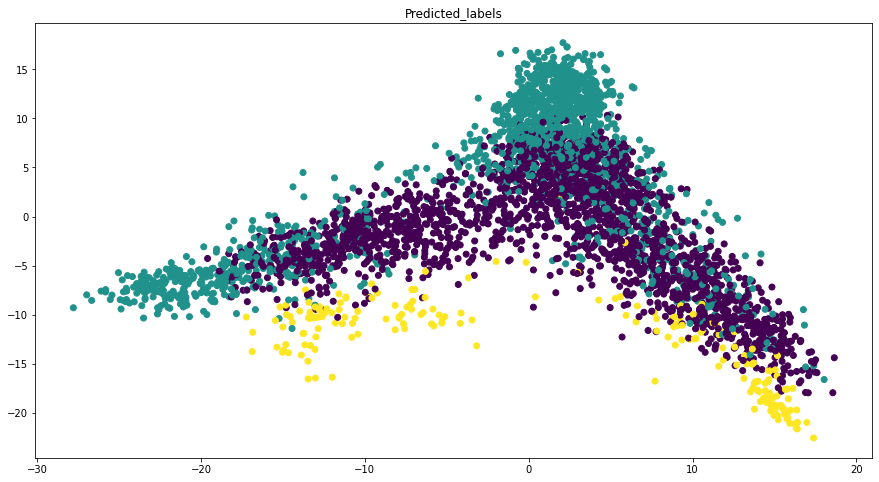

In [ ]:
rkm = fcps.TandemClustering(X_bert,k,Type='Factorial', PlotIt=False,ndim=2,nstart=10)
pred_labels = rkm[0]
Reduced_X_bert = rkm[1][0]
eval_clustering_2D_nolabels(reduced_X_bert, pred_labels)
printSilhouetteScores(X_bert, pred_labels, reduced_X_bert)

Factorial KM n'a pas bien fonctionné sur nos données, en visualisant l'espace réduit obtenu, on voit bien que ce dernier est de très mauvaise qualité

### Deep Clustering Network

In [ ]:
import os
import math
import numpy as np
import tensorflow.compat.v1 as tf
from sklearn.cluster import KMeans
from tqdm import tqdm

"""
  Credits:
    This code is based on the implementation provided by Maziar Moradi Fard and Thibaut Thonet
    Available in: https://github.com/MaziarMF/deep-k-means
"""

TF_FLOAT_TYPE = tf.float32

tf.disable_eager_execution()

def fc_layers(input, specs):
    [dimensions, activations, names] = specs
    for dimension, activation, name in zip(dimensions, activations, names):
        input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)
    return input

def autoencoder(input, specs):
    [dimensions, activations, names] = specs
    mid_ind = int(len(dimensions)/2)

    # Encoder
    embedding = fc_layers(input, [dimensions[:mid_ind], activations[:mid_ind], names[:mid_ind]])
    # Decoder
    output = fc_layers(embedding, [dimensions[mid_ind:], activations[mid_ind:], names[mid_ind:]])

    return embedding, output

def f_func(x, y):
    return tf.reduce_sum(tf.square(x - y), axis=1)

def g_func(x, y):
    return tf.reduce_sum(tf.square(x - y), axis=1)

def next_batch(num, data):
    """
    Return a total of `num` random samples.
    """
    indices = np.arange(0, data.shape[0])
    np.random.shuffle(indices)
    indices = indices[:num]
    batch_data = np.asarray([data[i, :] for i in indices])

    return indices, batch_data


#######################################################
############### Deep Clustering Network ###############
#######################################################

class DcnCompGraph(object):
    """Computation graph for the Deep Clustering Network model proposed in:
        Yang, B., Fu, X., Sidiropoulos, N. D., & Hong, M. (2017). Towards K-means-friendly Spaces: Simultaneous Deep
        Learning and Clustering. In ICML '17 (pp. 3861–3870).
    This implementation is inspired by https://github.com/boyangumn/DCN
    """

    def __init__(self, ae_specs, n_clusters, batch_size, n_samples, val_lambda):
        input_size = ae_specs[0][-1]
        embedding_size = ae_specs[0][int((len(ae_specs[0]) - 1) / 2)]

        # Placeholder tensor for input data
        self.input = tf.placeholder(dtype=TF_FLOAT_TYPE, shape=(batch_size, input_size))

        # Auto-encoder loss computations
        self.embedding, self.output = autoencoder(self.input, ae_specs)  # Get the auto-encoder's embedding and output
        rec_error = g_func(self.input, self.output)  # Reconstruction error based on distance g
        self.ae_loss = tf.reduce_mean(rec_error)

        # Clustering loss computations
        ## Tensor for cluster representatives
        minval_rep, maxval_rep = -1, 1
        self.cluster_rep = tf.Variable(tf.random_uniform([n_clusters, embedding_size],
                                                    minval=minval_rep, maxval=maxval_rep,
                                                    dtype=TF_FLOAT_TYPE), name='cluster_rep', dtype=TF_FLOAT_TYPE)

        ## Clustering assignments for all samples in the dataset
        initial_clustering_assign = tf.random_uniform(minval=0, maxval=n_clusters, dtype=tf.int32, shape=[n_samples])
        self.cluster_assign = tf.Variable(initial_clustering_assign, name='cluster_assign', dtype=tf.int32, trainable=False)

        ## Get the cluster representative corresponding to the cluster of each batch sample
        self.indices = tf.placeholder(dtype=tf.int32, shape=batch_size)  # Placeholder for sample indices in current batch
        batch_clust_rep = []
        for j in range(batch_size):
            k = self.cluster_assign[self.indices[j]]  # Clustering assignment for sample j in batch
            batch_clust_rep.append(self.cluster_rep[k, :])
        stack_batch_clust_rep = tf.stack(batch_clust_rep)

        ## Compute the k-means term
        clustering_error = f_func(self.embedding, stack_batch_clust_rep)

        # Compute the full loss combining the reconstruction error and k-means term
        self.ae_loss = tf.reduce_mean(rec_error)
        self.kmeans_loss = tf.reduce_mean(clustering_error)
        self.loss = self.ae_loss + val_lambda * self.kmeans_loss

        # The optimizer is defined to minimize this loss
        optimizer = tf.train.AdamOptimizer()
        self.pretrain_op = optimizer.minimize(self.ae_loss) # Pretrain the autoencoder before starting DCN
        self.train_op = optimizer.minimize(self.loss)

        # As it has been pointed out in the DCN paper, first the weights of the autoencoder shall be trained then the
        # assignments and cluster representatives. So far in the computation graph we have optimized the weights of the
        # autoencoder, now it's the time for the assignments and representatives.

        # Update the clustering assignments
        for j in range(batch_size):
            # Find which cluster representative is the closest to the current batch sample
            new_assign = tf.argmin(f_func(tf.reshape(self.embedding[j, :], (1, embedding_size)), self.cluster_rep),
                                   output_type=tf.int32)
            # Update the clustering assignment
            self.cluster_assign_update = tf.assign(self.cluster_assign[self.indices[j]], new_assign)

        # Update the cluster representatives
        ## Initialize the value of count
        initial_count = tf.constant(100.0, shape=[n_clusters])
        count = tf.Variable(initial_count, name='count', dtype=TF_FLOAT_TYPE, trainable=False)
        ## Update the cluster representatives according to Equation (8) in the DCN paper
        for j in range(batch_size):
            k = self.cluster_assign[self.indices[j]]  # Clustering assignment for sample j in batch
            self.count_update = tf.assign(count[k], count[k] + 1)  # Updated count for cluster assignments
            new_rep = self.cluster_rep[k] - (1 / count[k]) * (self.cluster_rep[k] - self.embedding[j])
            self.cluster_rep_update = tf.assign(self.cluster_rep[k], new_rep)

def DCN(data, n_clusters, n_components, n_pretrain_epochs=50, n_finetuning_epochs=50, lambda_=1.0, batch_size=256, seed=None, cpu=False):
    # Auto-encoder architecture
    input_size = data.shape[1]
    hidden_1_size = 500
    hidden_2_size = 500
    hidden_3_size = 2000
    embedding_size = n_components
    dimensions = [hidden_1_size, hidden_2_size, hidden_3_size, embedding_size, # Encoder layer dimensions
                  hidden_3_size, hidden_2_size, hidden_1_size, input_size] # Decoder layer dimensions
    activations = [tf.nn.relu, tf.nn.relu, tf.nn.relu, None, # Encoder layer activations
                  tf.nn.relu, tf.nn.relu, tf.nn.relu, None] # Decoder layer activations
    names = ['enc_hidden_1', 'enc_hidden_2', 'enc_hidden_3', 'embedding', # Encoder layer names
            'dec_hidden_1', 'dec_hidden_2', 'dec_hidden_3', 'output'] # Decoder layer names

    n_samples = data.shape[0]
    n_batches = int(math.ceil(n_samples / batch_size)) # Number of mini-batches
    pretrain = True # Specify if DKM's autoencoder should be pretrained

    # Hardware specifications
    if cpu:
        os.environ['CUDA_VISIBLE_DEVICES'] = '-1' # Run on CPU instead of GPU if batch_size is small
    gpu_options = tf.GPUOptions(per_process_gpu_memory_fraction=0.05)

    if seed is not None:
      tf.reset_default_graph()
      tf.set_random_seed(seed)
      np.random.seed(seed)

    cg = DcnCompGraph([dimensions, activations, names], n_clusters, batch_size, n_samples,
                      lambda_)

    # Run the computation graph
    with tf.Session(config=tf.ConfigProto(gpu_options=gpu_options)) as sess:
        # Initialization
        init = tf.global_variables_initializer()
        sess.run(init)

        # Pretrain if specified
        if pretrain:
            print("Starting autoencoder pretraining...")

            # Variables to save pretraining tensor content
            embeddings = np.zeros((n_samples, embedding_size), dtype=float)

            # First, pretrain the autoencoder
            ## Loop over epochs
            for _ in tqdm(range(n_pretrain_epochs)):

                # Loop over the samples
                for _ in range(n_batches):
                    # Fetch a random data batch of the specified size
                    indices_, data_batch = next_batch(batch_size, data)

                    # Run the computation graph until pretrain_op (only on autoencoder) on the data batch
                    _, embedding_, ae_loss_ = sess.run((cg.pretrain_op, cg.embedding, cg.ae_loss),
                                                       feed_dict={cg.input: data_batch})

                    # Save the embeddings for batch samples
                    for j in range(len(indices_)):
                        embeddings[indices_[j], :] = embedding_[j, :]

            # Second, run k-means++ on the pretrained embeddings
            print("Running k-means on the learned embeddings...")
            kmeans_model = KMeans(n_clusters=n_clusters, init="k-means++").fit(embeddings)

            # The cluster centers are used to initialize the cluster representatives in DCN
            sess.run(tf.assign(cg.cluster_rep, kmeans_model.cluster_centers_))

            # The clustering assignments are used to initialize the clustering assignments in DCN
            sess.run(tf.assign(cg.cluster_assign, kmeans_model.labels_))

        # Train the full DCN model
        print("Starting DCN training...")
        ## Loop over epochs
        for epoch in tqdm(range(n_finetuning_epochs)):
            # print("Training step: epoch {}".format(epoch))

            # Loop over the samples
            for _ in range(n_batches):
                # Fetch a random data batch of the specified size
                indices_, data_batch = next_batch(batch_size, data)

                # Run the computation graph on the data batch
                _, _, _, _, loss_, cluster_assign_, ae_loss_, kmeans_loss_ =\
                    sess.run((cg.train_op, cg.cluster_assign_update, cg.count_update, cg.cluster_rep_update, cg.loss,
                              cg.cluster_assign, cg.ae_loss, cg.kmeans_loss),
                             feed_dict={cg.input: data_batch, cg.indices: indices_})
        
        embeddings = np.zeros((n_samples, embedding_size), dtype=float)
        for _ in range(n_batches):
            # Fetch a random data batch of the specified size
            indices_, data_batch = next_batch(batch_size, data)

            # Run the computation graph on the data batch
            _, _, embeddings_, _, _, loss_, cluster_assign_, ae_loss_, kmeans_loss_ =\
                sess.run((cg.train_op, cg.cluster_assign_update, cg.embedding, cg.count_update, cg.cluster_rep_update, cg.loss,
                          cg.cluster_assign, cg.ae_loss, cg.kmeans_loss),
                          feed_dict={cg.input: data_batch, cg.indices: indices_})

            for j in range(len(indices_)):
                embeddings[indices_[j], :] = embeddings_[j, :]
                
    return embeddings, cluster_assign_


#######################################################
##################### Deep K-means ####################
#######################################################

class DkmCompGraph(object):
    """Computation graph for Deep K-Means
    """

    def __init__(self, ae_specs, n_clusters, val_lambda):
        input_size = ae_specs[0][-1]
        embedding_size = ae_specs[0][int((len(ae_specs[0])-1)/2)]

        # Placeholder tensor for input data
        self.input = tf.placeholder(dtype=TF_FLOAT_TYPE, shape=(None, input_size))

        # Auto-encoder loss computations
        self.embedding, self.output = autoencoder(self.input, ae_specs)  # Get the auto-encoder's embedding and output
        rec_error = g_func(self.input, self.output)  # Reconstruction error based on distance g

        # k-Means loss computations
        ## Tensor for cluster representatives
        minval_rep, maxval_rep = -1, 1
        self.cluster_rep = tf.Variable(tf.random_uniform([n_clusters, embedding_size],
                                                    minval=minval_rep, maxval=maxval_rep,
                                                    dtype=TF_FLOAT_TYPE), name='cluster_rep', dtype=TF_FLOAT_TYPE)

        ## First, compute the distance f between the embedding and each cluster representative
        list_dist = []
        for i in range(0, n_clusters):
            dist = f_func(self.embedding, tf.reshape(self.cluster_rep[i, :], (1, embedding_size)))
            list_dist.append(dist)
        self.stack_dist = tf.stack(list_dist)

        ## Second, find the minimum squared distance for softmax normalization
        min_dist = tf.reduce_min(list_dist, axis=0)

        ## Third, compute exponentials shifted with min_dist to avoid underflow (0/0) issues in softmaxes
        self.alpha = tf.placeholder(dtype=TF_FLOAT_TYPE, shape=())  # Placeholder tensor for alpha
        list_exp = []
        for i in range(n_clusters):
            exp = tf.exp(-self.alpha * (self.stack_dist[i] - min_dist))
            list_exp.append(exp)
        stack_exp = tf.stack(list_exp)
        sum_exponentials = tf.reduce_sum(stack_exp, axis=0)

        ## Fourth, compute softmaxes and the embedding/representative distances weighted by softmax
        list_softmax = []
        list_weighted_dist = []
        for j in range(n_clusters):
            softmax = stack_exp[j] / sum_exponentials
            weighted_dist = self.stack_dist[j] * softmax
            list_softmax.append(softmax)
            list_weighted_dist.append(weighted_dist)
        stack_weighted_dist = tf.stack(list_weighted_dist)

        # Compute the full loss combining the reconstruction error and k-means term
        self.ae_loss = tf.reduce_mean(rec_error)
        self.kmeans_loss = tf.reduce_mean(tf.reduce_sum(stack_weighted_dist, axis=0))
        self.loss = self.ae_loss + val_lambda * self.kmeans_loss

        # The optimizer is defined to minimize this loss
        optimizer = tf.train.AdamOptimizer()
        self.pretrain_op = optimizer.minimize(self.ae_loss) # Pretrain the autoencoder before starting DKM
        self.train_op = optimizer.minimize(self.loss) # Train the whole DKM model

def DKM(data, n_clusters, n_components, n_pretrain_epochs=50, n_finetuning_epochs=5, lambda_=1.0, batch_size=256, seed=None, cpu=False):
    """
        The final number of finetuning epochs is n_finetuning_epochs * 20 if pretrain and n_finetuning_epochs * 40 if annealing
    """
    # Auto-encoder architecture
    input_size = data.shape[1]
    hidden_1_size = 500
    hidden_2_size = 500
    hidden_3_size = 2000
    embedding_size = n_components
    dimensions = [hidden_1_size, hidden_2_size, hidden_3_size, embedding_size, # Encoder layer dimensions
                  hidden_3_size, hidden_2_size, hidden_1_size, input_size] # Decoder layer dimensions
    activations = [tf.nn.relu, tf.nn.relu, tf.nn.relu, None, # Encoder layer activations
                  tf.nn.relu, tf.nn.relu, tf.nn.relu, None] # Decoder layer activations
    names = ['enc_hidden_1', 'enc_hidden_2', 'enc_hidden_3', 'embedding', # Encoder layer names
            'dec_hidden_1', 'dec_hidden_2', 'dec_hidden_3', 'output'] # Decoder layer names

    n_samples = data.shape[0]
    n_batches = int(math.ceil(n_samples / batch_size)) # Number of mini-batches
    pretrain = True # Specify if DKM's autoencoder should be pretrained
    annealing = False # Specify if annealing should be used

    # Define the alpha scheme depending on if the approach includes annealing/pretraining
    if annealing and not pretrain:
        constant_value = 1  # specs.embedding_size # Used to modify the range of the alpha scheme
        max_n = 40  # Number of alpha values to consider
        alphas = np.zeros(max_n, dtype=float)
        alphas[0] = 0.1
        for i in range(1, max_n):
            alphas[i] = (2 ** (1 / (np.log(i + 1)) ** 2)) * alphas[i - 1]
        alphas = alphas / constant_value
    elif not annealing and pretrain:
        constant_value = 1  # specs.embedding_size # Used to modify the range of the alpha scheme
        max_n = 20  # Number of alpha values to consider (constant values are used here)
        alphas = 1000*np.ones(max_n, dtype=float) # alpha is constant
        alphas = alphas / constant_value
    else:
        raise Exception("Run with either annealing (-a) or pretraining (-p), but not both.")

    # Hardware specifications
    if cpu:
        os.environ['CUDA_VISIBLE_DEVICES'] = '-1' # Run on CPU instead of GPU if batch_size is small

    gpu_options = tf.GPUOptions(per_process_gpu_memory_fraction=0.05)
    config = tf.ConfigProto(gpu_options=gpu_options)

    if seed is not None:
      tf.reset_default_graph()
      tf.set_random_seed(seed)
      np.random.seed(seed)
      
    # Define the computation graph for DKM
    cg = DkmCompGraph([dimensions, activations, names], n_clusters, lambda_)

    # Run the computation graph
    with tf.Session(config=config) as sess:
        # Initialization
        init = tf.global_variables_initializer()
        sess.run(init)

        # Variables to save tensor content
        distances = np.zeros((n_clusters, n_samples))

        # Pretrain if specified
        if pretrain:
            print("Starting autoencoder pretraining...")

            # Variables to save pretraining tensor content
            embeddings = np.zeros((n_samples, embedding_size), dtype=float)

            # First, pretrain the autoencoder
            ## Loop over epochs
            for _ in tqdm(range(n_pretrain_epochs)):
                # Loop over the samples
                for _ in range(n_batches):
                    # Fetch a random data batch of the specified size
                    indices, data_batch = next_batch(batch_size, data)

                    # Run the computation graph until pretrain_op (only on autoencoder) on the data batch
                    _, embedding_, ae_loss_ = sess.run((cg.pretrain_op, cg.embedding, cg.ae_loss),
                                                        feed_dict={cg.input: data_batch})

                    # Save the embeddings for batch samples
                    for j in range(len(indices)):
                        embeddings[indices[j], :] = embedding_[j, :]

            # Second, run k-means++ on the pretrained embeddings
            print("Running k-means on the learned embeddings...")
            kmeans_model = KMeans(n_clusters=n_clusters, init="k-means++").fit(embeddings)

            # The cluster centers are used to initialize the cluster representatives in DKM
            sess.run(tf.assign(cg.cluster_rep, kmeans_model.cluster_centers_))

        # Train the full DKM model
        if (len(alphas) > 0):
            print("Starting DKM training...")
        ## Loop over alpha (inverse temperature), from small to large values
        for k in tqdm(range(len(alphas))):
            # Loop over epochs per alpha
            for _ in range(n_finetuning_epochs):
                # Loop over the samples
                for _ in range(n_batches):
                    # Fetch a random data batch of the specified size
                    indices, data_batch = next_batch(batch_size, data)

                    # Run the computation graph on the data batch
                    _, loss_, stack_dist_, cluster_rep_, ae_loss_, kmeans_loss_ =\
                        sess.run((cg.train_op, cg.loss, cg.stack_dist, cg.cluster_rep, cg.ae_loss, cg.kmeans_loss),
                                  feed_dict={cg.input: data_batch, cg.alpha: alphas[k]})

                    # Save the distances for batch samples
                    for j in range(len(indices)):
                        distances[:, indices[j]] = stack_dist_[:, j]

        _, loss_, X_reduced, stack_dist_, cluster_rep_, ae_loss_, kmeans_loss_ =\
        sess.run((cg.train_op, cg.loss, cg.embedding, cg.stack_dist, cg.cluster_rep, cg.ae_loss, cg.kmeans_loss),
                  feed_dict={cg.input: data, cg.alpha: alphas[k]})

        distances = stack_dist_

        # Infer cluster assignments for all samples
        cluster_assign = np.zeros((n_samples), dtype=float)
        for i in range(n_samples):
            index_closest_cluster = np.argmin(distances[:, i])
            cluster_assign[i] = index_closest_cluster
        cluster_assign = cluster_assign.astype(np.int64)

    return X_reduced, cluster_assign

In [ ]:
embeddings, cluster_assign_ = DCN(X_bert, n_clusters=k,n_components=2)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:21: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
/usr/local/lib/python3.7/dist-packages/keras/legacy_tf_layers/core.py:255: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  return layer.apply(inputs)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:08<00:00,  6.15it/s]


Running k-means on the learned embeddings...
Starting DCN training...


100%|██████████| 50/50 [00:27<00:00,  1.81it/s]


Silhouette score dans l'espace d'origine (distance cosine) :
0.13115577
Silhouette score dans l'espace réduit(distance euclidienne) :
0.2333572012521671


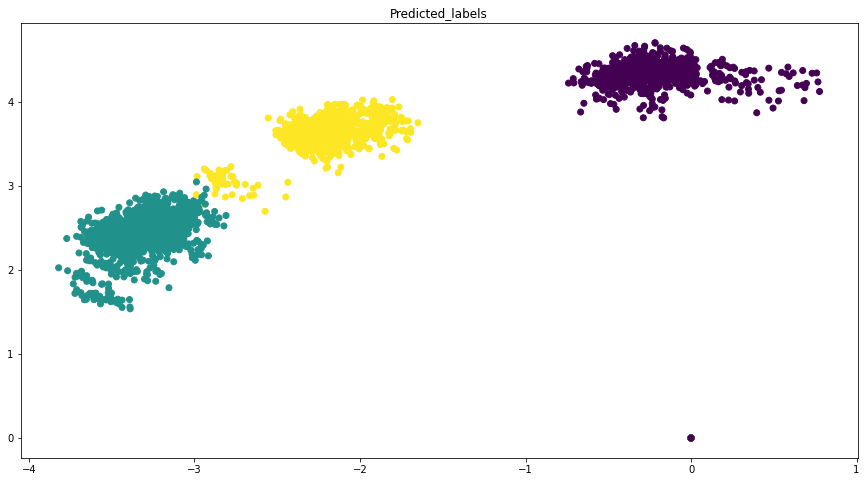

In [ ]:
eval_clustering_2D_nolabels(embeddings, cluster_assign_)
printSilhouetteScores(X_bert, cluster_assign_, embeddings)

### Deep k-means

In [ ]:
tf.reset_default_graph()

In [ ]:
X_reduced, cluster_assign = DKM(X_bert,n_clusters=k,n_components=2)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:21: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
/usr/local/lib/python3.7/dist-packages/keras/legacy_tf_layers/core.py:255: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  return layer.apply(inputs)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:06<00:00,  7.19it/s]


Running k-means on the learned embeddings...
Starting DKM training...


100%|██████████| 20/20 [00:16<00:00,  1.18it/s]


Silhouette score dans l'espace d'origine (distance cosine) :
0.13115577
Silhouette score dans l'espace réduit(distance euclidienne) :
0.2333572012521671


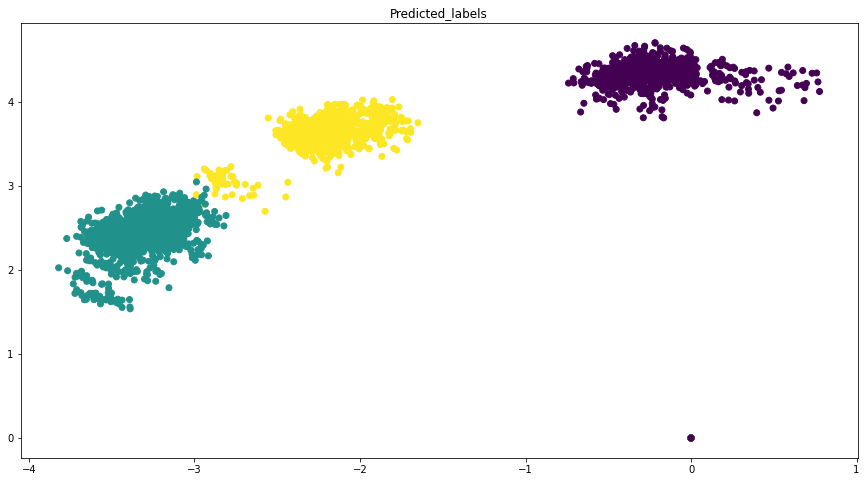

In [ ]:
eval_clustering_2D_nolabels(embeddings, cluster_assign_)
printSilhouetteScores(X_bert, cluster_assign_, embeddings)

## Interprétation des clusters

Nous allons choisir comme clusters ceux donnés par Reduced Kmeans, puisque c'est la méthode qui donnait les meilleurs scores

In [ ]:
rkm = fcps.TandemClustering(X_bert,k,Type='Reduced', PlotIt=False,ndim=2,nstart=10)
pred_labels = rkm[0]
reduced_X_bert = rkm[1][0]


  |======================================================================| 100%

In [ ]:
# Nettoyage du texte avant le nuage de mots
texts_cleaned = texts.map(lambda t: clean_text(t))


In [ ]:
dic = {'text': texts_cleaned, 'cluster': pred_labels}
df_texts = pd.DataFrame(data=dic)

In [ ]:
df_texts

,text,cluster
0,Eli Manning remains New York Giants quarterbac...,2
1,extra hour exercise week could significantly c...,1
2,AP Boston Red Sox send hobbled star Curt Schil...,2
3,BASEBALL Arizona NL Named Bob Gebhard assistan...,2
4,CFHT Twentyfive year ago September CanadaFranc...,1
...,...,...
3980,GEORGE TOWN Cayman Islands strengthened Hurric...,1
3981,Findcom business search engine wwwfindcom toda...,3
3982,followed Arkansas football last four year know...,2
3983,Loren Woods point careerhigh rebound Vince Car...,2


### **Nuage de mots**

In [ ]:
from wordcloud import WordCloud

# cluster 0
wholeText0 = " ".join(t for t in df_texts.loc[df_texts['cluster'] == 1, 'text'])
wordcloud0 = WordCloud(width=1000, height=600, background_color="white").generate(wholeText0)

# cluster 1
wholeText1 = " ".join(t for t in df_texts.loc[df_texts['cluster'] == 2, 'text'])
wordcloud1 = WordCloud(width=1000, height=600, background_color="white").generate(wholeText1)

# cluster 2
wholeText2 = " ".join(t for t in df_texts.loc[df_texts['cluster'] == 3, 'text'])
wordcloud2 = WordCloud(width=1000, height=600, background_color="white").generate(wholeText2)

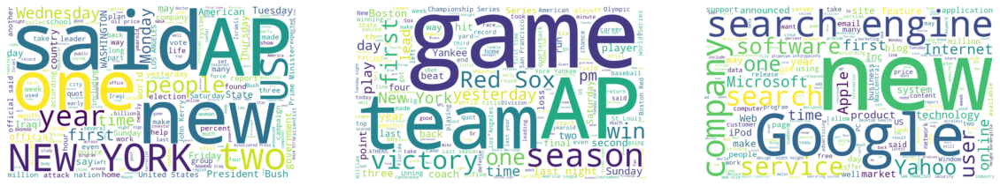

In [ ]:
import matplotlib.pyplot as plt

# Display the generated image:
plt.figure( figsize=(20,20))
plt.subplot(1,3,1)
plt.imshow(wordcloud0, interpolation='bilinear')
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(wordcloud1, interpolation='bilinear')
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(wordcloud2, interpolation='bilinear')
plt.axis("off")
plt.show()

Le premier cluster parle de politique américaine.

Le deuxième parle d'équipes de baseball aux USA.

Le troisième parle d'IT.

On a donc bien 3 sujets distincts dans nos clusters, ce qui montre que notre clustering a du sens.

#Roberta

In [ ]:
from transformers import RobertaModel, RobertaTokenizer
from torch.utils.data import DataLoader
import torch

In [ ]:
if torch.cuda.is_available():
  device = 'cuda'
else:
  device = 'cpu'

In [ ]:
device

'cpu'

In [ ]:
model_name = 'roberta-base'
model_rob = RobertaModel.from_pretrained(model_name, output_hidden_states=True)
tokenizer_rob = RobertaTokenizer.from_pretrained(model_name)

Downloading:   0%|          | 0.00/481 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/478M [00:00<?, ?B/s]

Some weights of the model checkpoint at roberta-base were not used when initializing RobertaModel: ['lm_head.layer_norm.bias', 'lm_head.dense.bias', 'lm_head.decoder.weight', 'lm_head.dense.weight', 'lm_head.bias', 'lm_head.layer_norm.weight']
- This IS expected if you are initializing RobertaModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


Downloading:   0%|          | 0.00/878k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/446k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.29M [00:00<?, ?B/s]

In [ ]:
if device == 'cuda':
  model_rob.cuda()

In [ ]:
roberta_embeddings = encode_sentences_batch(model_rob, tokenizer_rob, texts, batch_size=32)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [ ]:
roberta_embeddings[11].shape

(3985, 768)

In [ ]:
X_rob = np.array(roberta_embeddings).mean(axis=0)

X_rob.shape

(3985, 768)

## Détermination du nombre de clusters

In [ ]:
def findBestKWithKMeans(X):

  sum_of_squared_distances = []
  K = range(1,10)
  for k in K:
      k_means = KMeans(n_clusters=k, random_state=42, n_init=10)
      model = k_means.fit(X)
      sum_of_squared_distances.append(k_means.inertia_)

  plt.plot(K, sum_of_squared_distances, 'bx-')
  plt.xlabel('k')
  plt.ylabel('sum_of_squared_distances')
  plt.title('elbow method for optimal k')
  plt.show()

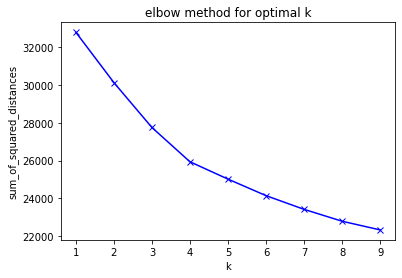

In [ ]:
findBestKWithKMeans(X_rob)

La méthode du coude avec KMeans sur l'espace d'origine nous donne un K optimal plutôt à 4

In [ ]:
# Dendogram for Hierarchical Clustering
import scipy.cluster.hierarchy as shc


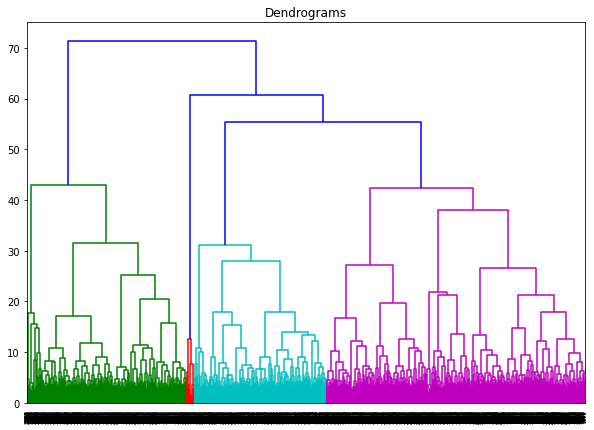

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 7))  
plt.title("Dendrograms")  
dend = shc.dendrogram(shc.linkage(X_rob, method='ward'))

Le dendrogramme nous affiche 4 clusters, mais l'un a visiblement très peu de points à l'intérieur, à tel point qu'il peut être intéressant de le négliger.

In [ ]:
!pip install umap-learn

     |████████████████████████████████| 86 kB 2.9 MB/s 
     |████████████████████████████████| 1.1 MB 30.0 MB/s 
  Created wheel for umap-learn: filename=umap_learn-0.5.2-py3-none-any.whl size=82709 sha256=0019365e188cef074bd21086c7c720bbcfead57e92bd61081389f58090ffa4af
  Stored in directory: /root/.cache/pip/wheels/84/1b/c6/aaf68a748122632967cef4dffef68224eb16798b6793257d82
  Created wheel for pynndescent: filename=pynndescent-0.5.5-py3-none-any.whl size=52603 sha256=d0ca062ff62092b31a1e7fb29c229758b7e88228b8899b898cbe11c6eb2e8dce
  Stored in directory: /root/.cache/pip/wheels/af/e9/33/04db1436df0757c42fda8ea6796d7a8586e23c85fac355f476
Successfully built umap-learn pynndescent


Nous avons vu sur les dataset supervisés que UMAP et TSNE étaient les plus efficaces pour obtenir un espace réduit intéressant à partir d'un embedding ROBERTA. En appliquant la méthode du coude sur ces espaces réduits, nous allons voir si le k optimal optenu ainsi est cohérent avec ce qu'on a sur l'espace d'origine.

In [ ]:
from umap import UMAP

X_rob_umap = UMAP(n_components=2, random_state=42).fit_transform(X_rob)

/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)


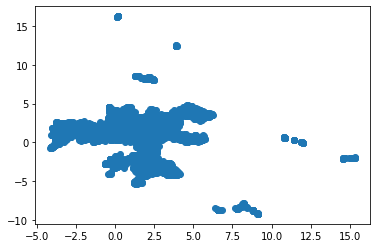

In [ ]:
plt.scatter(x = X_rob_umap[:, 0], y = X_rob_umap[:, 1])

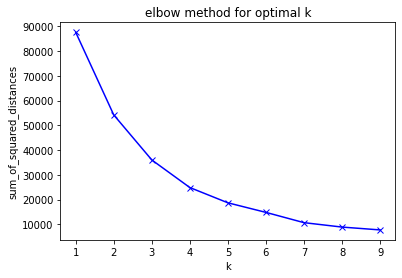

In [ ]:
findBestKWithKMeans(X_rob_umap)

Avec UMAP, le coude n'est pas évident, cela pourrait être 3 ou 4.

In [ ]:
from sklearn.manifold import TSNE
X_rob_tsne = TSNE(n_components=2, random_state=42).fit_transform(X_rob)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


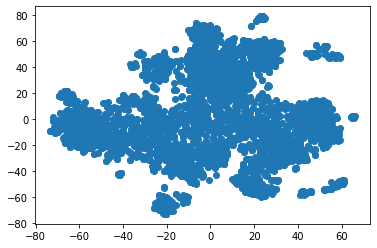

In [ ]:
plt.scatter(x = X_rob_tsne[:, 0], y = X_rob_tsne[:, 1])

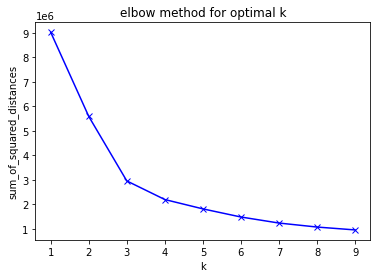

In [ ]:
findBestKWithKMeans(X_rob_tsne)

Avec TSNE, le coude est bien visible à K = 3

Au vu de tous les résultats précédents, nous choisissons K = 3, la valeur qui fait à peu près consensus.

In [ ]:
k = 3

## Clustering dans l'espace d'origine

### KMeans

In [ ]:
pred_labels = KMeans(k,random_state=42).fit(X_rob).labels_
printSilhouetteScores(X_rob, pred_labels)


Silhouette score dans l'espace d'origine (distance cosine) :
0.17306516


### Spectral Clustering

In [ ]:
pred_labels=SpectralClustering(k,affinity='nearest_neighbors',n_neighbors=25,random_state=42).fit(X_rob).labels_
printSilhouetteScores(X_rob, pred_labels)

Silhouette score dans l'espace d'origine (distance cosine) :
0.42649516


Le spectral clustering nous donne de bons résultats dans l'espace d'origine

### HDBSCAN

In [ ]:
X_rob_sc = StandardScaler().fit_transform(X_rob)
hdbscan_model = hdbscan.HDBSCAN(algorithm= 'best', alpha=1.0, leaf_size=40,min_cluster_size=200, cluster_selection_method='eom', metric='braycurtis').fit(X_rob_sc)
pred_labels= hdbscan_model.labels_
printSilhouetteScores(X_rob, pred_labels)

Silhouette score dans l'espace d'origine (distance cosine) :
0.029766431


### CAH

In [ ]:
from sklearn.cluster import AgglomerativeClustering

pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit(X_rob).labels_
printSilhouetteScores(X_rob, pred_labels)

Silhouette score dans l'espace d'origine (distance cosine) :
0.17644103


## Approches Tandem

Sur les jeux de données labellisés, la PCA avait donné de très mauvais résultats avec ROBERTA. Nous ne l'utiliserons donc pas ici.

### UMAP

In [ ]:
from umap import UMAP

X_rob_umap = UMAP(n_components= 2, random_state=42).fit_transform(X_rob)

#### UMAP + KMeans

Silhouette score dans l'espace d'origine (distance cosine) :
0.12717675
Silhouette score dans l'espace réduit(distance euclidienne) :
0.46143106


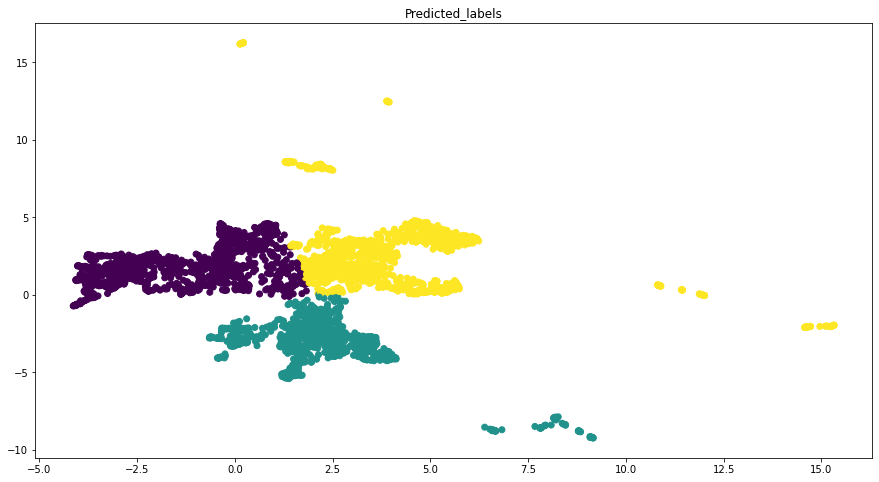

In [ ]:
pred_labels = KMeans(3,random_state=42).fit(X_rob_umap).labels_
eval_clustering_2D_nolabels(X_rob_umap, pred_labels)
printSilhouetteScores(X_rob, pred_labels, X_rob_umap)

On retrouve dans l'espace réduit de TSNE ces outliers qu'on avait vu dans dendrogramme.

#### UMAP + Spectral Clustering

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


Silhouette score dans l'espace d'origine (distance cosine) :
0.044624686
Silhouette score dans l'espace réduit(distance euclidienne) :
0.3197045


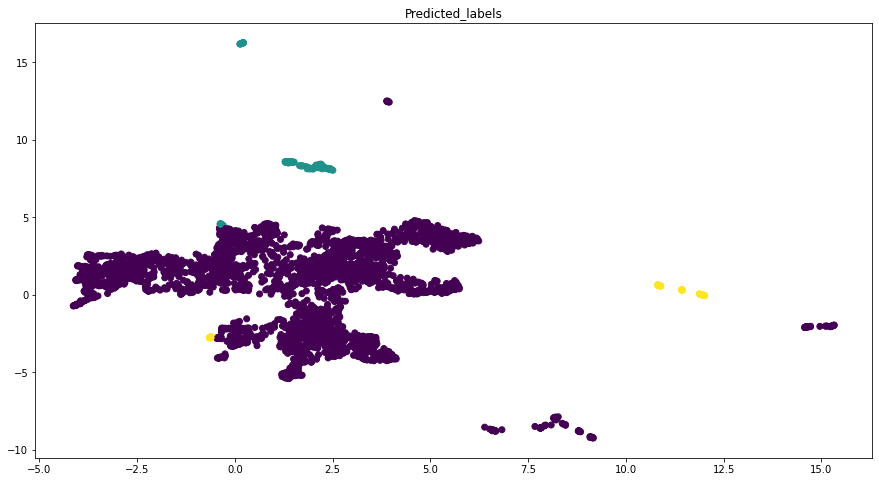

In [ ]:
pred_labels=SpectralClustering(k,affinity='nearest_neighbors',n_neighbors=10,random_state=42).fit(X_rob_umap).labels_
eval_clustering_2D_nolabels(X_rob_umap, pred_labels)
printSilhouetteScores(X_rob, pred_labels, X_rob_umap)

Spectral Clustering a été perturbé par les outliers et a quasiment tout assigné au même cluster.

#### UMAP + HDBSCAN

Silhouette score dans l'espace d'origine (distance cosine) :
0.10411273
Silhouette score dans l'espace réduit(distance euclidienne) :
0.3363418


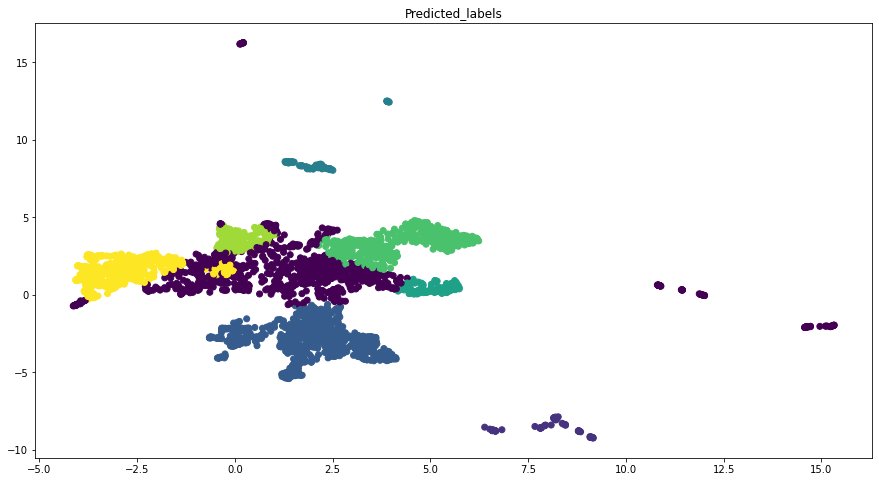

In [ ]:
X_rob_sc = StandardScaler().fit_transform(X_rob_umap)
hdbscan_model = hdbscan.HDBSCAN(algorithm= 'best', alpha=1.0, leaf_size=40,min_cluster_size=100, cluster_selection_method='eom', metric='braycurtis').fit(X_rob_sc)
pred_labels= hdbscan_model.labels_
eval_clustering_2D_nolabels(X_rob_umap, pred_labels)
printSilhouetteScores(X_rob, pred_labels, X_rob_umap)

#### UMAP + CAH

Silhouette score dans l'espace d'origine (distance cosine) :
0.09750876
Silhouette score dans l'espace réduit(distance euclidienne) :
0.44170618


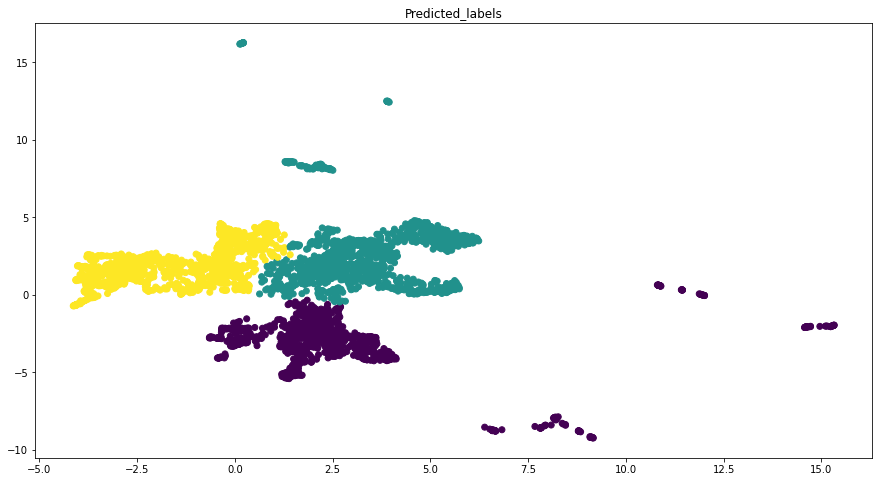

In [ ]:
pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit(X_rob_umap).labels_
eval_clustering_2D_nolabels(X_rob_umap, pred_labels)
printSilhouetteScores(X_rob, pred_labels, X_rob_umap)

### TSNE

#### TSNE + KMeans

In [ ]:
from sklearn.manifold import TSNE
X_rob_tsne = TSNE(n_components=2, random_state=42).fit_transform(X_rob)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


Silhouette score dans l'espace d'origine (distance cosine) :
0.13425305
Silhouette score dans l'espace réduit(distance euclidienne) :
0.4565902


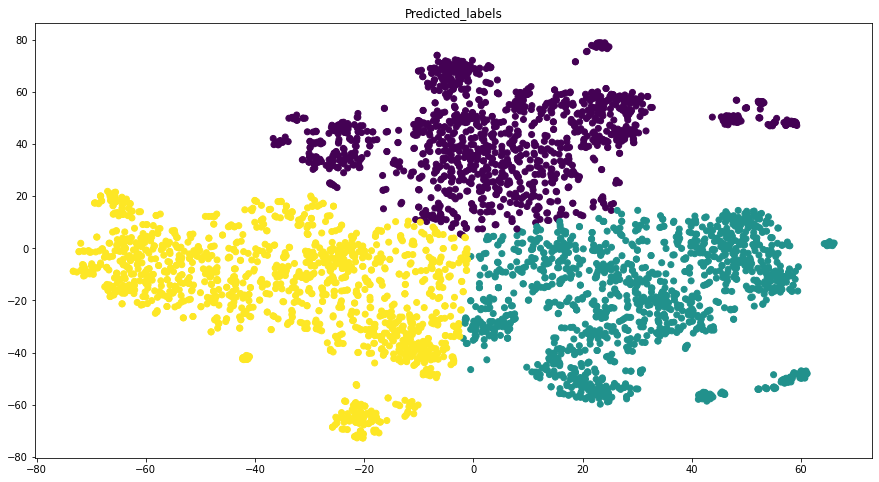

In [ ]:
pred_labels = KMeans(k,random_state=42).fit(X_rob_tsne).labels_
eval_clustering_2D_nolabels(X_rob_tsne, pred_labels)
printSilhouetteScores(X_rob, pred_labels, X_rob_tsne)

Les outliers sont moins visibles avec TSNE qu'avec UMAP

#### TSNE + Spectral Clustering

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


Silhouette score dans l'espace d'origine (distance cosine) :
0.18762177
Silhouette score dans l'espace réduit(distance euclidienne) :
0.10890877


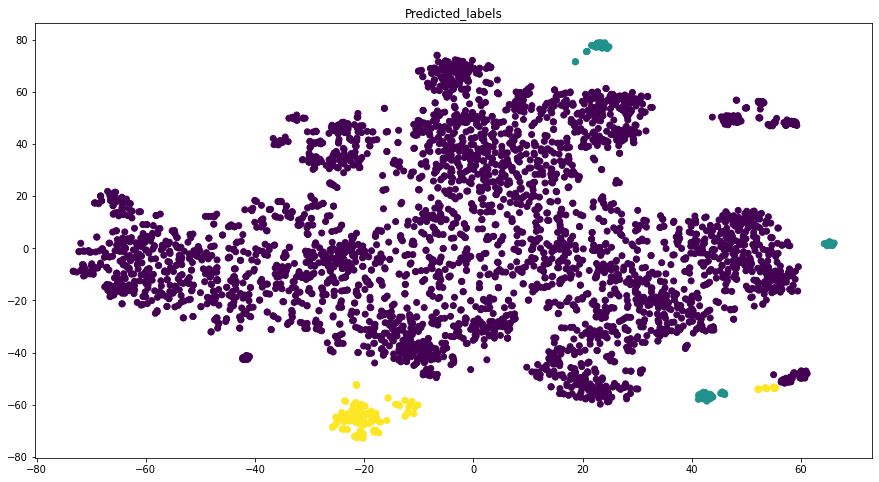

In [ ]:
pred_labels=SpectralClustering(k,affinity='nearest_neighbors',n_neighbors=10,random_state=42).fit(X_rob_tsne).labels_
eval_clustering_2D_nolabels(X_rob_tsne, pred_labels)
printSilhouetteScores(X_rob, pred_labels, X_rob_tsne)

Les différents îlots ont perturbé Spectral Clustering.

#### TSNE + HDBSCAN

Silhouette score dans l'espace d'origine (distance cosine) :
0.096152365
Silhouette score dans l'espace réduit(distance euclidienne) :
0.2898488


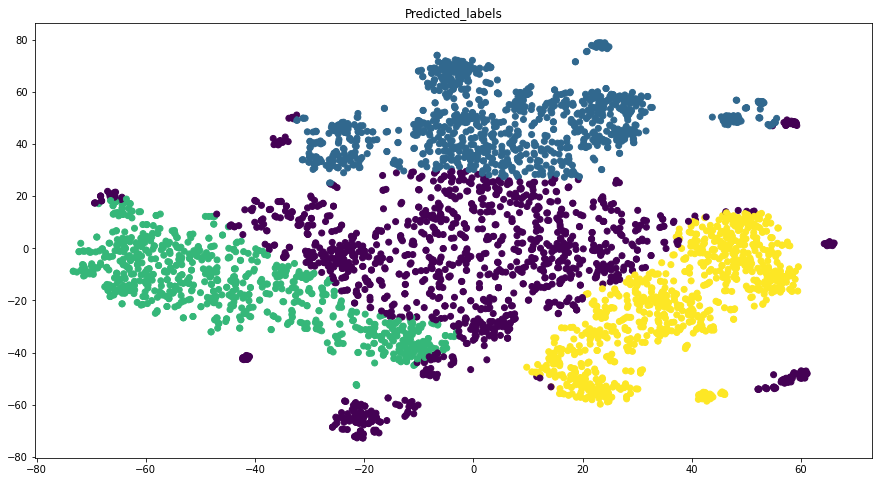

In [ ]:
X_rob_sc = StandardScaler().fit_transform(X_rob_tsne)
hdbscan_model = hdbscan.HDBSCAN(algorithm= 'best', alpha=1.0, leaf_size=40,min_cluster_size=200, cluster_selection_method='eom', metric='braycurtis').fit(X_rob_sc)
pred_labels= hdbscan_model.labels_
eval_clustering_2D_nolabels(X_rob_tsne, pred_labels)
printSilhouetteScores(X_rob, pred_labels, X_rob_tsne)

#### TSNE + CAH

Silhouette score dans l'espace d'origine (distance cosine) :
0.14015329
Silhouette score dans l'espace réduit(distance euclidienne) :
0.43184152


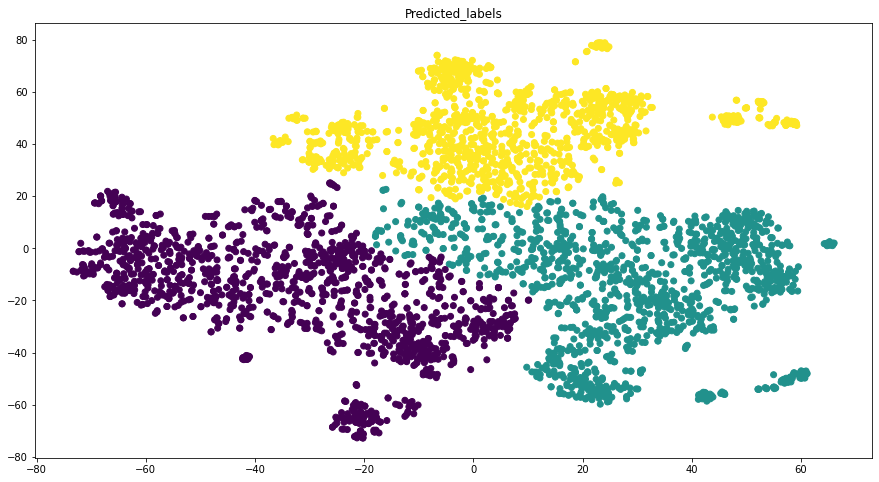

In [ ]:
pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit(X_rob_tsne).labels_
eval_clustering_2D_nolabels(X_rob_tsne, pred_labels)
printSilhouetteScores(X_rob, pred_labels, X_rob_tsne)

### Autoencoders

In [ ]:
X_rob_autoenc = autoencoder(X_rob,2,seed=42)

100%|██████████| 50/50 [00:17<00:00,  2.86it/s]


#### Kmeans

Silhouette score dans l'espace d'origine (distance cosine) :
0.15369244
Silhouette score dans l'espace réduit(distance euclidienne) :
0.5592664


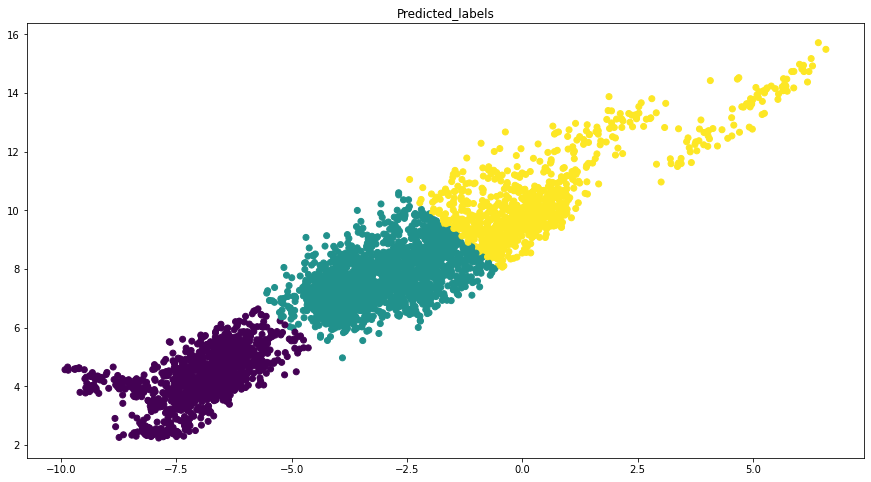

In [ ]:
pred_labels = KMeans(k,random_state=42).fit(X_rob_autoenc).labels_
eval_clustering_2D_nolabels(X_rob_autoenc, pred_labels)
printSilhouetteScores(X_rob, pred_labels, X_rob_autoenc)

Résultat assez intéressant, l'espace réduit obtenu par l'autoencoder forme une ligne. Les scores de silhouette sont très bons.

#### Clustering spectral 

Silhouette score dans l'espace d'origine (distance cosine) :
0.15116757
Silhouette score dans l'espace réduit(distance euclidienne) :
0.5561708


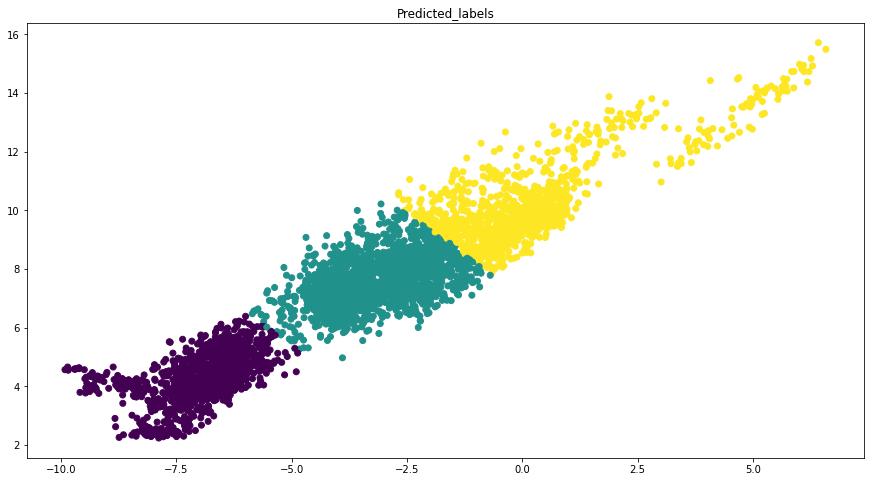

In [ ]:
pred_labels=SpectralClustering(k,affinity='nearest_neighbors',n_neighbors=30,random_state=42).fit(X_rob_autoenc).labels_
eval_clustering_2D_nolabels(X_rob_autoenc, pred_labels)
printSilhouetteScores(X_rob, pred_labels, X_rob_autoenc)

On obtient un clustering très similaire à celui de KMeans

#### HDBSCAN

Silhouette score dans l'espace d'origine (distance cosine) :
0.041802403
Silhouette score dans l'espace réduit(distance euclidienne) :
0.27037072


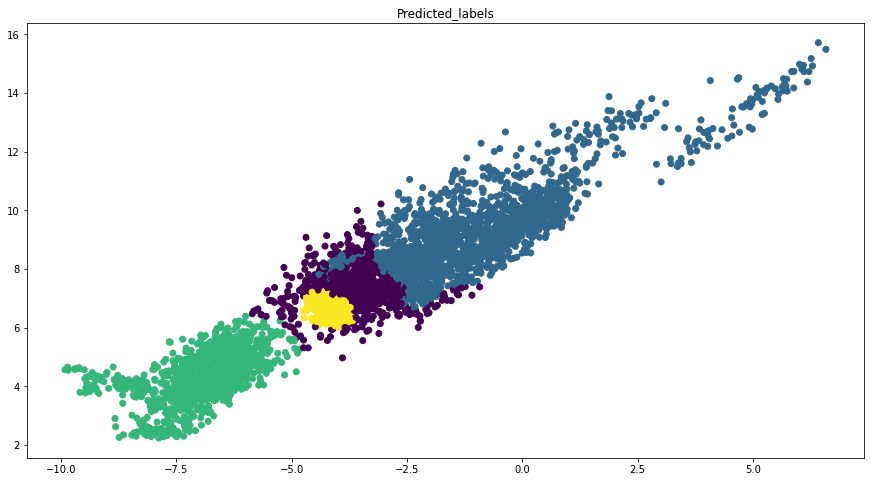

In [ ]:
X_rob_autoenc_sc = StandardScaler().fit_transform(X_rob_autoenc)
hdbscan_model = hdbscan.HDBSCAN(algorithm= 'best', alpha=1.0, leaf_size=40,min_cluster_size=50, cluster_selection_method='eom', metric='braycurtis').fit(X_rob_autoenc_sc)
pred_labels= hdbscan_model.labels_
eval_clustering_2D_nolabels(X_rob_autoenc, pred_labels)
printSilhouetteScores(X_rob, pred_labels, X_rob_autoenc)

HDBSCAN trouve 4 clusters là où on en voulait que 3.

#### CAH

Silhouette score dans l'espace d'origine (distance cosine) :
0.14633597
Silhouette score dans l'espace réduit(distance euclidienne) :
0.5370431


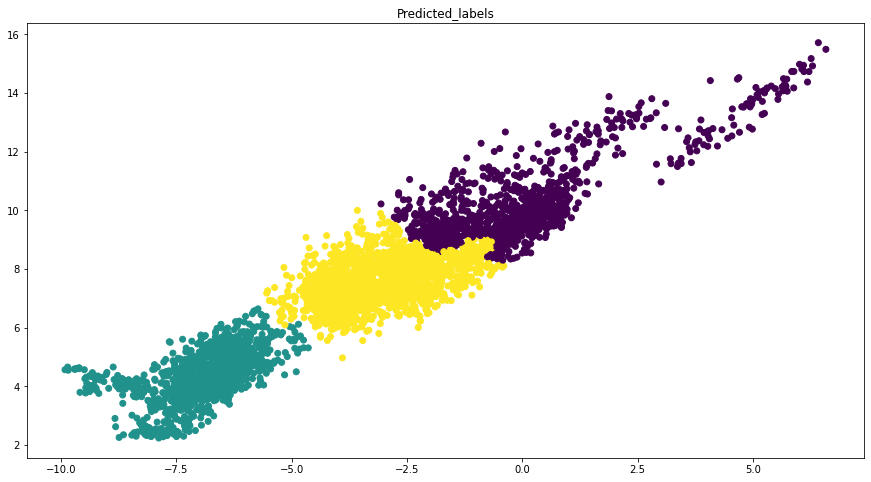

In [ ]:
from sklearn.cluster import AgglomerativeClustering

CAH = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit(X_rob_autoenc)
pred_labels= CAH.labels_
eval_clustering_2D_nolabels(X_rob_autoenc, pred_labels)
printSilhouetteScores(X_rob, pred_labels, X_rob_autoenc)

Là encore, résultat similaire à KMeans et spectral clustering

### Interprétation des clusters (approche Tandem)

Nous allons choisir comme clusters ceux données par Autoencoder + KMeans, puisque c'est la méthode qui donnait les meilleurs scores

In [ ]:
pred_labels = KMeans(k,random_state=42).fit(X_rob_autoenc).labels_

In [ ]:
# Nettoyage du texte avant le nuage de mots
texts_cleaned = texts.map(lambda t: clean_text(t))


In [ ]:
dic = {'text': texts_cleaned, 'cluster': pred_labels}
df_texts = pd.DataFrame(data=dic)

In [ ]:
df_texts

,text,cluster
0,Eli Manning remains New York Giants quarterbac...,0
1,extra hour exercise week could significantly c...,1
2,AP Boston Red Sox send hobbled star Curt Schil...,0
3,BASEBALL Arizona NL Named Bob Gebhard assistan...,0
4,CFHT Twentyfive year ago September CanadaFranc...,1
...,...,...
3980,GEORGE TOWN Cayman Islands strengthened Hurric...,1
3981,Findcom business search engine wwwfindcom toda...,2
3982,followed Arkansas football last four year know...,0
3983,Loren Woods point careerhigh rebound Vince Car...,0


#### **Nuage de mots**

In [ ]:
from wordcloud import WordCloud

# cluster 0
wholeText0 = " ".join(t for t in df_texts.loc[df_texts['cluster'] == 0, 'text'])
wordcloud0 = WordCloud(width=1000, height=600, background_color="white").generate(wholeText0)

# cluster 1
wholeText1 = " ".join(t for t in df_texts.loc[df_texts['cluster'] == 1, 'text'])
wordcloud1 = WordCloud(width=1000, height=600, background_color="white").generate(wholeText1)

# cluster 2
wholeText2 = " ".join(t for t in df_texts.loc[df_texts['cluster'] == 2, 'text'])
wordcloud2 = WordCloud(width=1000, height=600, background_color="white").generate(wholeText2)

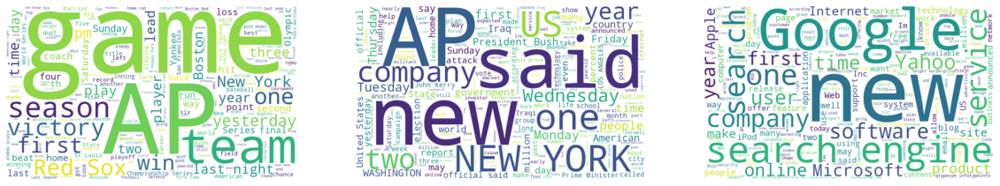

In [ ]:
import matplotlib.pyplot as plt

# Display the generated image:
plt.figure( figsize=(20,20))
plt.subplot(1,3,1)
plt.imshow(wordcloud0, interpolation='bilinear')
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(wordcloud1, interpolation='bilinear')
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(wordcloud2, interpolation='bilinear')
plt.axis("off")
plt.show()

On retrouve les mêmes clusters qu'avec Glove ou Word2Vec. Ils ont du sens sémantiquement.

On peut essayer avec k = 4 pour voir si les outliers correspondent à quelque chose.

In [ ]:
pred_labels = KMeans(4,random_state=42).fit(X_rob_autoenc).labels_

In [ ]:
dic = {'text': texts_cleaned, 'cluster': pred_labels}
df_texts = pd.DataFrame(data=dic)

#### **Nuage de mots** (k = 4)

In [ ]:
from wordcloud import WordCloud

# cluster 0
wholeText0 = " ".join(t for t in df_texts.loc[df_texts['cluster'] == 0, 'text'])
wordcloud0 = WordCloud(width=1000, height=600, background_color="white").generate(wholeText0)

# cluster 1
wholeText1 = " ".join(t for t in df_texts.loc[df_texts['cluster'] == 1, 'text'])
wordcloud1 = WordCloud(width=1000, height=600, background_color="white").generate(wholeText1)

# cluster 2
wholeText2 = " ".join(t for t in df_texts.loc[df_texts['cluster'] == 2, 'text'])
wordcloud2 = WordCloud(width=1000, height=600, background_color="white").generate(wholeText2)

# cluster 3
wholeText3 = " ".join(t for t in df_texts.loc[df_texts['cluster'] == 3, 'text'])
wordcloud3 = WordCloud(width=1000, height=600, background_color="white").generate(wholeText3)

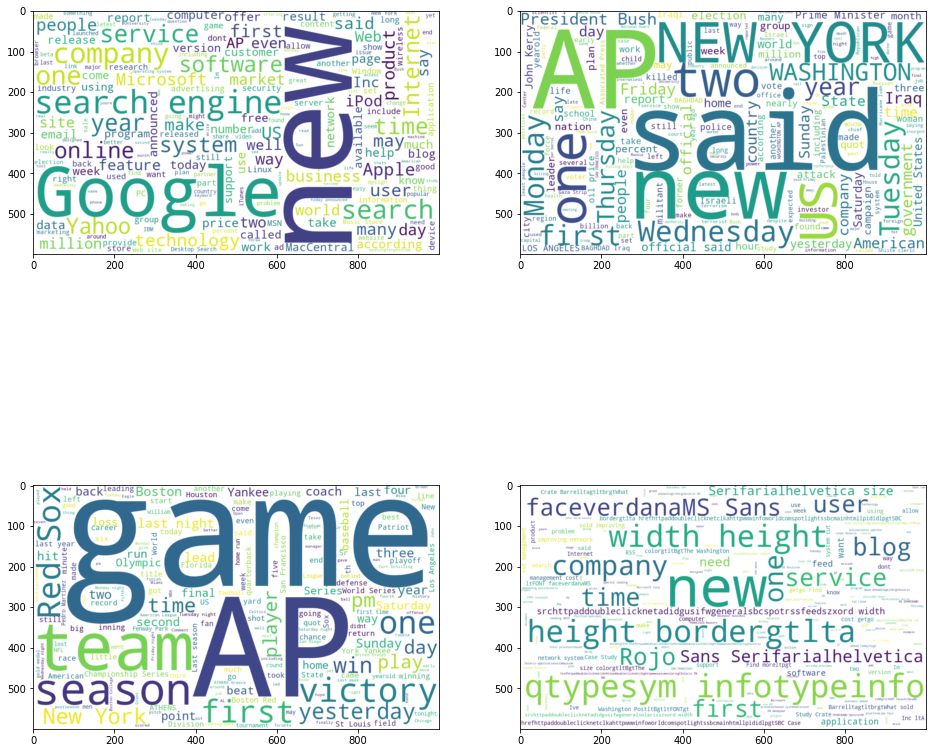

In [ ]:
import matplotlib.pyplot as plt


fig,axs = plt.subplots(2,2,figsize=(16,16))
axs[0,0].imshow(wordcloud0, interpolation='bilinear')
axs[1,0].imshow(wordcloud1, interpolation='bilinear')
axs[0,1].imshow(wordcloud2, interpolation='bilinear')
axs[1,1].imshow(wordcloud3, interpolation='bilinear')

plt.show()

Avec K=4, on voit que le dernier cluster n'a pas de sens, ce n'est pas un sujet général mais plutôt la combinaison de mots relatifs au formattage du texte. Ce cluster n'a pas de portée sémantique.
Le choix de K=3 était donc le bon.

## Approches combinées 

### Reduced k-means 

  |======================================================================| 100%Silhouette score dans l'espace d'origine (distance cosine) :
0.14826296
Silhouette score dans l'espace réduit(distance euclidienne) :
0.5661088315445074


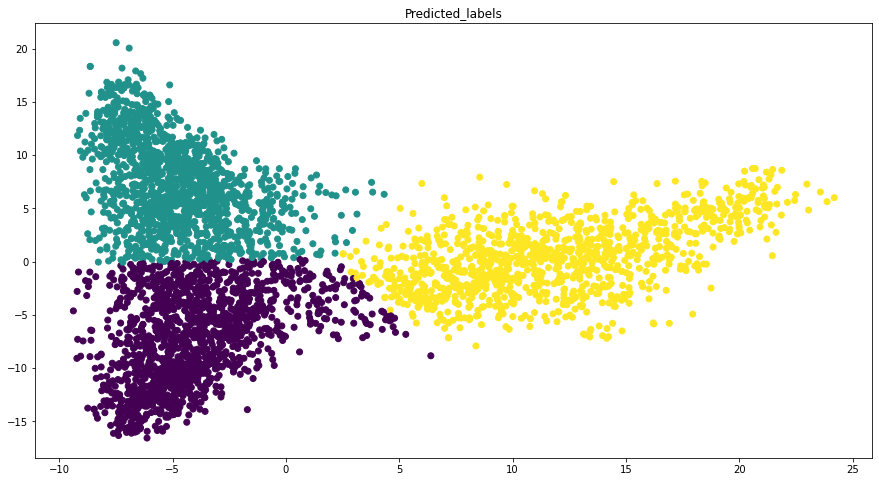

In [ ]:
rkm = fcps.TandemClustering(X_rob,k,Type='Reduced', PlotIt=False,ndim=2,nstart=10)
pred_labels = rkm[0]
X_rob_reduced = rkm[1][0]
eval_clustering_2D_nolabels(X_rob_reduced, pred_labels)
printSilhouetteScores(X_rob, pred_labels, X_rob_reduced)

Reduced KM fournit de très bons résultats.

### Factorial k-means 

  |======================================================================| 100%Silhouette score dans l'espace d'origine (distance cosine) :
0.07876504
Silhouette score dans l'espace réduit(distance euclidienne) :
-0.020215099450894683


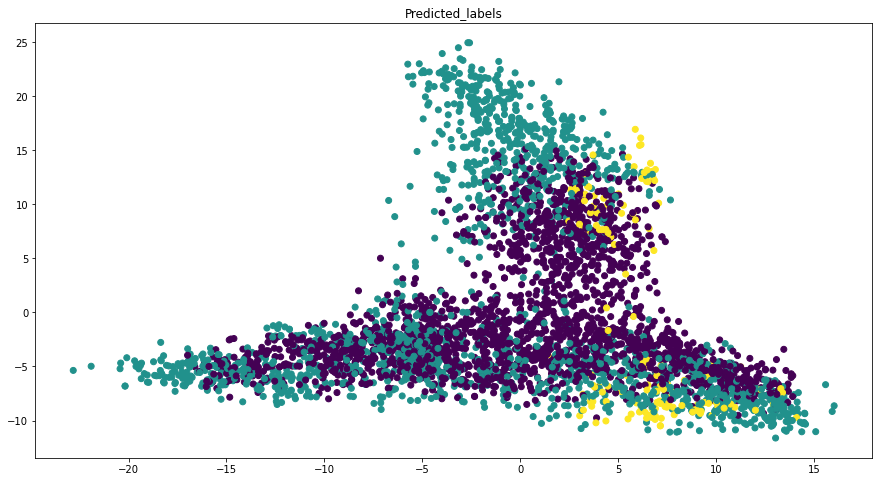

In [ ]:
rkm = fcps.TandemClustering(X_rob,k,Type='Factorial', PlotIt=False,ndim=2,nstart=10)
pred_labels = rkm[0]
X_rob_reduced = rkm[1][0]
eval_clustering_2D_nolabels(X_rob_reduced, pred_labels)
printSilhouetteScores(X_rob, pred_labels, X_rob_reduced)

Factorial KM n'a pas bien fonctionné sur nos données, en visualisant l'espace réduit obtenu, on voit bien que ce dernier est de très mauvaise qualité

### Deep Clustering Network

### Code de DCN et DKM

In [ ]:
import os
import math
import numpy as np
import tensorflow.compat.v1 as tf
from sklearn.cluster import KMeans
from tqdm import tqdm

"""
  Credits:
    This code is based on the implementation provided by Maziar Moradi Fard and Thibaut Thonet
    Available in: https://github.com/MaziarMF/deep-k-means
"""

TF_FLOAT_TYPE = tf.float32

tf.disable_eager_execution()

def fc_layers(input, specs):
    [dimensions, activations, names] = specs
    for dimension, activation, name in zip(dimensions, activations, names):
        input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)
    return input

def autoencoder(input, specs):
    [dimensions, activations, names] = specs
    mid_ind = int(len(dimensions)/2)

    # Encoder
    embedding = fc_layers(input, [dimensions[:mid_ind], activations[:mid_ind], names[:mid_ind]])
    # Decoder
    output = fc_layers(embedding, [dimensions[mid_ind:], activations[mid_ind:], names[mid_ind:]])

    return embedding, output

def f_func(x, y):
    return tf.reduce_sum(tf.square(x - y), axis=1)

def g_func(x, y):
    return tf.reduce_sum(tf.square(x - y), axis=1)

def next_batch(num, data):
    """
    Return a total of `num` random samples.
    """
    indices = np.arange(0, data.shape[0])
    np.random.shuffle(indices)
    indices = indices[:num]
    batch_data = np.asarray([data[i, :] for i in indices])

    return indices, batch_data


#######################################################
############### Deep Clustering Network ###############
#######################################################

class DcnCompGraph(object):
    """Computation graph for the Deep Clustering Network model proposed in:
        Yang, B., Fu, X., Sidiropoulos, N. D., & Hong, M. (2017). Towards K-means-friendly Spaces: Simultaneous Deep
        Learning and Clustering. In ICML '17 (pp. 3861–3870).
    This implementation is inspired by https://github.com/boyangumn/DCN
    """

    def __init__(self, ae_specs, n_clusters, batch_size, n_samples, val_lambda):
        input_size = ae_specs[0][-1]
        embedding_size = ae_specs[0][int((len(ae_specs[0]) - 1) / 2)]

        # Placeholder tensor for input data
        self.input = tf.placeholder(dtype=TF_FLOAT_TYPE, shape=(batch_size, input_size))

        # Auto-encoder loss computations
        self.embedding, self.output = autoencoder(self.input, ae_specs)  # Get the auto-encoder's embedding and output
        rec_error = g_func(self.input, self.output)  # Reconstruction error based on distance g
        self.ae_loss = tf.reduce_mean(rec_error)

        # Clustering loss computations
        ## Tensor for cluster representatives
        minval_rep, maxval_rep = -1, 1
        self.cluster_rep = tf.Variable(tf.random_uniform([n_clusters, embedding_size],
                                                    minval=minval_rep, maxval=maxval_rep,
                                                    dtype=TF_FLOAT_TYPE), name='cluster_rep', dtype=TF_FLOAT_TYPE)

        ## Clustering assignments for all samples in the dataset
        initial_clustering_assign = tf.random_uniform(minval=0, maxval=n_clusters, dtype=tf.int32, shape=[n_samples])
        self.cluster_assign = tf.Variable(initial_clustering_assign, name='cluster_assign', dtype=tf.int32, trainable=False)

        ## Get the cluster representative corresponding to the cluster of each batch sample
        self.indices = tf.placeholder(dtype=tf.int32, shape=batch_size)  # Placeholder for sample indices in current batch
        batch_clust_rep = []
        for j in range(batch_size):
            k = self.cluster_assign[self.indices[j]]  # Clustering assignment for sample j in batch
            batch_clust_rep.append(self.cluster_rep[k, :])
        stack_batch_clust_rep = tf.stack(batch_clust_rep)

        ## Compute the k-means term
        clustering_error = f_func(self.embedding, stack_batch_clust_rep)

        # Compute the full loss combining the reconstruction error and k-means term
        self.ae_loss = tf.reduce_mean(rec_error)
        self.kmeans_loss = tf.reduce_mean(clustering_error)
        self.loss = self.ae_loss + val_lambda * self.kmeans_loss

        # The optimizer is defined to minimize this loss
        optimizer = tf.train.AdamOptimizer()
        self.pretrain_op = optimizer.minimize(self.ae_loss) # Pretrain the autoencoder before starting DCN
        self.train_op = optimizer.minimize(self.loss)

        # As it has been pointed out in the DCN paper, first the weights of the autoencoder shall be trained then the
        # assignments and cluster representatives. So far in the computation graph we have optimized the weights of the
        # autoencoder, now it's the time for the assignments and representatives.

        # Update the clustering assignments
        for j in range(batch_size):
            # Find which cluster representative is the closest to the current batch sample
            new_assign = tf.argmin(f_func(tf.reshape(self.embedding[j, :], (1, embedding_size)), self.cluster_rep),
                                   output_type=tf.int32)
            # Update the clustering assignment
            self.cluster_assign_update = tf.assign(self.cluster_assign[self.indices[j]], new_assign)

        # Update the cluster representatives
        ## Initialize the value of count
        initial_count = tf.constant(100.0, shape=[n_clusters])
        count = tf.Variable(initial_count, name='count', dtype=TF_FLOAT_TYPE, trainable=False)
        ## Update the cluster representatives according to Equation (8) in the DCN paper
        for j in range(batch_size):
            k = self.cluster_assign[self.indices[j]]  # Clustering assignment for sample j in batch
            self.count_update = tf.assign(count[k], count[k] + 1)  # Updated count for cluster assignments
            new_rep = self.cluster_rep[k] - (1 / count[k]) * (self.cluster_rep[k] - self.embedding[j])
            self.cluster_rep_update = tf.assign(self.cluster_rep[k], new_rep)

def DCN(data, n_clusters, n_components, n_pretrain_epochs=50, n_finetuning_epochs=50, lambda_=1.0, batch_size=256, seed=None, cpu=False):
    # Auto-encoder architecture
    input_size = data.shape[1]
    hidden_1_size = 500
    hidden_2_size = 500
    hidden_3_size = 2000
    embedding_size = n_components
    dimensions = [hidden_1_size, hidden_2_size, hidden_3_size, embedding_size, # Encoder layer dimensions
                  hidden_3_size, hidden_2_size, hidden_1_size, input_size] # Decoder layer dimensions
    activations = [tf.nn.relu, tf.nn.relu, tf.nn.relu, None, # Encoder layer activations
                  tf.nn.relu, tf.nn.relu, tf.nn.relu, None] # Decoder layer activations
    names = ['enc_hidden_1', 'enc_hidden_2', 'enc_hidden_3', 'embedding', # Encoder layer names
            'dec_hidden_1', 'dec_hidden_2', 'dec_hidden_3', 'output'] # Decoder layer names

    n_samples = data.shape[0]
    n_batches = int(math.ceil(n_samples / batch_size)) # Number of mini-batches
    pretrain = True # Specify if DKM's autoencoder should be pretrained

    # Hardware specifications
    if cpu:
        os.environ['CUDA_VISIBLE_DEVICES'] = '-1' # Run on CPU instead of GPU if batch_size is small
    gpu_options = tf.GPUOptions(per_process_gpu_memory_fraction=0.05)

    if seed is not None:
      tf.reset_default_graph()
      tf.set_random_seed(seed)
      np.random.seed(seed)

    cg = DcnCompGraph([dimensions, activations, names], n_clusters, batch_size, n_samples,
                      lambda_)

    # Run the computation graph
    with tf.Session(config=tf.ConfigProto(gpu_options=gpu_options)) as sess:
        # Initialization
        init = tf.global_variables_initializer()
        sess.run(init)

        # Pretrain if specified
        if pretrain:
            print("Starting autoencoder pretraining...")

            # Variables to save pretraining tensor content
            embeddings = np.zeros((n_samples, embedding_size), dtype=float)

            # First, pretrain the autoencoder
            ## Loop over epochs
            for _ in tqdm(range(n_pretrain_epochs)):

                # Loop over the samples
                for _ in range(n_batches):
                    # Fetch a random data batch of the specified size
                    indices_, data_batch = next_batch(batch_size, data)

                    # Run the computation graph until pretrain_op (only on autoencoder) on the data batch
                    _, embedding_, ae_loss_ = sess.run((cg.pretrain_op, cg.embedding, cg.ae_loss),
                                                       feed_dict={cg.input: data_batch})

                    # Save the embeddings for batch samples
                    for j in range(len(indices_)):
                        embeddings[indices_[j], :] = embedding_[j, :]

            # Second, run k-means++ on the pretrained embeddings
            print("Running k-means on the learned embeddings...")
            kmeans_model = KMeans(n_clusters=n_clusters, init="k-means++").fit(embeddings)

            # The cluster centers are used to initialize the cluster representatives in DCN
            sess.run(tf.assign(cg.cluster_rep, kmeans_model.cluster_centers_))

            # The clustering assignments are used to initialize the clustering assignments in DCN
            sess.run(tf.assign(cg.cluster_assign, kmeans_model.labels_))

        # Train the full DCN model
        print("Starting DCN training...")
        ## Loop over epochs
        for epoch in tqdm(range(n_finetuning_epochs)):
            # print("Training step: epoch {}".format(epoch))

            # Loop over the samples
            for _ in range(n_batches):
                # Fetch a random data batch of the specified size
                indices_, data_batch = next_batch(batch_size, data)

                # Run the computation graph on the data batch
                _, _, _, _, loss_, cluster_assign_, ae_loss_, kmeans_loss_ =\
                    sess.run((cg.train_op, cg.cluster_assign_update, cg.count_update, cg.cluster_rep_update, cg.loss,
                              cg.cluster_assign, cg.ae_loss, cg.kmeans_loss),
                             feed_dict={cg.input: data_batch, cg.indices: indices_})
        
        embeddings = np.zeros((n_samples, embedding_size), dtype=float)
        for _ in range(n_batches):
            # Fetch a random data batch of the specified size
            indices_, data_batch = next_batch(batch_size, data)

            # Run the computation graph on the data batch
            _, _, embeddings_, _, _, loss_, cluster_assign_, ae_loss_, kmeans_loss_ =\
                sess.run((cg.train_op, cg.cluster_assign_update, cg.embedding, cg.count_update, cg.cluster_rep_update, cg.loss,
                          cg.cluster_assign, cg.ae_loss, cg.kmeans_loss),
                          feed_dict={cg.input: data_batch, cg.indices: indices_})

            for j in range(len(indices_)):
                embeddings[indices_[j], :] = embeddings_[j, :]
                
    return embeddings, cluster_assign_


#######################################################
##################### Deep K-means ####################
#######################################################

class DkmCompGraph(object):
    """Computation graph for Deep K-Means
    """

    def __init__(self, ae_specs, n_clusters, val_lambda):
        input_size = ae_specs[0][-1]
        embedding_size = ae_specs[0][int((len(ae_specs[0])-1)/2)]

        # Placeholder tensor for input data
        self.input = tf.placeholder(dtype=TF_FLOAT_TYPE, shape=(None, input_size))

        # Auto-encoder loss computations
        self.embedding, self.output = autoencoder(self.input, ae_specs)  # Get the auto-encoder's embedding and output
        rec_error = g_func(self.input, self.output)  # Reconstruction error based on distance g

        # k-Means loss computations
        ## Tensor for cluster representatives
        minval_rep, maxval_rep = -1, 1
        self.cluster_rep = tf.Variable(tf.random_uniform([n_clusters, embedding_size],
                                                    minval=minval_rep, maxval=maxval_rep,
                                                    dtype=TF_FLOAT_TYPE), name='cluster_rep', dtype=TF_FLOAT_TYPE)

        ## First, compute the distance f between the embedding and each cluster representative
        list_dist = []
        for i in range(0, n_clusters):
            dist = f_func(self.embedding, tf.reshape(self.cluster_rep[i, :], (1, embedding_size)))
            list_dist.append(dist)
        self.stack_dist = tf.stack(list_dist)

        ## Second, find the minimum squared distance for softmax normalization
        min_dist = tf.reduce_min(list_dist, axis=0)

        ## Third, compute exponentials shifted with min_dist to avoid underflow (0/0) issues in softmaxes
        self.alpha = tf.placeholder(dtype=TF_FLOAT_TYPE, shape=())  # Placeholder tensor for alpha
        list_exp = []
        for i in range(n_clusters):
            exp = tf.exp(-self.alpha * (self.stack_dist[i] - min_dist))
            list_exp.append(exp)
        stack_exp = tf.stack(list_exp)
        sum_exponentials = tf.reduce_sum(stack_exp, axis=0)

        ## Fourth, compute softmaxes and the embedding/representative distances weighted by softmax
        list_softmax = []
        list_weighted_dist = []
        for j in range(n_clusters):
            softmax = stack_exp[j] / sum_exponentials
            weighted_dist = self.stack_dist[j] * softmax
            list_softmax.append(softmax)
            list_weighted_dist.append(weighted_dist)
        stack_weighted_dist = tf.stack(list_weighted_dist)

        # Compute the full loss combining the reconstruction error and k-means term
        self.ae_loss = tf.reduce_mean(rec_error)
        self.kmeans_loss = tf.reduce_mean(tf.reduce_sum(stack_weighted_dist, axis=0))
        self.loss = self.ae_loss + val_lambda * self.kmeans_loss

        # The optimizer is defined to minimize this loss
        optimizer = tf.train.AdamOptimizer()
        self.pretrain_op = optimizer.minimize(self.ae_loss) # Pretrain the autoencoder before starting DKM
        self.train_op = optimizer.minimize(self.loss) # Train the whole DKM model

def DKM(data, n_clusters, n_components, n_pretrain_epochs=50, n_finetuning_epochs=5, lambda_=1.0, batch_size=256, seed=None, cpu=False):
    """
        The final number of finetuning epochs is n_finetuning_epochs * 20 if pretrain and n_finetuning_epochs * 40 if annealing
    """
    # Auto-encoder architecture
    input_size = data.shape[1]
    hidden_1_size = 500
    hidden_2_size = 500
    hidden_3_size = 2000
    embedding_size = n_components
    dimensions = [hidden_1_size, hidden_2_size, hidden_3_size, embedding_size, # Encoder layer dimensions
                  hidden_3_size, hidden_2_size, hidden_1_size, input_size] # Decoder layer dimensions
    activations = [tf.nn.relu, tf.nn.relu, tf.nn.relu, None, # Encoder layer activations
                  tf.nn.relu, tf.nn.relu, tf.nn.relu, None] # Decoder layer activations
    names = ['enc_hidden_1', 'enc_hidden_2', 'enc_hidden_3', 'embedding', # Encoder layer names
            'dec_hidden_1', 'dec_hidden_2', 'dec_hidden_3', 'output'] # Decoder layer names

    n_samples = data.shape[0]
    n_batches = int(math.ceil(n_samples / batch_size)) # Number of mini-batches
    pretrain = True # Specify if DKM's autoencoder should be pretrained
    annealing = False # Specify if annealing should be used

    # Define the alpha scheme depending on if the approach includes annealing/pretraining
    if annealing and not pretrain:
        constant_value = 1  # specs.embedding_size # Used to modify the range of the alpha scheme
        max_n = 40  # Number of alpha values to consider
        alphas = np.zeros(max_n, dtype=float)
        alphas[0] = 0.1
        for i in range(1, max_n):
            alphas[i] = (2 ** (1 / (np.log(i + 1)) ** 2)) * alphas[i - 1]
        alphas = alphas / constant_value
    elif not annealing and pretrain:
        constant_value = 1  # specs.embedding_size # Used to modify the range of the alpha scheme
        max_n = 20  # Number of alpha values to consider (constant values are used here)
        alphas = 1000*np.ones(max_n, dtype=float) # alpha is constant
        alphas = alphas / constant_value
    else:
        raise Exception("Run with either annealing (-a) or pretraining (-p), but not both.")

    # Hardware specifications
    if cpu:
        os.environ['CUDA_VISIBLE_DEVICES'] = '-1' # Run on CPU instead of GPU if batch_size is small

    gpu_options = tf.GPUOptions(per_process_gpu_memory_fraction=0.05)
    config = tf.ConfigProto(gpu_options=gpu_options)

    if seed is not None:
      tf.reset_default_graph()
      tf.set_random_seed(seed)
      np.random.seed(seed)
      
    # Define the computation graph for DKM
    cg = DkmCompGraph([dimensions, activations, names], n_clusters, lambda_)

    # Run the computation graph
    with tf.Session(config=config) as sess:
        # Initialization
        init = tf.global_variables_initializer()
        sess.run(init)

        # Variables to save tensor content
        distances = np.zeros((n_clusters, n_samples))

        # Pretrain if specified
        if pretrain:
            print("Starting autoencoder pretraining...")

            # Variables to save pretraining tensor content
            embeddings = np.zeros((n_samples, embedding_size), dtype=float)

            # First, pretrain the autoencoder
            ## Loop over epochs
            for _ in tqdm(range(n_pretrain_epochs)):
                # Loop over the samples
                for _ in range(n_batches):
                    # Fetch a random data batch of the specified size
                    indices, data_batch = next_batch(batch_size, data)

                    # Run the computation graph until pretrain_op (only on autoencoder) on the data batch
                    _, embedding_, ae_loss_ = sess.run((cg.pretrain_op, cg.embedding, cg.ae_loss),
                                                        feed_dict={cg.input: data_batch})

                    # Save the embeddings for batch samples
                    for j in range(len(indices)):
                        embeddings[indices[j], :] = embedding_[j, :]

            # Second, run k-means++ on the pretrained embeddings
            print("Running k-means on the learned embeddings...")
            kmeans_model = KMeans(n_clusters=n_clusters, init="k-means++").fit(embeddings)

            # The cluster centers are used to initialize the cluster representatives in DKM
            sess.run(tf.assign(cg.cluster_rep, kmeans_model.cluster_centers_))

        # Train the full DKM model
        if (len(alphas) > 0):
            print("Starting DKM training...")
        ## Loop over alpha (inverse temperature), from small to large values
        for k in tqdm(range(len(alphas))):
            # Loop over epochs per alpha
            for _ in range(n_finetuning_epochs):
                # Loop over the samples
                for _ in range(n_batches):
                    # Fetch a random data batch of the specified size
                    indices, data_batch = next_batch(batch_size, data)

                    # Run the computation graph on the data batch
                    _, loss_, stack_dist_, cluster_rep_, ae_loss_, kmeans_loss_ =\
                        sess.run((cg.train_op, cg.loss, cg.stack_dist, cg.cluster_rep, cg.ae_loss, cg.kmeans_loss),
                                  feed_dict={cg.input: data_batch, cg.alpha: alphas[k]})

                    # Save the distances for batch samples
                    for j in range(len(indices)):
                        distances[:, indices[j]] = stack_dist_[:, j]

        _, loss_, X_reduced, stack_dist_, cluster_rep_, ae_loss_, kmeans_loss_ =\
        sess.run((cg.train_op, cg.loss, cg.embedding, cg.stack_dist, cg.cluster_rep, cg.ae_loss, cg.kmeans_loss),
                  feed_dict={cg.input: data, cg.alpha: alphas[k]})

        distances = stack_dist_

        # Infer cluster assignments for all samples
        cluster_assign = np.zeros((n_samples), dtype=float)
        for i in range(n_samples):
            index_closest_cluster = np.argmin(distances[:, i])
            cluster_assign[i] = index_closest_cluster
        cluster_assign = cluster_assign.astype(np.int64)

    return X_reduced, cluster_assign

### DCN

In [ ]:
embeddings, cluster_assign_ = DCN(X_rob, n_clusters=k,n_components=2)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:21: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
/usr/local/lib/python3.7/dist-packages/keras/legacy_tf_layers/core.py:255: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  return layer.apply(inputs)


Starting autoencoder pretraining...


100%|██████████| 50/50 [02:08<00:00,  2.56s/it]


Running k-means on the learned embeddings...
Starting DCN training...


100%|██████████| 50/50 [02:28<00:00,  2.97s/it]


Silhouette score dans l'espace d'origine (distance cosine) :
0.18017985
Silhouette score dans l'espace réduit(distance euclidienne) :
0.25729942384360616


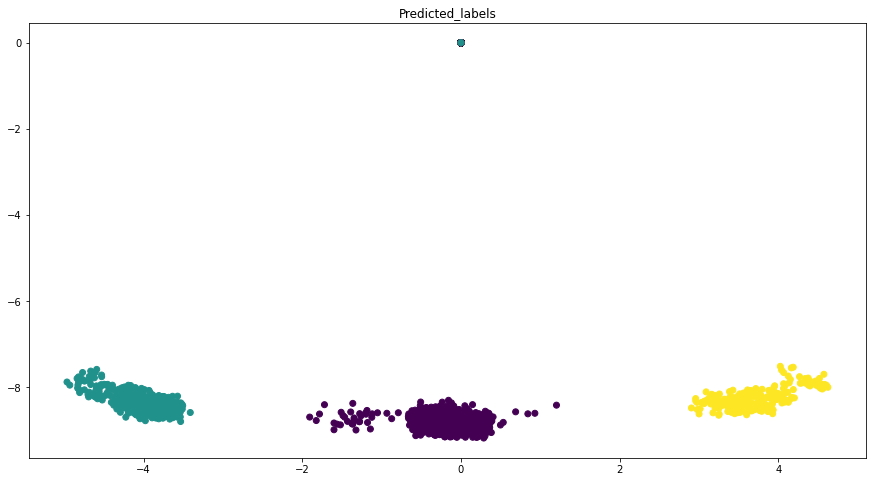

In [ ]:
eval_clustering_2D_nolabels(embeddings, cluster_assign_)
printSilhouetteScores(X_rob, cluster_assign_, embeddings)

On obtient vraiment 3 clusters distincts avec DCN, et même si le silhouette score n'est pas très elevé, ça reste très intéressant puisqu'on a vu précedemment que le dataset pouvait être divisé en 3 et que ça avait du sens.

### Deep k-means

In [ ]:
tf.reset_default_graph()

In [ ]:
X_reduced, cluster_assign_dkm = DKM(X_rob,n_clusters=k,n_components=2)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:21: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
/usr/local/lib/python3.7/dist-packages/keras/legacy_tf_layers/core.py:255: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  return layer.apply(inputs)


Starting autoencoder pretraining...


100%|██████████| 50/50 [02:14<00:00,  2.68s/it]


Running k-means on the learned embeddings...
Starting DKM training...


100%|██████████| 20/20 [04:29<00:00, 13.45s/it]


Silhouette score dans l'espace d'origine (distance cosine) :
0.16273302
Silhouette score dans l'espace réduit(distance euclidienne) :
0.8837557


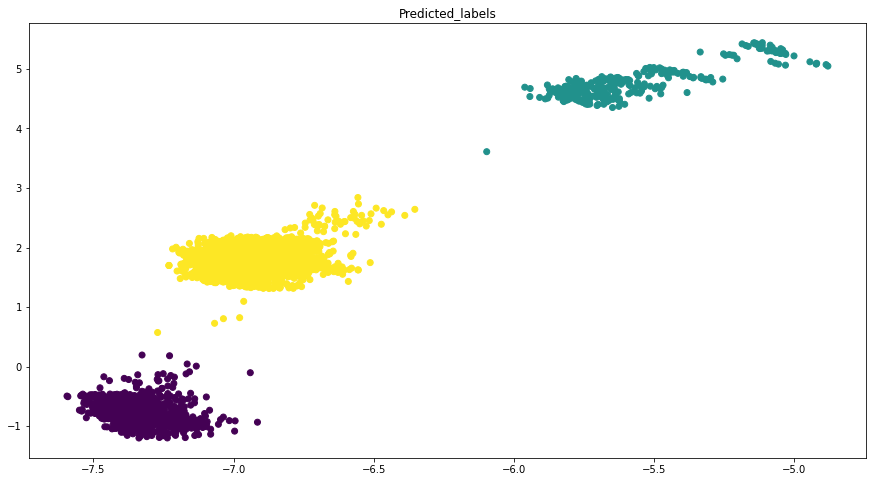

In [ ]:
eval_clustering_2D_nolabels(X_reduced, cluster_assign_dkm)
printSilhouetteScores(X_rob, cluster_assign_dkm, X_reduced)

DKM nous donne de très bons résultats et un silhouette score impressionnant.

## Interprétation des clusters

Nous allons choisir comme clusters ceux donnés par DKM, puisque c'est la méthode qui donnait les meilleurs scores

In [ ]:
pred_labels = cluster_assign_dkm

In [ ]:
# Nettoyage du texte avant le nuage de mots
texts_cleaned = texts.map(lambda t: clean_text(t))


In [ ]:
dic = {'text': texts_cleaned, 'cluster': pred_labels}
df_texts = pd.DataFrame(data=dic)

In [ ]:
df_texts

,text,cluster
0,Eli Manning remains New York Giants quarterbac...,0
1,extra hour exercise week could significantly c...,2
2,AP Boston Red Sox send hobbled star Curt Schil...,0
3,BASEBALL Arizona NL Named Bob Gebhard assistan...,0
4,CFHT Twentyfive year ago September CanadaFranc...,2
...,...,...
3980,GEORGE TOWN Cayman Islands strengthened Hurric...,2
3981,Findcom business search engine wwwfindcom toda...,2
3982,followed Arkansas football last four year know...,0
3983,Loren Woods point careerhigh rebound Vince Car...,0


### **Nuage de mots** (DKM)

In [ ]:
from wordcloud import WordCloud

# cluster 0
wholeText0 = " ".join(t for t in df_texts.loc[df_texts['cluster'] == 0, 'text'])
wordcloud0 = WordCloud(width=1000, height=600, background_color="white").generate(wholeText0)

# cluster 1
wholeText1 = " ".join(t for t in df_texts.loc[df_texts['cluster'] == 1, 'text'])
wordcloud1 = WordCloud(width=1000, height=600, background_color="white").generate(wholeText1)

# cluster 2
wholeText2 = " ".join(t for t in df_texts.loc[df_texts['cluster'] == 2, 'text'])
wordcloud2 = WordCloud(width=1000, height=600, background_color="white").generate(wholeText2)

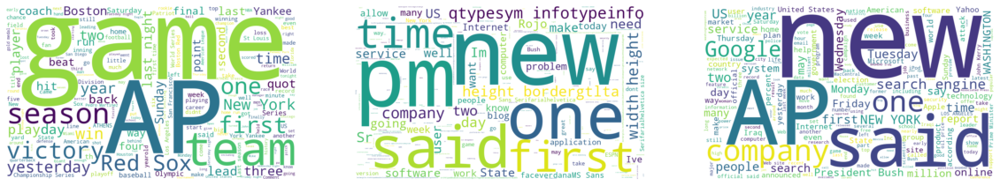

In [ ]:
import matplotlib.pyplot as plt

# Display the generated image:
plt.figure( figsize=(20,20))
plt.subplot(1,3,1)
plt.imshow(wordcloud0, interpolation='bilinear')
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(wordcloud1, interpolation='bilinear')
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(wordcloud2, interpolation='bilinear')
plt.axis("off")
plt.show()

Les clusters obtenus par DKM ont finalement moins de sens que ceux qu'on avait trouvé précédemment. Hormis le cluster de baseball, les deux autres ont l'air assez mélangés.

In [ ]:
pred_labels = cluster_assign_

In [ ]:
dic = {'text': texts_cleaned, 'cluster': pred_labels}
df_texts = pd.DataFrame(data=dic)

### **Nuage de mots** (DCN)

In [ ]:
from wordcloud import WordCloud

# cluster 0
wholeText0 = " ".join(t for t in df_texts.loc[df_texts['cluster'] == 0, 'text'])
wordcloud0 = WordCloud(width=1000, height=600, background_color="white").generate(wholeText0)

# cluster 1
wholeText1 = " ".join(t for t in df_texts.loc[df_texts['cluster'] == 1, 'text'])
wordcloud1 = WordCloud(width=1000, height=600, background_color="white").generate(wholeText1)

# cluster 2
wholeText2 = " ".join(t for t in df_texts.loc[df_texts['cluster'] == 2, 'text'])
wordcloud2 = WordCloud(width=1000, height=600, background_color="white").generate(wholeText2)

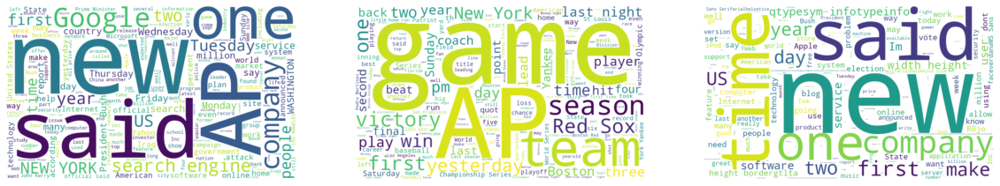

In [ ]:
import matplotlib.pyplot as plt

# Display the generated image:
plt.figure( figsize=(20,20))
plt.subplot(1,3,1)
plt.imshow(wordcloud0, interpolation='bilinear')
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(wordcloud1, interpolation='bilinear')
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(wordcloud2, interpolation='bilinear')
plt.axis("off")
plt.show()

Là encore, avec les résultats de DCN, deux des clusters sont assez mélangés sémantiquement même s'ils paraissent être très séparés dans l'espace réduit.

### **Nuage de mots** (Reduced KM)

In [ ]:
rkm = fcps.TandemClustering(X_rob,k,Type='Reduced', PlotIt=False,ndim=2,nstart=10)
pred_labels = rkm[0]

  |======================================================================| 100%

In [ ]:
dic = {'text': texts_cleaned, 'cluster': pred_labels - 1}
df_texts = pd.DataFrame(data=dic)

In [ ]:
from wordcloud import WordCloud

# cluster 0
wholeText0 = " ".join(t for t in df_texts.loc[df_texts['cluster'] == 0, 'text'])
wordcloud0 = WordCloud(width=1000, height=600, background_color="white").generate(wholeText0)

# cluster 1
wholeText1 = " ".join(t for t in df_texts.loc[df_texts['cluster'] == 1, 'text'])
wordcloud1 = WordCloud(width=1000, height=600, background_color="white").generate(wholeText1)

# cluster 2
wholeText2 = " ".join(t for t in df_texts.loc[df_texts['cluster'] == 2, 'text'])
wordcloud2 = WordCloud(width=1000, height=600, background_color="white").generate(wholeText2)

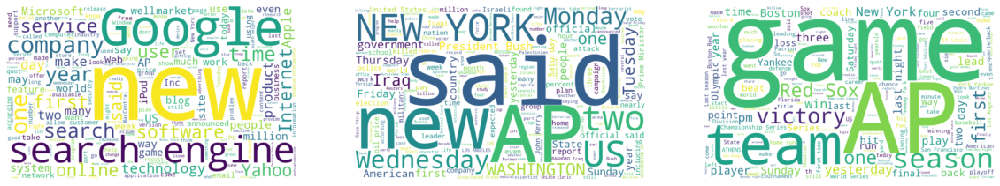

In [ ]:
import matplotlib.pyplot as plt

# Display the generated image:
plt.figure( figsize=(20,20))
plt.subplot(1,3,1)
plt.imshow(wordcloud0, interpolation='bilinear')
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(wordcloud1, interpolation='bilinear')
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(wordcloud2, interpolation='bilinear')
plt.axis("off")
plt.show()

Avec Reduced KM, on retrouve 3 clusters très distincts sémantiquement et donc de meilleure qualité.

# Conclusion

Avec un embedding Glove et Word2Vec, UMAP et TSNE restent les meilleurs algorithmes de réduction de dimension, tandis que sur BERT et ROBERTA, l'autoencoder donne de meilleurs résultats.

KMeans, malgré ses défauts, reste l'algorithme de clustering le plus performant, surtout sur les espaces réduits. En grande dimension, Spectral Clustering est assez performant.

Sur ces jeux de données non-labellisés, Reduced KMeans est la méthode combinée qui fonctionne le mieux.

Nous avons pu voir que le silhouette score est une mesure intéressante mais à manier avec précaution, car sur ROBERTA les méthodes combinées "Deep" obtenaient de très bons scores et des espaces réduits a priori intéressants, mais les clusters résultants avaient finalement moins de sens sémantiquement qu'avec d'autres méthodes.